In [1]:
import datetime as dt
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import math
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler

import argparse
import logging
import os
import time
import random
from collections import namedtuple
from typing import Optional, Union
import torch
import torch.nn.functional as F
import torch.nn.init as init
from torch import nn, optim, distributions
import torch.backends.cudnn as cudnn
import tqdm
from scipy.stats import levy_stable
import torchsde
#画热图
import seaborn as sns

In [2]:
def setup_seed(seed):
      torch.manual_seed(seed)
      torch.cuda.manual_seed_all(seed)
      np.random.seed(seed)
      # random.seed(seed)
      torch.backends.cudnn.deterministic = True

In [3]:
setup_seed(1)

In [4]:
data = pd.read_csv("SZNY.csv")

In [5]:
data

,Unnamed: 0,open,close,high,low,volume,date
0,2009/1/9,1690.11,1727.01,1736.81,1690.11,359047000,2009/1/9
1,2009/1/12,1717.08,1715.86,1750.63,1699.80,368549600,2009/1/12
2,2009/1/13,1697.11,1667.97,1697.70,1667.64,275230800,2009/1/13
3,2009/1/14,1664.33,1750.08,1750.60,1664.33,362291600,2009/1/14
4,2009/1/15,1729.16,1739.64,1760.49,1721.28,434220600,2009/1/15
...,...,...,...,...,...,...,...
3081,2021/9/8,1649.46,1684.88,1706.39,1641.30,3386234900,2021/9/8
3082,2021/9/9,1703.47,1781.67,1801.80,1689.20,4390856100,2021/9/9
3083,2021/9/10,1754.96,1723.91,1785.68,1716.14,4661665500,2021/9/10
3084,2021/9/13,1737.04,1822.08,1836.49,1737.04,4234321000,2021/9/13


In [6]:
data=data[['date','open','close','high','low','volume']]

In [7]:
data

,date,open,close,high,low,volume
0,2009/1/9,1690.11,1727.01,1736.81,1690.11,359047000
1,2009/1/12,1717.08,1715.86,1750.63,1699.80,368549600
2,2009/1/13,1697.11,1667.97,1697.70,1667.64,275230800
3,2009/1/14,1664.33,1750.08,1750.60,1664.33,362291600
4,2009/1/15,1729.16,1739.64,1760.49,1721.28,434220600
...,...,...,...,...,...,...
3081,2021/9/8,1649.46,1684.88,1706.39,1641.30,3386234900
3082,2021/9/9,1703.47,1781.67,1801.80,1689.20,4390856100
3083,2021/9/10,1754.96,1723.91,1785.68,1716.14,4661665500
3084,2021/9/13,1737.04,1822.08,1836.49,1737.04,4234321000


In [8]:
data.set_index(pd.Index(np.linspace(1, len(data.index), len(data.index), dtype = int)))
data['date']= pd.to_datetime(data['date']) 
data.head()

<ipython-input-8-63f075f7c65e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['date']= pd.to_datetime(data['date'])


,date,open,close,high,low,volume
0,2009-01-09,1690.11,1727.01,1736.81,1690.11,359047000
1,2009-01-12,1717.08,1715.86,1750.63,1699.80,368549600
2,2009-01-13,1697.11,1667.97,1697.70,1667.64,275230800
3,2009-01-14,1664.33,1750.08,1750.60,1664.33,362291600
4,2009-01-15,1729.16,1739.64,1760.49,1721.28,434220600


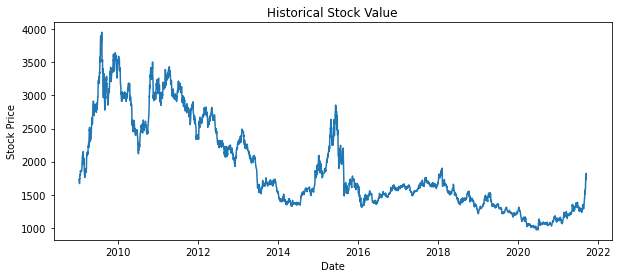

In [9]:
# Visualize the plot
plt.figure(figsize=(10,4))
plt.plot(data['date'],data['close'])
plt.title('Historical Stock Value')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.show()

# Data Cleaning and Splitting

In [10]:
# Create new dataframe with only relevant columns
stk_data = pd.DataFrame(columns = ['Date', 'Open', 'High', 'Low', 'Close'])
stk_data['Date'] = data['date']
stk_data['Open'] = data['open']
stk_data['High'] = data['high']
stk_data['Low'] = data['low']
stk_data['Close'] = data['close']
stk_data.head()

,Date,Open,High,Low,Close
0,2009-01-09,1690.11,1736.81,1690.11,1727.01
1,2009-01-12,1717.08,1750.63,1699.80,1715.86
2,2009-01-13,1697.11,1697.70,1667.64,1667.97
3,2009-01-14,1664.33,1750.60,1664.33,1750.08
4,2009-01-15,1729.16,1760.49,1721.28,1739.64


In [11]:
# Define the training set
percent_training: float = 0.80
num_training_samples = int(np.ceil(percent_training*len(stk_data))) # number of training samples in int
training_set = stk_data.iloc[:num_training_samples, 4:5].values # Extract the Close values for training data

In [12]:
#Define the test data
num_testing_samples: int = len(stk_data) - num_training_samples # number of test samples in int 
testing_set = stk_data.iloc[-num_testing_samples:, 4:5].values # Extract the Close values for test data

In [13]:
print('Training set shape:', training_set.shape, '\n', 'Testing set shape:', testing_set.shape)

Training set shape: (2469, 1) 
 Testing set shape: (617, 1)


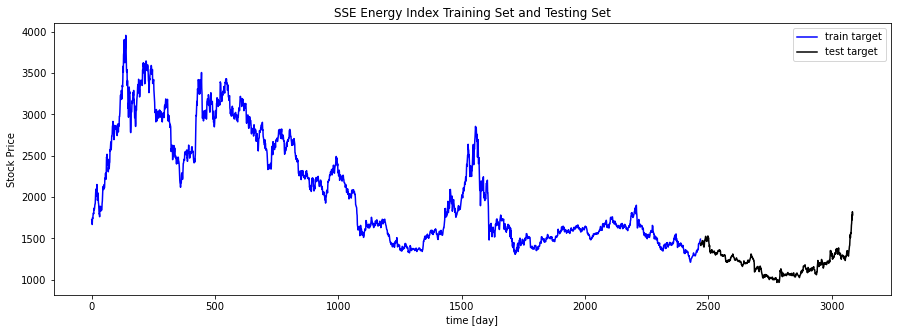

In [14]:
## show predictions
plt.figure(figsize=(15, 5))
plt.plot(np.arange(training_set.shape[0]), training_set, color='blue', label='train target')
plt.plot(np.arange(training_set.shape[0],training_set.shape[0]+testing_set.shape[0]),testing_set, color='black', label='test target')
plt.title('SSE Energy Index Training Set and Testing Set')
plt.xlabel('time [day]')
plt.ylabel('Stock Price')
plt.legend(loc='best');

In [15]:
# Scale training data
scaler = StandardScaler()
training_set_scaled = scaler.fit_transform(training_set) #2D (num_training_samples, 1)
testing_set_scaled = scaler.transform(testing_set) # 2D ndarray (num_testing_samples, 1)

In [16]:
#training data 处理
training_set_scaled1=training_set_scaled.flatten()#将数组降一维
training_set_scaled2=pd.DataFrame(columns=["closescale"],data=training_set_scaled1)#将array转为dataframe
training_set_scaled21=stk_data.loc[0:(len(training_set_scaled2)-1),'Date'].to_frame()#提取相应日期

In [17]:
training_set_scaled3= pd.concat([training_set_scaled21,training_set_scaled2],axis=1)

In [18]:
#testing data 处理
testing_set_scaled1=testing_set_scaled.flatten()#将数组降一维
testing_set_scaled2=pd.DataFrame(columns=["closescale"],data=testing_set_scaled1)#将array转为dataframe
testing_set_scaled21=stk_data.loc[len(training_set_scaled3):,'Date'].to_frame()#提取相应日期

In [19]:
testing_set_scaled21=pd.DataFrame(columns=["Date"],data=testing_set_scaled21.values)
testing_set_scaled3= pd.concat([testing_set_scaled21,testing_set_scaled2],axis=1)

In [20]:
training_set_scaled2.to_csv('trainingshuchuszny.csv',encoding='gbk')
testing_set_scaled2.to_csv('testingshuchuszny.csv',encoding='gbk')

# 利用相空间重构方法创建数据

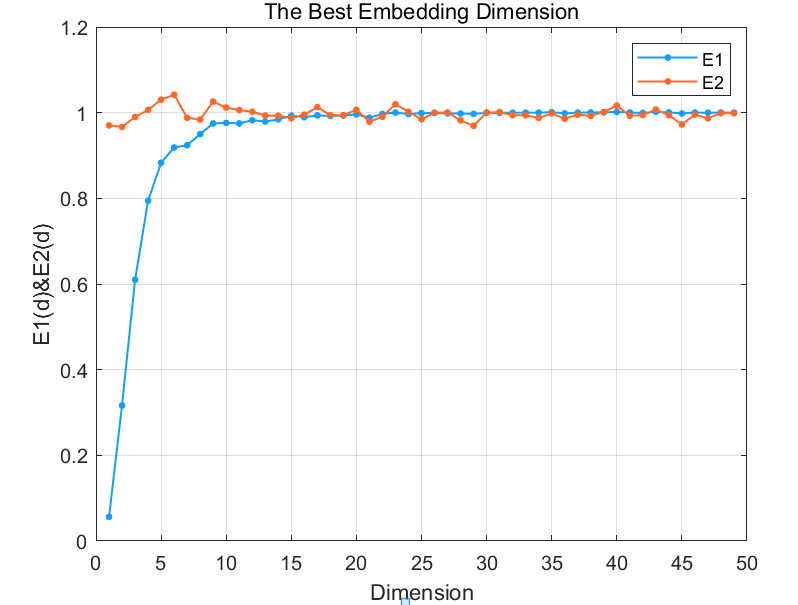!

相空间重构数据

In [21]:
# data为时间序列，tau为重构的时延，d为重构的维数，T为直接预测的步数
def PhaSpaRecon(df,tau,d,T):
    data = np.array(df)[:, 1]
    date = np.array(df)[:, 0]
    lens = len(data)
    if (lens - T - (d-1) * tau) < 1:
        print("error: delay time or the embedding dimension is too large")
    else:
        Xn1 = np.zeros((d, lens-(d-1)*tau-1))
        for i in range(0, d):
            Xn1[i, :] = data[i*tau:i*tau+lens-(d-1)*tau-1]
            # for j in range(i*tau, i*tau+lens-(d-1)*tau-1):
            #     Xn[i, j] = data[j]
        Yn1 = data[(T+(d-1)*tau):T+(d-1)*tau+lens-(d-1)*tau-1]
        Yn1_date = date[(T+(d-1)*tau):T+(d-1)*tau+lens-(d-1)*tau-1]
        Yn = Yn1.reshape((len(Yn1), 1))
        Yn_date = Yn1_date.reshape((len(Yn1_date), 1))
        Yn = pd.DataFrame(Yn)
        Yn_date = pd.DataFrame(Yn_date)
        Y = pd.concat([Yn_date, Yn],axis=1)
        Xn = Xn1.T #reshape((Xn1.shape[1], Xn1.shape[0]))
        Xn = pd.DataFrame(Xn)
        X = pd.concat([Xn, Yn],axis=1)
    return Xn, Yn, Y, X

In [22]:
Xn, Yn,Y,X = PhaSpaRecon(training_set_scaled3, tau=1, d=20, T=1)

In [23]:
Xn

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.555547,-0.572653,-0.646126,-0.520152,-0.536170,-0.481583,-0.443611,-0.429220,-0.446511,-0.345130,-0.373268,-0.360963,-0.312084,-0.268865,-0.265014,-0.148031,-0.049458,0.011158,-0.034531,-0.121719
1,-0.572653,-0.646126,-0.520152,-0.536170,-0.481583,-0.443611,-0.429220,-0.446511,-0.345130,-0.373268,-0.360963,-0.312084,-0.268865,-0.265014,-0.148031,-0.049458,0.011158,-0.034531,-0.121719,-0.029882
2,-0.646126,-0.520152,-0.536170,-0.481583,-0.443611,-0.429220,-0.446511,-0.345130,-0.373268,-0.360963,-0.312084,-0.268865,-0.265014,-0.148031,-0.049458,0.011158,-0.034531,-0.121719,-0.029882,0.095907
3,-0.520152,-0.536170,-0.481583,-0.443611,-0.429220,-0.446511,-0.345130,-0.373268,-0.360963,-0.312084,-0.268865,-0.265014,-0.148031,-0.049458,0.011158,-0.034531,-0.121719,-0.029882,0.095907,0.021698
4,-0.536170,-0.481583,-0.443611,-0.429220,-0.446511,-0.345130,-0.373268,-0.360963,-0.312084,-0.268865,-0.265014,-0.148031,-0.049458,0.011158,-0.034531,-0.121719,-0.029882,0.095907,0.021698,-0.197110
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2444,-1.221806,-1.218507,-1.215868,-1.227099,-1.213966,-1.194144,-1.180183,-1.156801,-1.133681,-1.137961,-1.160115,-1.114749,-1.123294,-1.106863,-1.116743,-1.104853,-1.012295,-1.001494,-1.002414,-1.004041
2445,-1.218507,-1.215868,-1.227099,-1.213966,-1.194144,-1.180183,-1.156801,-1.133681,-1.137961,-1.160115,-1.114749,-1.123294,-1.106863,-1.116743,-1.104853,-1.012295,-1.001494,-1.002414,-1.004041,-0.980168
2446,-1.215868,-1.227099,-1.213966,-1.194144,-1.180183,-1.156801,-1.133681,-1.137961,-1.160115,-1.114749,-1.123294,-1.106863,-1.116743,-1.104853,-1.012295,-1.001494,-1.002414,-1.004041,-0.980168,-0.967649
2447,-1.227099,-1.213966,-1.194144,-1.180183,-1.156801,-1.133681,-1.137961,-1.160115,-1.114749,-1.123294,-1.106863,-1.116743,-1.104853,-1.012295,-1.001494,-1.002414,-1.004041,-0.980168,-0.967649,-0.965593


In [24]:
train= X.values
x_train1=train[:,0:20]
y_train1=train[:,20]

In [25]:
X1n, Y1n, Y1,X1 = PhaSpaRecon(testing_set_scaled3, tau=1, d=20, T=1)

In [26]:
test= X1.values
x_test1=test[:,0:20]
y_test1=test[:,20]

In [27]:
print('x_train1 shape:', x_train1.shape, '\n', 'x_test1 shape:', x_test1.shape, '\n', 'y_train1 shape:', y_train1.shape, '\n', 'y_test1 shape:', y_test1.shape)

x_train1 shape: (2449, 20) 
 x_test1 shape: (597, 20) 
 y_train1 shape: (2449,) 
 y_test1 shape: (597,)


In [28]:
ts_  = np.arange(0, y_train1.shape[0])
ts_ext_ = np.arange(y_train1.shape[0], y_train1.shape[0] + y_test1.shape[0])
ts_full_ = np.arange(0, y_train1.shape[0] + y_test1.shape[0])

In [29]:
# Since each year has 252 trading days on average
ts_ = ts_/252; ts_ext_ = ts_ext_/252; ts_full_ = ts_full_/252 # ts_[-1] = 4.44444, ts_ext_[-1] : 5.5555

print('ts_ shape:', ts_.shape, '\n', 'ts_ext_ shape:', ts_ext_.shape, '\n', 'ts_full_ shape:', ts_full_.shape)

ts_ shape: (2449,) 
 ts_ext_ shape: (597,) 
 ts_full_ shape: (3046,)


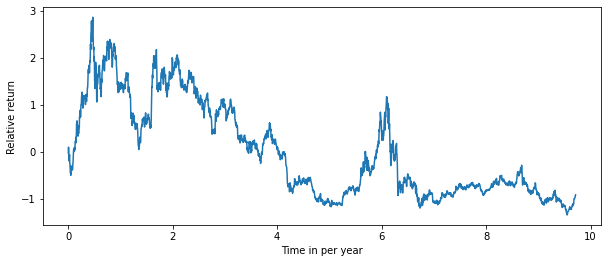

In [30]:
plt.figure(figsize = (10,4))
plt.plot(ts_, y_train1)
plt.xlabel('Time in per year')
plt.ylabel('Relative return')
plt.show()

In [31]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
xs_ = x_train1.astype(np.float64)
ys_ = y_train1.astype(np.float64)
xs_ext_ = x_test1.astype(np.float64)
ys_ext_ = y_test1.astype(np.float64)#object转float
xs = torch.tensor(xs_).float().to(device)
ys = torch.tensor(ys_).float().to(device)
# ys = ys.view(y_train.shape[0],1)
xs_ext = torch.tensor(xs_ext_).float().to(device)
ys_ext = torch.tensor(ys_ext_).float().to(device)

ts = torch.tensor(ts_).float().to(device)
ts = ts.view(ts_.shape[0],1)
ts_ext = torch.tensor(ts_ext_).float().to(device)
ts_ext = ts_ext.view(ts_ext_.shape[0],1)
ts_vis = ts_ext

In [32]:
Data = namedtuple('Data', ['ts_', 'ts_ext_', 'ts_vis_', 'ts', 'ts_ext', 'ts_vis', 'ys', 'ys_','ys_ext_'])

In [33]:
X21n, Y21n,Y21,X21 = PhaSpaRecon(training_set_scaled3, tau=1, d=20, T=2)
X22n, Y22n, Y22,X22 = PhaSpaRecon(testing_set_scaled3, tau=1, d=20, T=2)

In [34]:
train2= X21.values
train2=np.delete(train2,-1, axis=0)#减一是因为预测第二天T=2
x_train2=train2[:,0:20]
y_train2=train2[:,20]
test2= X22.values
test2=np.delete(test2,-1, axis=0)#减一是因为预测第二天T=2
x_test2=test2[:,0:20]
y_test2=test2[:,20]

In [35]:
X31n, Y31n,Y31,X31 = PhaSpaRecon(training_set_scaled3, tau=1, d=20, T=3)
X32n, Y32n, Y32,X32 = PhaSpaRecon(testing_set_scaled3, tau=1, d=20, T=3)

In [36]:
train3= X31.values
train3=np.delete(train3,[-1,-2], axis=0)#减一是因为预测第二天T=3
x_train3=train3[:,0:20]
y_train3=train3[:,20]
test3= X32.values
test3=np.delete(test3,[-1,-2], axis=0)#减一是因为预测第二天T=3
x_test3=test3[:,0:20]
y_test3=test3[:,20]

In [37]:
X41n, Y41n,Y41,X41 = PhaSpaRecon(training_set_scaled3, tau=1, d=20, T=4)
X42n, Y42n, Y42,X42 = PhaSpaRecon(testing_set_scaled3, tau=1, d=20, T=4)

In [38]:
train4= X41.values
train4=np.delete(train4,[-1,-2,-3], axis=0)#减一是因为预测第二天T=4
x_train4=train4[:,0:20]
y_train4=train4[:,20]
test4= X42.values
test4=np.delete(test4,[-1,-2,-3], axis=0)#减一是因为预测第二天T=4
x_test4=test4[:,0:20]
y_test4=test4[:,20]

# SDE Definition

In [39]:
sequence_length: int = 20
alpha, beta = 1.6, 0

In [40]:
__all__ = ['SDENet1']

class Drift1(nn.Module):
    def __init__(self):
        super(Drift1, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion1(nn.Module):
    def __init__(self):
        super(Diffusion1, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet1(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet1, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift1()
        self.diffusion = Diffusion1()
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out1=out
            Drift1=self.drift(t, out)
            return Drift1,Out1
            
        else:
            t = 0
            final_out1 = self.diffusion(t, out.detach())  
            return final_out1

def test():
    model = SDENet1(layer_depth=6)
    return model  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model1 = test()
    num_params = count_parameters(model1)
    print(num_params)

3041


In [41]:
__all__ = ['SDENet2']

class Drift2(nn.Module):
    def __init__(self):
        super(Drift2, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion2(nn.Module):
    def __init__(self):
        super(Diffusion2, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet2(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet2, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift2()
        self.diffusion = Diffusion2()
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
#        Out1=Out1.detach().numpy()#减一是因为预测后一天T=1和T=2差一天
#        Out1=np.delete(Out1,-1, axis=0)
#        Out1=torch.from_numpy(Out1)
#        out=torch.cat((out,Out1), 1)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out2=out
            Drift2=self.drift(t, out)
            return Drift2,Out2
            
        else:
            t = 0
            final_out2 = self.diffusion(t, out.detach())  
            return final_out2

def test():
    model2 = SDENet2(layer_depth=6)
    return model2  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model2 = test()
    num_params = count_parameters(model2)
    print(num_params)

3041


In [42]:
__all__ = ['SDENet3']

class Drift3(nn.Module):
    def __init__(self):
        super(Drift3, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion3(nn.Module):
    def __init__(self):
        super(Diffusion3, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet3(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet3, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift3()
        self.diffusion = Diffusion3()
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
#        Out2=Out2.detach().numpy()#减一是因为预测后一天T=2和T=3差一天
#        Out2=np.delete(Out2,-1, axis=0)
#        Out2=torch.from_numpy(Out2)
#        out=torch.cat((out,Out2), 1)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out3=out
            Drift3=self.drift(t, out)
            return Drift3,Out3
            
        else:
            t = 0
            final_out3 = self.diffusion(t, out.detach())  
            return final_out3

def test():
    model3 = SDENet3(layer_depth=6)
    return model3  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model3 = test()
    num_params = count_parameters(model3)
    print(num_params)

3041


In [43]:
__all__ = ['SDENet4']

class Drift4(nn.Module):
    def __init__(self):
        super(Drift4, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion4(nn.Module):
    def __init__(self):
        super(Diffusion4, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet4(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet4, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift4()
        self.diffusion = Diffusion4()
#        self.fc_layers = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(sequence_length, 8))#将激活层与线性层连接一起
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
#        Out3=Out3.detach().numpy()#减一是因为预测后一天T=2和T=3差一天
#        Out3=np.delete(Out3,-1, axis=0)
#        Out3=torch.from_numpy(Out3)
#        out=torch.cat((out,Out3), 1)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out4=out
            Drift4=self.drift(t, out)
#            final_out4 = self.fc_layers(out) 
#            mean41 = final_out[:,0]
#            mean42 = final_out[:,1]
#            mean43 = final_out[:,2]
#            mean44 = final_out[:,3]
#            sigma41 = F.softplus(final_out[:,5])+1e-3
#            sigma42 = F.softplus(final_out[:,6])+1e-3
#            sigma43 = F.softplus(final_out[:,7])+1e-3
#            sigma44 = F.softplus(final_out[:,8])+1e-3
            return Drift4,Out4
            
        else:
            t = 0
            final_out4 = self.diffusion(t, out.detach())  
            return final_out4

def test():
    model4 = SDENet4(layer_depth=6)
    return model4  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model4 = test()
    num_params = count_parameters(model4)
    print(num_params)

3041


# SDE_Regression

DataSet loading

In [44]:
X_train1 = torch.from_numpy(x_train1.astype(np.float64)).float()
X_test1 = torch.from_numpy(x_test1.astype(np.float64)).float()
Y_train1 = torch.from_numpy(y_train1.astype(np.float64)).float()
Y_test1 = torch.from_numpy(y_test1.astype(np.float64)).float()
print('X_train1.shape:', X_train1.shape, '\nX_test1.shape:', X_test1.shape, '\nY_train1.shape:', Y_train1.shape, '\nY_test1.shape:', Y_test1.shape)

X_train1.shape: torch.Size([2449, 20]) 
X_test1.shape: torch.Size([597, 20]) 
Y_train1.shape: torch.Size([2449]) 
Y_test1.shape: torch.Size([597])


In [45]:
X_train2 = torch.from_numpy(x_train2.astype(np.float64)).float()
X_test2 = torch.from_numpy(x_test2.astype(np.float64)).float()
Y_train2 = torch.from_numpy(y_train2.astype(np.float64)).float()
Y_test2 = torch.from_numpy(y_test2.astype(np.float64)).float()
print('X_train2.shape:', X_train2.shape, '\nX_test2.shape:', X_test2.shape, '\nY_train2.shape:', Y_train2.shape, '\nY_test2.shape:', Y_test2.shape)

X_train2.shape: torch.Size([2448, 20]) 
X_test2.shape: torch.Size([596, 20]) 
Y_train2.shape: torch.Size([2448]) 
Y_test2.shape: torch.Size([596])


In [46]:
X_train3 = torch.from_numpy(x_train3.astype(np.float64)).float()
X_test3 = torch.from_numpy(x_test3.astype(np.float64)).float()
Y_train3 = torch.from_numpy(y_train3.astype(np.float64)).float()
Y_test3 = torch.from_numpy(y_test3.astype(np.float64)).float()
print('X_train3.shape:', X_train3.shape, '\nX_test3.shape:', X_test3.shape, '\nY_train3.shape:', Y_train3.shape, '\nY_test3.shape:', Y_test3.shape)

X_train3.shape: torch.Size([2447, 20]) 
X_test3.shape: torch.Size([595, 20]) 
Y_train3.shape: torch.Size([2447]) 
Y_test3.shape: torch.Size([595])


In [47]:
X_train4 = torch.from_numpy(x_train4.astype(np.float64)).float()
X_test4 = torch.from_numpy(x_test4.astype(np.float64)).float()
Y_train4 = torch.from_numpy(y_train4.astype(np.float64)).float()
Y_test4 = torch.from_numpy(y_test4.astype(np.float64)).float()
print('X_train4.shape:', X_train4.shape, '\nX_test4.shape:', X_test4.shape, '\nY_train4.shape:', Y_train4.shape, '\nY_test4.shape:', Y_test4.shape)

X_train4.shape: torch.Size([2446, 20]) 
X_test4.shape: torch.Size([594, 20]) 
Y_train4.shape: torch.Size([2446]) 
Y_test4.shape: torch.Size([594])


Arguments

In [48]:
from __future__ import print_function

parser = argparse.ArgumentParser(description='PyTorch SDENet Training')
parser.add_argument('--epochs', type=int, default=100, help='number of epochs to train')
parser.add_argument('--lr', default=1e-4, type=float, help='learning rate')
parser.add_argument('--lr2', default=0.01, type=float, help='learning rate')
parser.add_argument('--gpu', type=int, default=0)
parser.add_argument('--seed', type=float, default=0)
parser.add_argument('--droprate', type=float, default=0.1, help='learning rate decay')
parser.add_argument('--decreasing_lr', default=[20], nargs='+', help='decreasing strategy')
parser.add_argument('--decreasing_lr2', default=[], nargs='+', help='decreasing strategy')

args = parser.parse_args([])
print(args)
device = torch.device('cuda:' + str(args.gpu) if torch.cuda.is_available() else 'cpu')

batch_size1 = y_train1.squeeze().shape[0]
batch_size2 = y_train2.squeeze().shape[0]
batch_size3 = y_train3.squeeze().shape[0]
batch_size4 = y_train4.squeeze().shape[0]
Iter = 50
Iter_test = 1

Namespace(decreasing_lr=[20], decreasing_lr2=[], droprate=0.1, epochs=100, gpu=0, lr=0.0001, lr2=0.01, seed=0)


# Model

In [49]:
from sklearn.metrics import mean_squared_error
net1 = SDENet1(25)
net1 = net1.to(device)
net2 = SDENet2(25)
net2 = net2.to(device)
net3 = SDENet3(25)
net3 = net3.to(device)
net4 = SDENet4(25)
net4 = net4.to(device)
attention = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(4*sequence_length, 8))
criterion = nn.BCELoss()

real_label = 0
fake_label = 1
optimizer_F = optim.SGD([ {'params': net1.downsampling_layers.parameters()}, {'params': net1.drift.parameters()},{'params': net2.downsampling_layers.parameters()},{'params': net2.drift.parameters()},{'params': net3.downsampling_layers.parameters()},{'params': net3.drift.parameters()} ,{'params': net4.downsampling_layers.parameters()},{'params': net4.drift.parameters()},{'params': attention.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F1 = optim.SGD([ {'params': net1.downsampling_layers.parameters()}, {'params': net1.drift.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F2 = optim.SGD([ {'params': net2.downsampling_layers.parameters()}, {'params': net2.drift.parameters}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F3 = optim.SGD([ {'params': net3.downsampling_layers.parameters()}, {'params': net3.drift.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F4 = optim.SGD([ {'params': net4.downsampling_layers.parameters()}, {'params': net4.drift.parameters()},{'params': net4.fc_layers.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
optimizer_G = optim.SGD([ {'params': net1.diffusion.parameters()},{'params': net2.diffusion.parameters()},{'params': net3.diffusion.parameters()},{'params': net4.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G1 = optim.SGD([ {'params': net1.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G2 = optim.SGD([ {'params': net2.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G3 = optim.SGD([{'params': net3.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G4 = optim.SGD([{'params': net4.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
def nll_loss(y, mean, sigma):
    loss = torch.mean(torch.log(sigma**2)+(y-mean)**2/(sigma**2))
    return loss
def mse(y, mean):
    loss = torch.mean((y-mean)**2)
    return loss

# Training
def train(epoch):
    print('\nEpoch: %d' % epoch)
    net1.train()
    net2.train()
    net3.train()
    net4.train()
#    if epoch == 0:
#        net.sigma = 0.1
#    if epoch == 30:
#        net.sigma = 0.5
    train_loss = 0
    train_loss_in = 0
    train_loss_out = 0
    total = 0
    for iternum in range(Iter):
        inputs1, targets1 = X_train1, Y_train1[0:-3]
        inputs2, targets2 = X_train2, Y_train2[0:-2]
        inputs3, targets3 = X_train3, Y_train3[0:-1]
        inputs4, targets4 = X_train4, Y_train4
        # print(inputs.shape)
        inputs1, targets1 = inputs1.to(device), targets1.to(device)
        #optimizer_F1.zero_grad()
        inputs2, targets2 = inputs2.to(device), targets2.to(device)
        #optimizer_F2.zero_grad()
        inputs3, targets3 = inputs3.to(device), targets3.to(device)
        #optimizer_F3.zero_grad()
        inputs4, targets4 = inputs4.to(device), targets4.to(device)
        #optimizer_F4.zero_grad()
        optimizer_F.zero_grad()
        Drift1,Out1 = net1(inputs1)
        Drift2,Out2 = net2(inputs2)
        Drift3,Out3 = net3(inputs3)
        Drift4,Out4 = net4(inputs4)
        #print(Drift)
        #print(Out4.shape)
        Out=torch.cat([Out1[0:-3,:],Out2[0:-2,:],Out3[0:-1,:],Out4],1)
        #attention = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(4*sequence_length, 8))
        final_out=attention(Out)
        mean41 = final_out[:,0]
        mean42 = final_out[:,1]
        mean43 = final_out[:,2]
        mean44 = final_out[:,3]
        sigma41 = F.softplus(final_out[:,4])+1e-3
        sigma42 = F.softplus(final_out[:,5])+1e-3
        sigma43 = F.softplus(final_out[:,6])+1e-3
        sigma44 = F.softplus(final_out[:,7])+1e-3       
        loss1 = nll_loss(targets1, mean41, sigma41)
        loss2 = nll_loss(targets2, mean42, sigma42)
        loss3 = nll_loss(targets3, mean43, sigma43)
        loss4 = nll_loss(targets4, mean44, sigma44)
        loss=loss1+loss2+loss3+loss4
        loss.backward()
        optimizer_F.step()
        train_loss += loss.item()
        #loss1.backward()
        #nn.utils.clip_grad_norm_(net1.parameters(), 100.)
        #optimizer_F1.step()
        #loss2 = nll_loss(targets2, mean42, sigma42)
        #loss2.backward()
        #nn.utils.clip_grad_norm_(net2.parameters(), 100.)
        #optimizer_F2.step()
        #loss3 = nll_loss(targets3, mean43, sigma43)
        #loss3.backward()
        #nn.utils.clip_grad_norm_(net3.parameters(), 100.)
        #optimizer_F3.step()
        #loss4 = nll_loss(targets4, mean44, sigma44)
        # loss = criterion(targets, mean)
        #loss4.backward()
        #nn.utils.clip_grad_norm_(net4.parameters(), 100.)
        #optimizer_F4.step()
        

        label1 = torch.full((batch_size1,1), real_label, device=device)
        label2 = torch.full((batch_size2,1), real_label, device=device)
        label3 = torch.full((batch_size3,1), real_label, device=device)
        label4 = torch.full((batch_size4,1), real_label, device=device)
        optimizer_G.zero_grad()
        predict_in1 = net1(inputs1, training_diffusion=True)
        predict_in2 = net2(inputs2, training_diffusion=True)
        predict_in3 = net3(inputs3, training_diffusion=True)
        predict_in4 = net4(inputs4, training_diffusion=True)
        loss_in = criterion(predict_in1, label1.float())+criterion(predict_in2, label2.float())+criterion(predict_in3, label3.float())+criterion(predict_in4, label4.float())
        loss_in.backward()
        label1.fill_(fake_label)
        label2.fill_(fake_label)
        label3.fill_(fake_label)
        label4.fill_(fake_label)

        inputs_out1 = 2 * torch.randn(batch_size1, sequence_length, device = device) + inputs1
        inputs_out2 = 2 * torch.randn(batch_size2, sequence_length, device = device) + inputs2
        inputs_out3 = 2 * torch.randn(batch_size3, sequence_length, device = device) + inputs3
        inputs_out4 = 2 * torch.randn(batch_size4, sequence_length, device = device) + inputs4
        predict_out1 = net1(inputs_out1, training_diffusion=True)
        predict_out2 = net2(inputs_out2, training_diffusion=True)
        predict_out3 = net3(inputs_out3, training_diffusion=True)
        predict_out4 = net4(inputs_out4, training_diffusion=True)
        loss_out = criterion(predict_out1, label1.float())+criterion(predict_out2, label2.float())+criterion(predict_out3, label3.float())+criterion(predict_out4, label4.float())
        
        loss_out.backward()
        train_loss_out += loss_out.item()
        train_loss_in += loss_in.item()
        optimizer_G.step()
#    plt.figure(figsize = (5, 4))
#    plt.subplot(221)
    plt.figure(1,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean41.cpu().detach().numpy()),label = 'prediction(t+1)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean41.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma41.cpu().detach().numpy())), scaler.inverse_transform(mean41.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma41.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets1.cpu().detach().numpy()),label = 'truth(t+1)')
    plt.ylim(700,4200)
    plt.legend()
#    plt.subplot(222)
    plt.figure(2,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean42.cpu().detach().numpy()),label = 'prediction(t+2)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean42.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma42.cpu().detach().numpy())), scaler.inverse_transform(mean42.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma42.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)    
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets2.cpu().detach().numpy()),label = 'truth(t+2)')
    plt.ylim(700,4200)
    plt.legend()
#    plt.subplot(223)
    plt.figure(3,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean43.cpu().detach().numpy()),label = 'prediction(t+3)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean43.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma43.cpu().detach().numpy())), scaler.inverse_transform(mean43.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma43.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets3.cpu().detach().numpy()),label = 'truth(t+3)')
    plt.ylim(700,4200)
    plt.legend()
#    plt.subplot(224)
    plt.figure(4,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean44.cpu().detach().numpy()),label = 'prediction(t+4)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean44.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma44.cpu().detach().numpy())), scaler.inverse_transform(mean44.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma44.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets4.cpu().detach().numpy()),label = 'truth(t+4)')
    plt.ylim(700,4200)
    img_path = os.path.join('/content/output/', f'train_{epoch}.png')
    plt.savefig(img_path, dpi = 300)
    plt.legend()
    plt.show()
    loss11=mean_squared_error(Y_train1.numpy()[0:-3], mean41.cpu().detach().numpy())
    loss22=mean_squared_error(Y_train2.numpy()[0:-2], mean42.cpu().detach().numpy())
    loss33=mean_squared_error(Y_train3.numpy()[0:-1], mean43.cpu().detach().numpy())
    loss44=mean_squared_error(Y_train4.numpy(), mean44.cpu().detach().numpy())
    print('Train epoch:{} \tLoss: {:.6f}| Loss_in: {:.6f}| Loss_out: {:.6f}'.format(epoch, train_loss/Iter, train_loss_in/Iter, train_loss_out/Iter))
    #return mean_squared_error(Y_train1.numpy()[0:-3], mean41.cpu().detach().numpy()),mean_squared_error(Y_train2.numpy()[0:-2], mean42.cpu().detach().numpy()),mean_squared_error(Y_train3.numpy()[0:-1], mean43.cpu().detach().numpy()),mean_squared_error(Y_train4.numpy(), mean44.cpu().detach().numpy())
    #return mean_squared_error(Y_train4.numpy(), mean44.cpu().detach().numpy())
    return loss11,loss22,loss33,loss44

In [50]:
# Testing
def test(epoch):
    net1.eval()
    net2.eval()
    net3.eval()
    net4.eval()
    test_loss = 0
    total = 0
    with torch.no_grad():
        for iternum in range(Iter_test):
            inputs1, targets1 = X_test1, Y_test1[0:-3]
            inputs2, targets2 = X_test2, Y_test2[0:-2]
            inputs3, targets3 = X_test3, Y_test3[0:-1]
            inputs4, targets4 = X_test4, Y_test4
            inputs1, targets1 = inputs1.to(device), targets1.to(device)
            inputs2, targets2 = inputs2.to(device), targets2.to(device)
            inputs3, targets3 = inputs3.to(device), targets3.to(device)
            inputs4, targets4 = inputs4.to(device), targets4.to(device)
            current_mean1 = 0
            current_mean2 = 0
            current_mean3 = 0
            current_mean4 = 0
            current_sigma1 = 0
            current_sigma2 = 0
            current_sigma3 = 0
            current_sigma4 = 0
            for i in range(1):
                #mean, sigma ,Drift= net(inputs)
                Drift1,Out1 = net1(inputs1)
                Drift2,Out2 = net2(inputs2)
                Drift3,Out3 = net3(inputs3)
                Drift4,Out4 = net4(inputs4)
                Out=torch.cat([Out1[0:-3,:],Out2[0:-2,:],Out3[0:-1,:],Out4],1)
                final_out=attention(Out)
                mean41 = final_out[:,0]
                mean42 = final_out[:,1]
                mean43 = final_out[:,2]
                mean44 = final_out[:,3]
                sigma41 = F.softplus(final_out[:,4])+1e-3
                sigma42 = F.softplus(final_out[:,5])+1e-3
                sigma43 = F.softplus(final_out[:,6])+1e-3
                sigma44 = F.softplus(final_out[:,7])+1e-3 
                current_mean1 = current_mean1 + mean41
                current_mean2 = current_mean2 + mean42
                current_mean3 = current_mean3 + mean43
                current_mean4 = current_mean4 + mean44
                current_sigma1= current_sigma1+ sigma41
                current_sigma2= current_sigma2+ sigma42
                current_sigma3= current_sigma3+ sigma43
                current_sigma4= current_sigma4+ sigma44
            current_mean1 = current_mean1/1
            current_mean2 = current_mean2/1
            current_mean3 = current_mean3/1
            current_mean4 = current_mean4/1
            current_sigma1 = current_sigma1/1
            current_sigma2 = current_sigma2/1
            current_sigma3 = current_sigma3/1
            current_sigma4 = current_sigma4/1            
            loss1 = mse(targets1, current_mean1)
            loss2 = mse(targets2, current_mean2)
            loss3 = mse(targets3, current_mean3)
            loss4 = mse(targets4, current_mean4)
            loss=loss1+loss2+loss3+loss4
#            plt.figure(figsize = (8, 4))
#            plt.subplot(221)
            plt.figure(1,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean1.cpu().detach().numpy()),label = 'prediction(t+1)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean1.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma1.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean1.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma1.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets1.cpu().detach().numpy()),label = 'truth(t+1)')
            plt.ylim(800,2200)
            plt.legend()
#            plt.subplot(222)
            plt.figure(2,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean2.cpu().detach().numpy()),label = 'prediction(t+2)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean2.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma2.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean2.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma2.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets2.cpu().detach().numpy()),label = 'truth(t+2)')
            plt.ylim(800,2200)
            plt.legend()
#            plt.subplot(223)
            plt.figure(3,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean3.cpu().detach().numpy()),label = 'prediction(t+3)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean3.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma3.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean3.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma3.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets3.cpu().detach().numpy()),label = 'truth(t+3)')
            plt.ylim(800,2200)
            plt.legend()
#            plt.subplot(224)
            plt.figure(4,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean4.cpu().detach().numpy()),label = 'prediction(t+4)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean4.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma4.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean4.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma4.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets4.cpu().detach().numpy()),label = 'truth(t+4)')
            plt.ylim(800,2200)
            img_path = os.path.join('/content/output/', f'test_{epoch}.png')
            plt.savefig(img_path, dpi = 300)
            plt.legend()
            plt.show()
            test_loss += loss.item()
    
            loss11 = mean_squared_error(Y_test1.numpy()[0:-3], current_mean1.cpu().detach().numpy()) 
            loss22 = mean_squared_error(Y_test2.numpy()[0:-2], current_mean2.cpu().detach().numpy())
            loss33 = mean_squared_error(Y_test3.numpy()[0:-1], current_mean3.cpu().detach().numpy())
            loss44 = mean_squared_error(Y_test4.numpy(), current_mean4.cpu().detach().numpy())
    print('Test epoch:{} \tLoss: {:.6f}'.format(epoch, np.sqrt(test_loss/Iter_test)))
    return loss11,loss22,loss33,loss44
    #return loss11, current_mean1.cpu().detach().numpy()), mean_squared_error(Y_test2.numpy()[0:-2], current_mean2.cpu().detach().numpy()),mean_squared_error(Y_test3.numpy()[0:-1], current_mean3.cpu().detach().numpy()),mean_squared_error(Y_test4.numpy(), current_mean4.cpu().detach().numpy())
    #return mean_squared_error(Y_test3.numpy()[0:-1], current_mean3.cpu().detach().numpy())

# Run Epochs


Epoch: 1


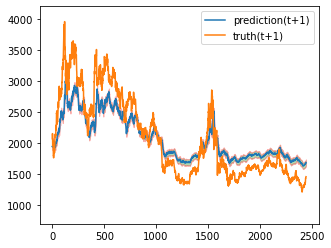

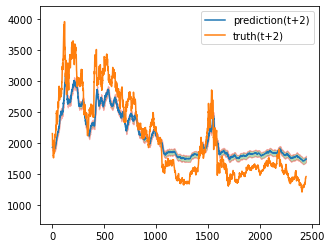

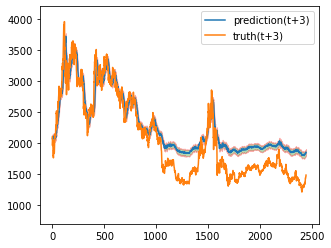

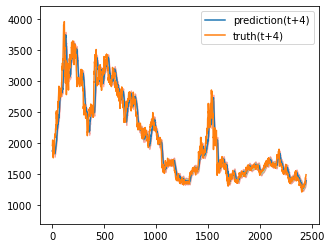

Train epoch:1 	Loss: 1.885021| Loss_in: 2.315484| Loss_out: 1.323530


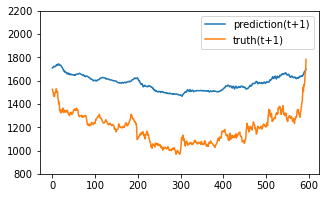

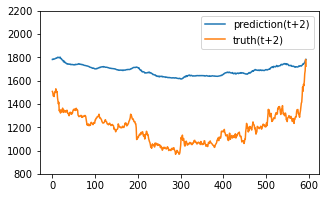

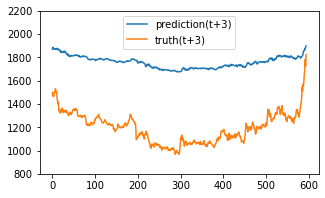

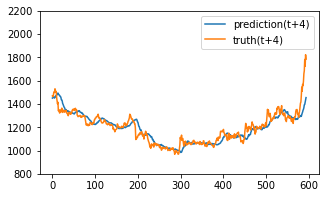

Test epoch:1 	Loss: 1.314348

Epoch: 2


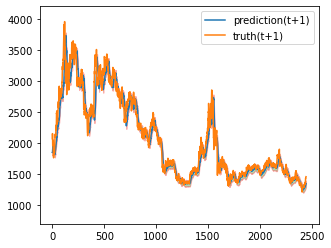

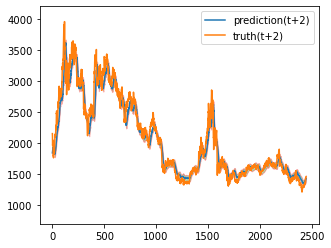

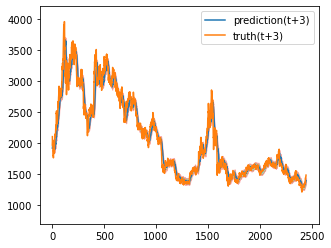

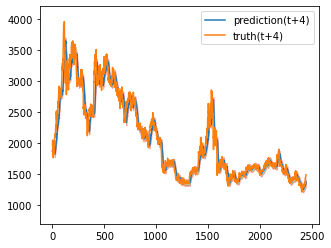

Train epoch:2 	Loss: -2.591429| Loss_in: 0.766485| Loss_out: 0.459311


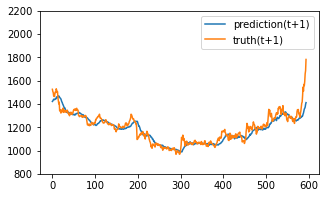

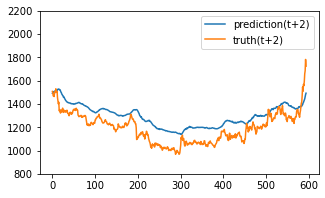

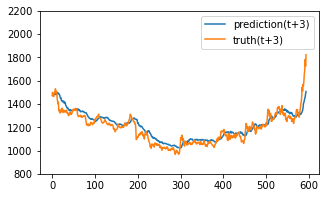

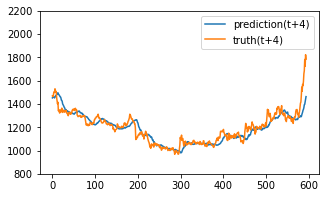

Test epoch:2 	Loss: 0.233570

Epoch: 3


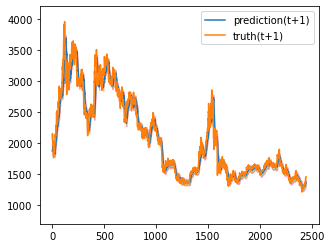

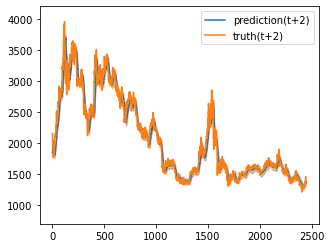

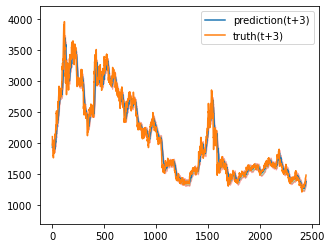

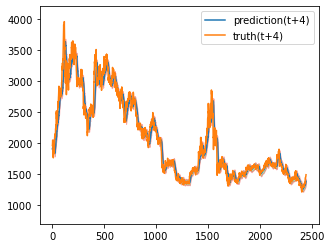

Train epoch:3 	Loss: -6.344243| Loss_in: 0.379547| Loss_out: 0.241639


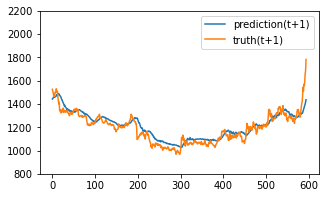

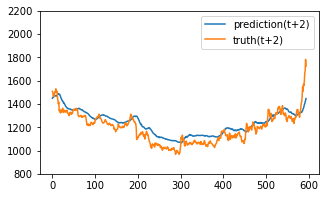

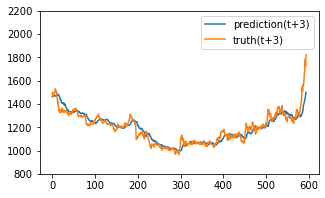

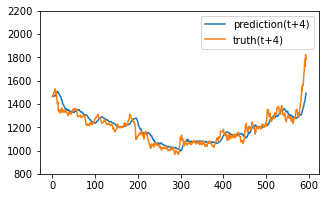

Test epoch:3 	Loss: 0.179491

Epoch: 4


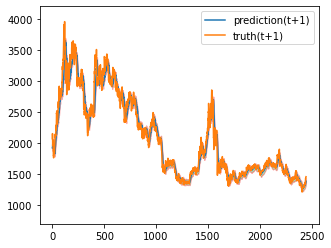

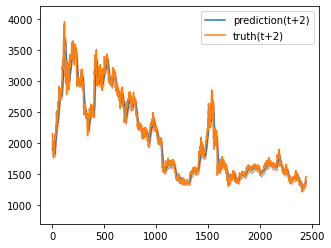

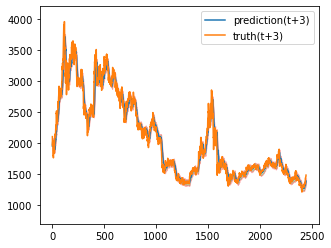

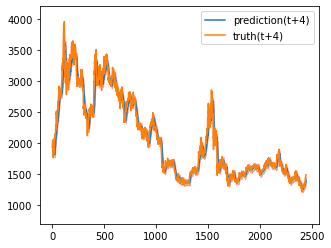

Train epoch:4 	Loss: -9.645186| Loss_in: 0.248443| Loss_out: 0.164463


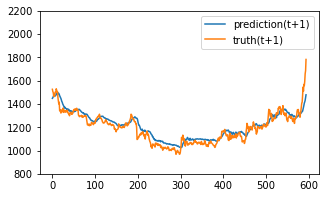

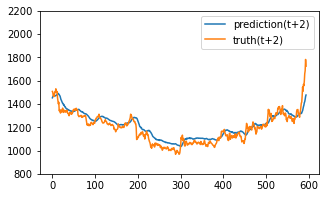

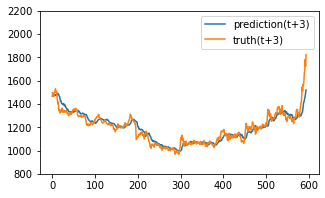

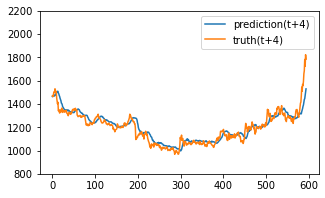

Test epoch:4 	Loss: 0.159557

Epoch: 5


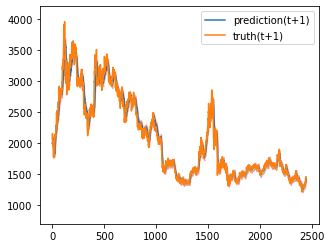

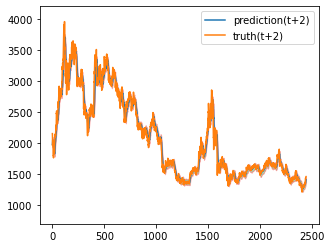

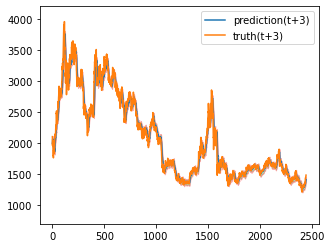

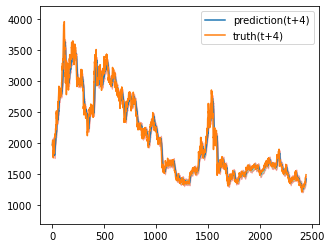

Train epoch:5 	Loss: -11.050012| Loss_in: 0.185200| Loss_out: 0.123249


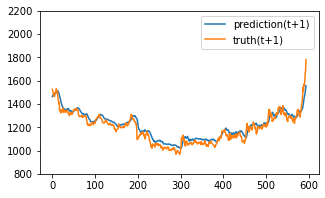

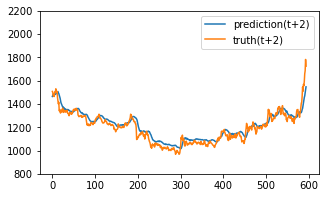

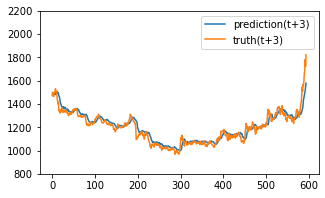

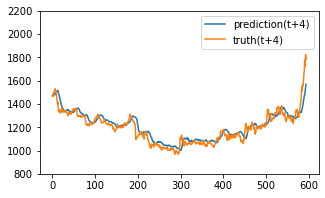

Test epoch:5 	Loss: 0.142673

Epoch: 6


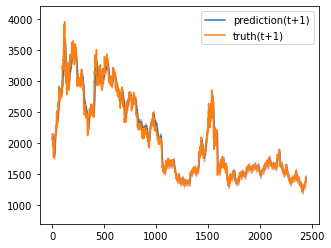

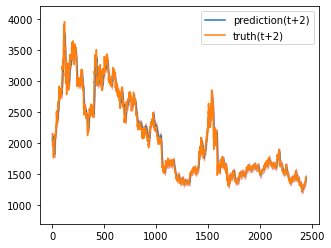

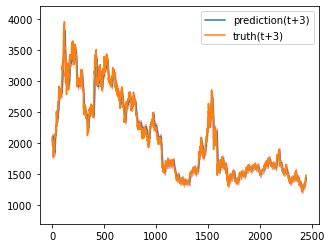

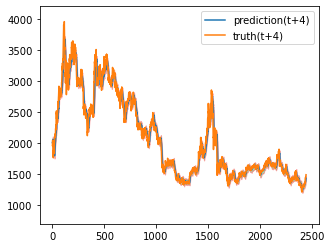

Train epoch:6 	Loss: -11.967170| Loss_in: 0.146512| Loss_out: 0.099339


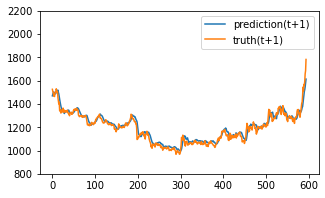

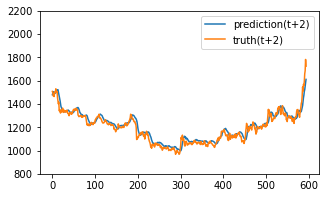

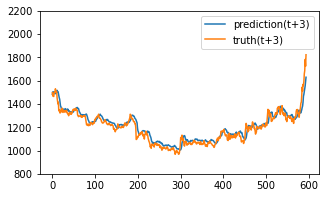

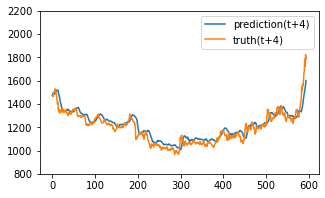

Test epoch:6 	Loss: 0.129263

Epoch: 7


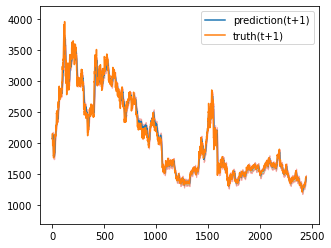

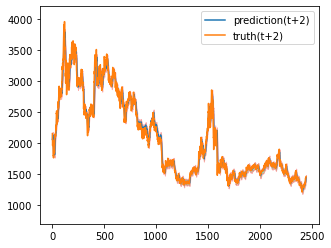

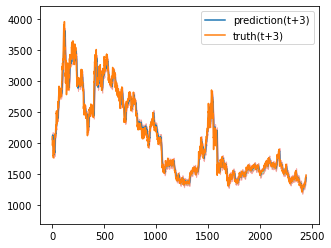

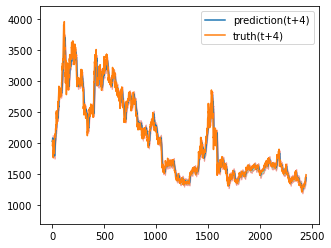

Train epoch:7 	Loss: -12.423214| Loss_in: 0.120983| Loss_out: 0.083859


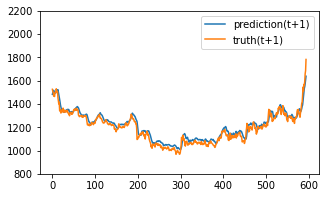

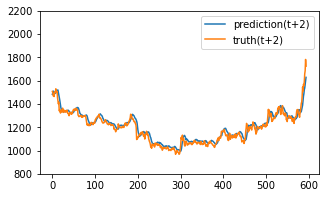

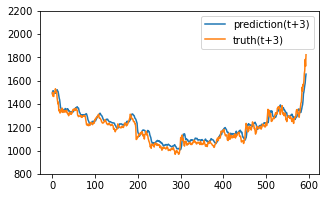

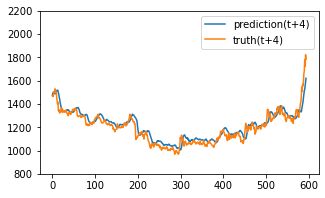

Test epoch:7 	Loss: 0.127546

Epoch: 8


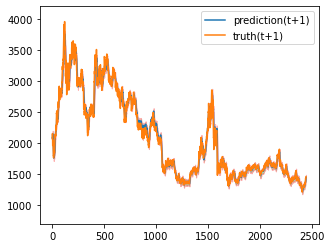

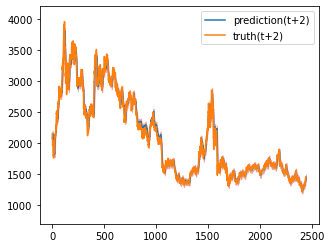

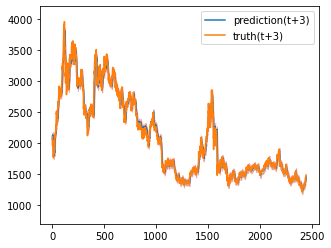

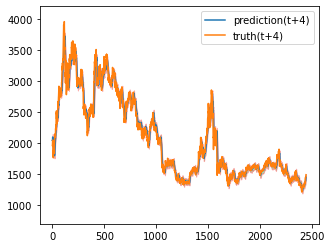

Train epoch:8 	Loss: -13.048356| Loss_in: 0.101931| Loss_out: 0.072114


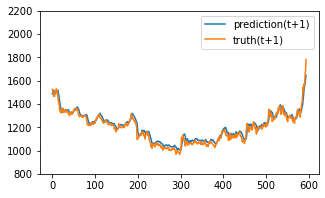

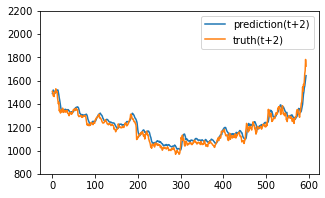

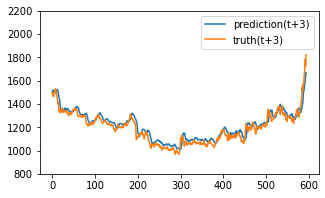

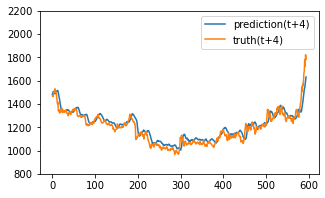

Test epoch:8 	Loss: 0.125692

Epoch: 9


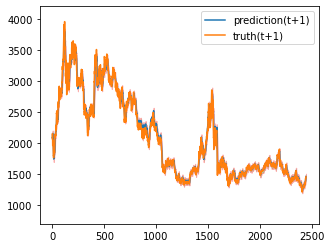

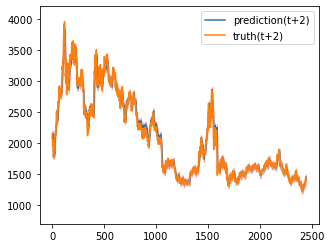

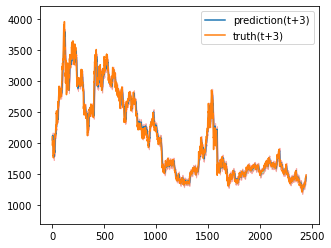

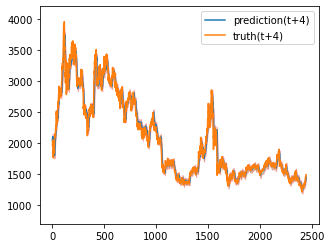

Train epoch:9 	Loss: -13.431393| Loss_in: 0.088013| Loss_out: 0.063415


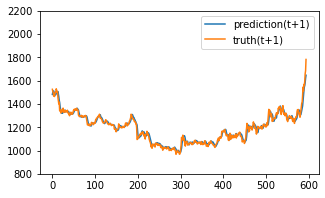

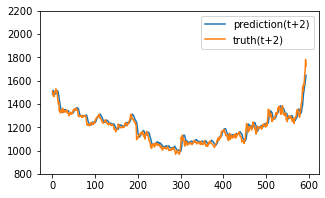

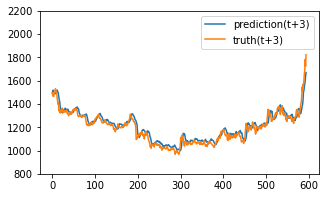

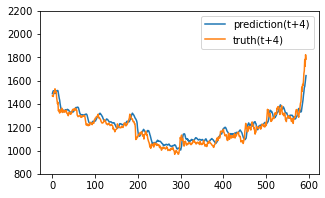

Test epoch:9 	Loss: 0.115837

Epoch: 10


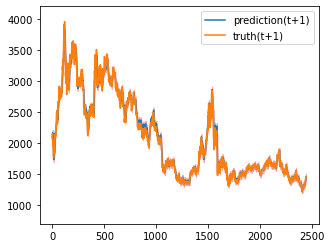

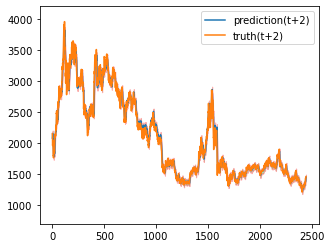

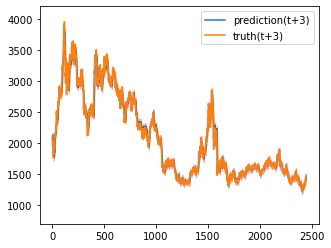

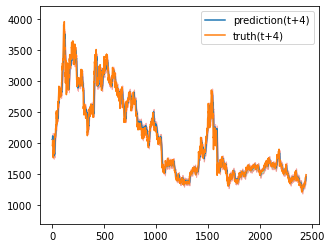

Train epoch:10 	Loss: -13.768490| Loss_in: 0.077279| Loss_out: 0.057150


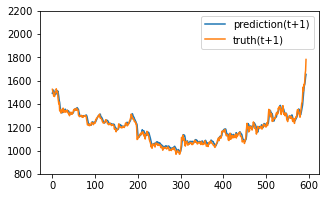

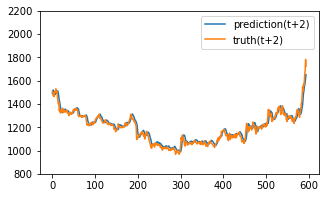

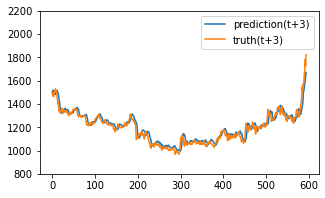

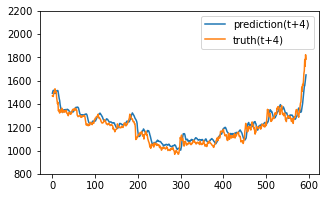

Test epoch:10 	Loss: 0.113276

Epoch: 11


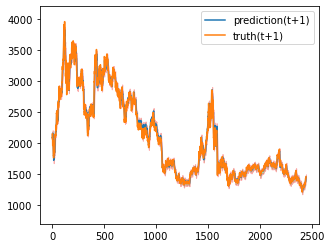

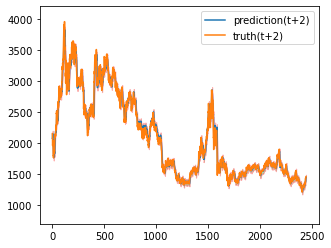

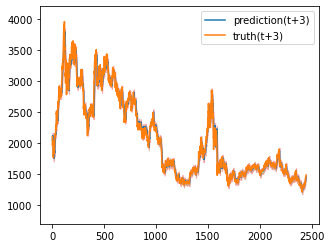

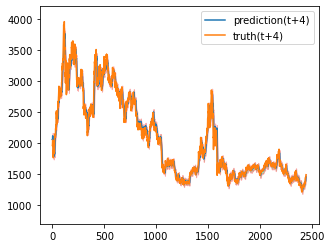

Train epoch:11 	Loss: -14.045096| Loss_in: 0.068965| Loss_out: 0.051627


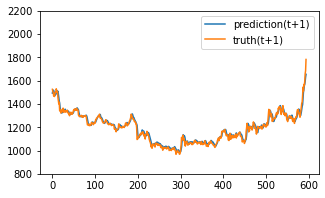

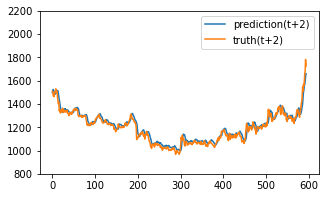

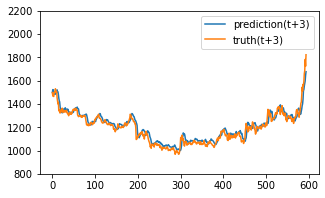

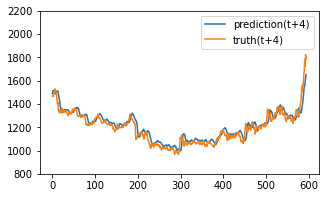

Test epoch:11 	Loss: 0.111500

Epoch: 12


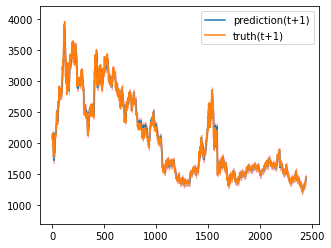

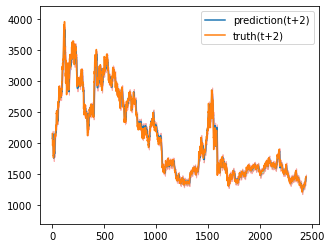

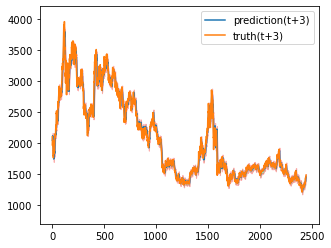

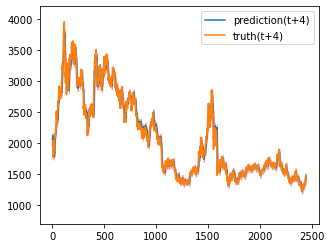

Train epoch:12 	Loss: -14.326235| Loss_in: 0.062220| Loss_out: 0.047232


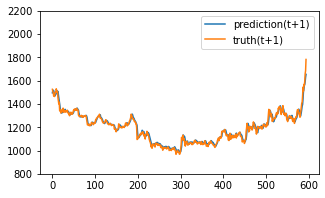

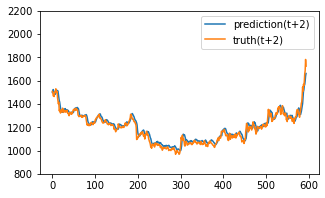

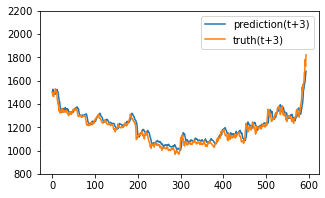

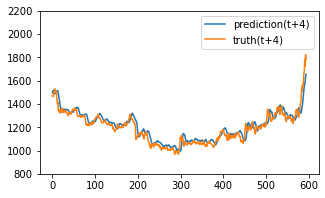

Test epoch:12 	Loss: 0.111062

Epoch: 13


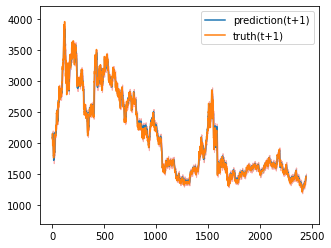

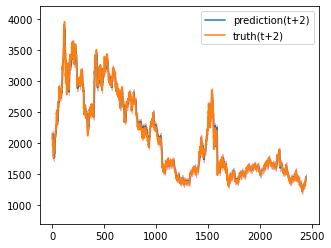

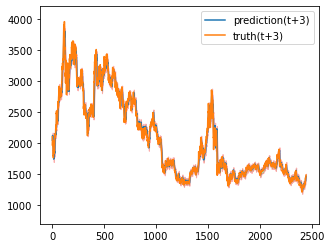

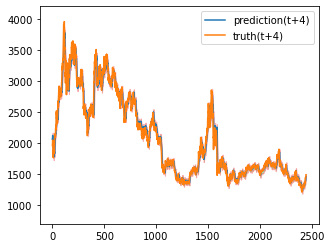

Train epoch:13 	Loss: -14.542023| Loss_in: 0.056844| Loss_out: 0.044467


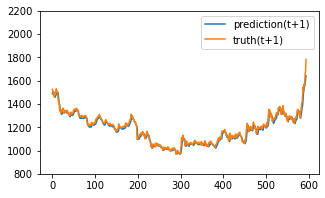

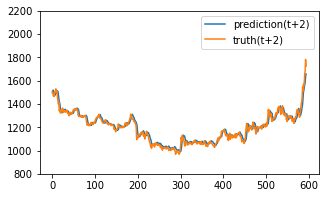

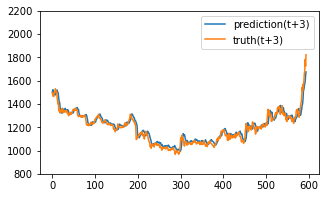

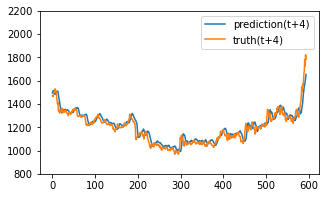

Test epoch:13 	Loss: 0.107416

Epoch: 14


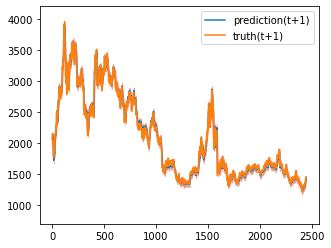

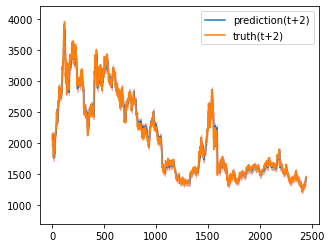

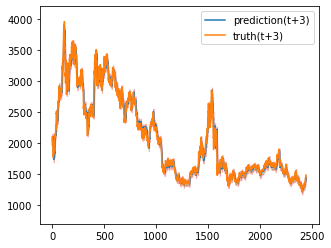

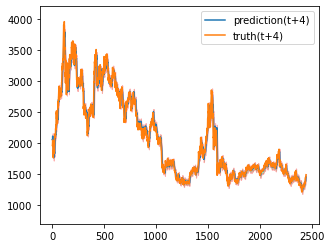

Train epoch:14 	Loss: -12.028962| Loss_in: 0.058767| Loss_out: 0.041388


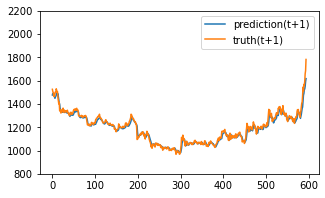

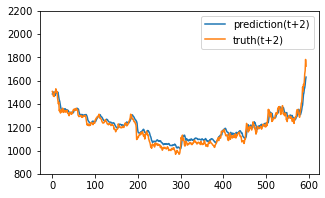

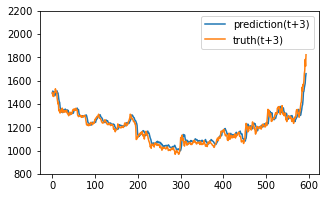

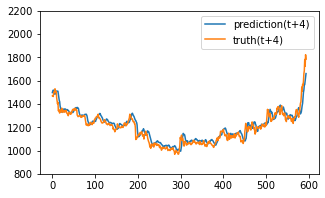

Test epoch:14 	Loss: 0.113232

Epoch: 15


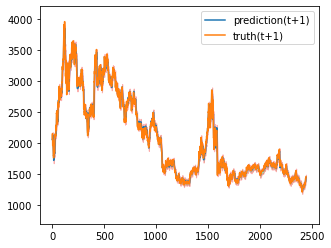

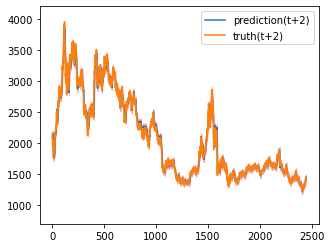

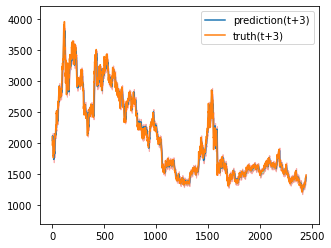

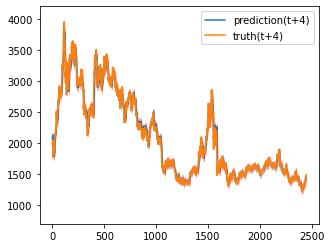

Train epoch:15 	Loss: -14.307255| Loss_in: 0.046915| Loss_out: 0.040717


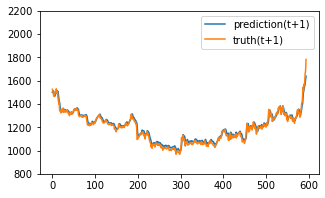

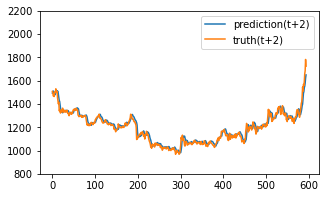

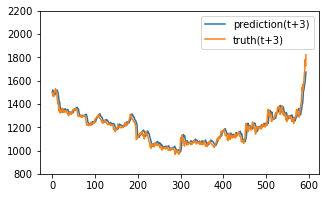

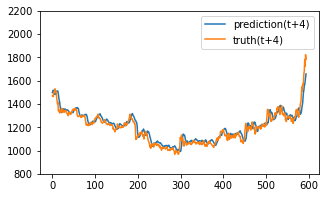

Test epoch:15 	Loss: 0.107744

Epoch: 16


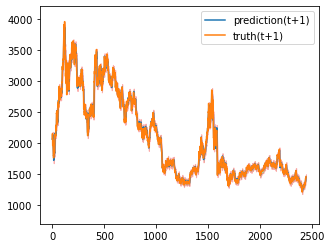

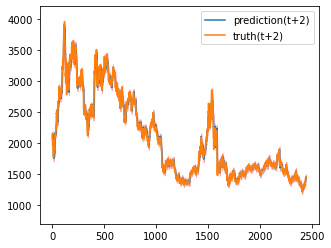

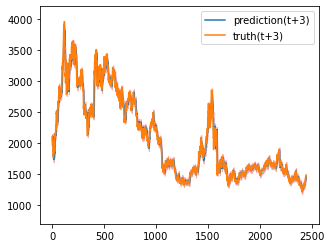

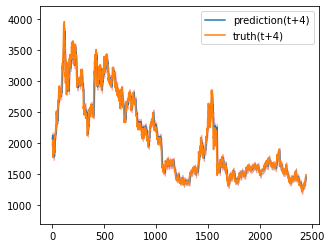

Train epoch:16 	Loss: -15.144870| Loss_in: 0.044550| Loss_out: 0.036891


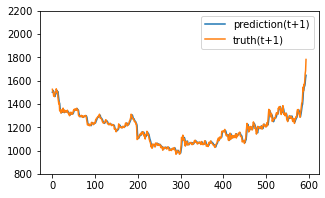

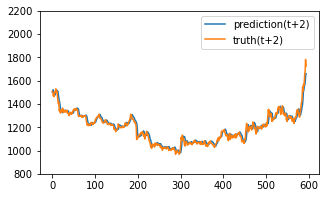

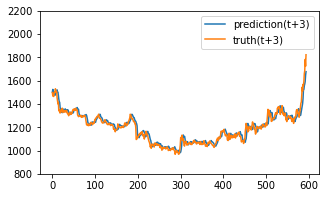

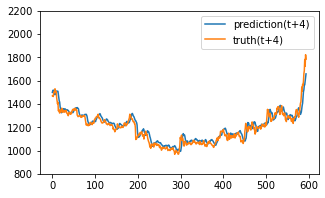

Test epoch:16 	Loss: 0.104266

Epoch: 17


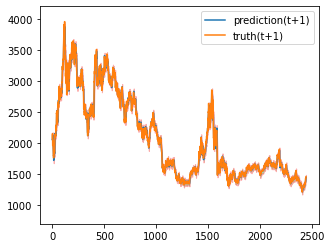

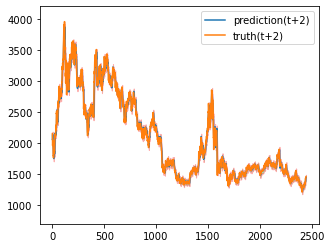

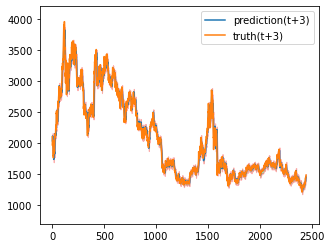

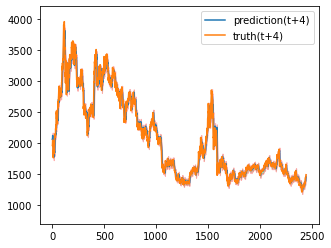

Train epoch:17 	Loss: -15.349968| Loss_in: 0.041525| Loss_out: 0.034346


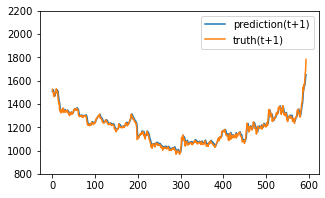

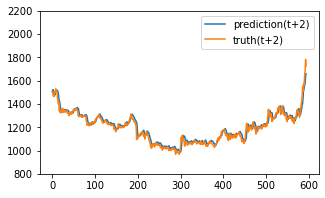

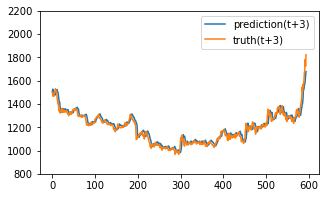

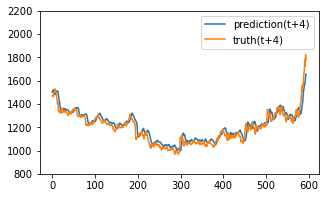

Test epoch:17 	Loss: 0.106595

Epoch: 18


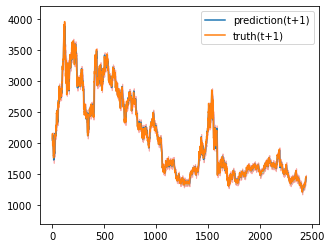

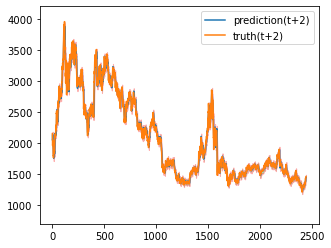

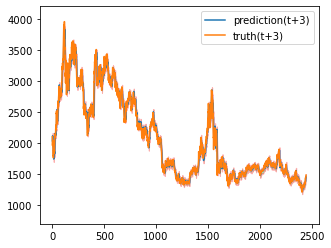

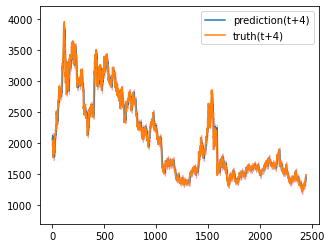

Train epoch:18 	Loss: -15.491565| Loss_in: 0.039128| Loss_out: 0.032010


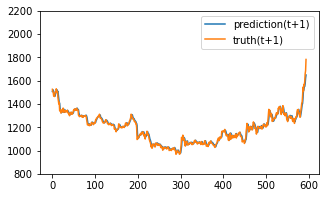

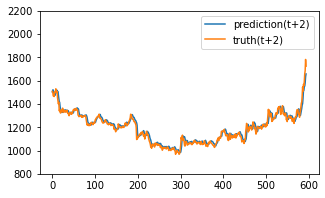

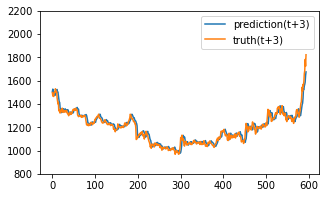

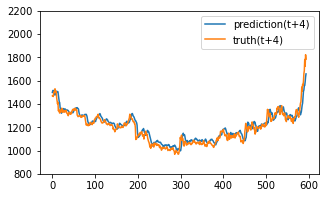

Test epoch:18 	Loss: 0.103945

Epoch: 19


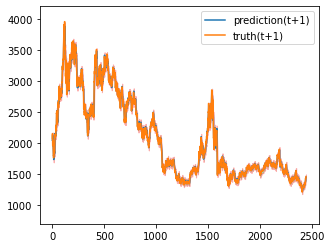

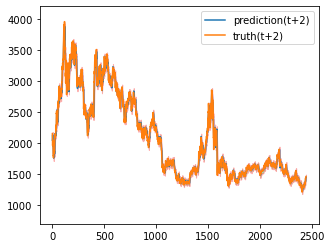

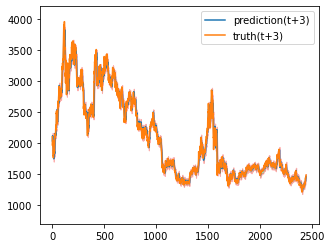

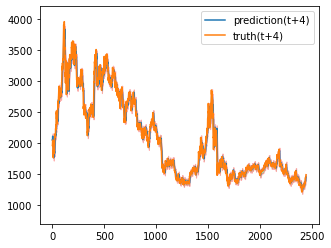

Train epoch:19 	Loss: -15.564156| Loss_in: 0.036963| Loss_out: 0.030792


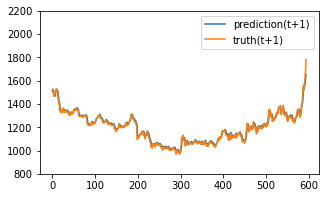

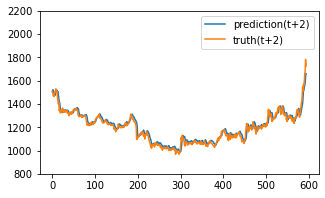

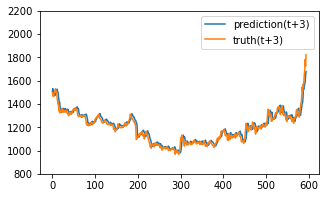

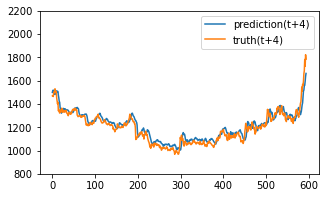

Test epoch:19 	Loss: 0.106594

Epoch: 20


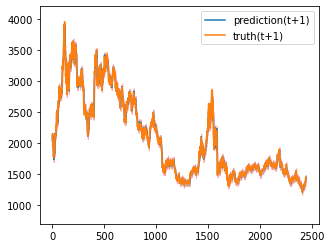

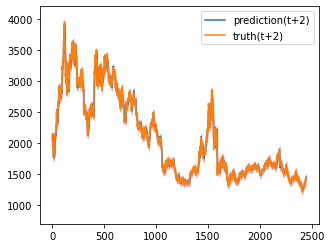

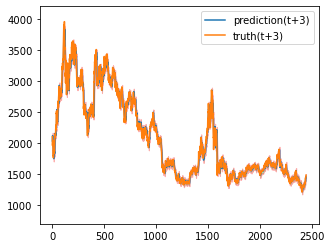

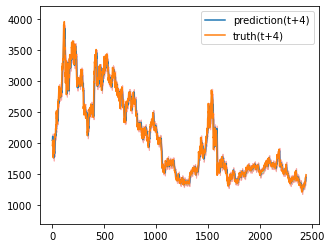

Train epoch:20 	Loss: -15.683760| Loss_in: 0.035123| Loss_out: 0.029563


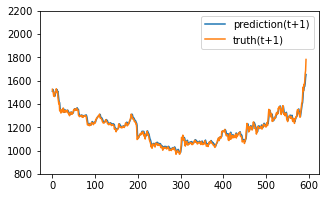

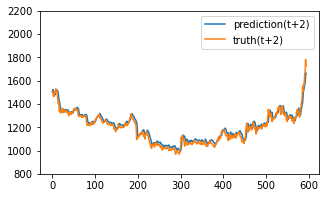

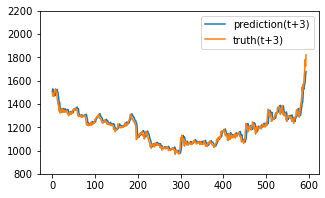

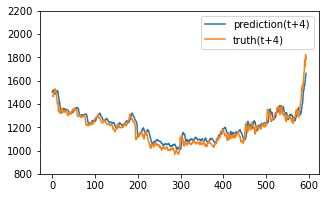

Test epoch:20 	Loss: 0.107699

Epoch: 21


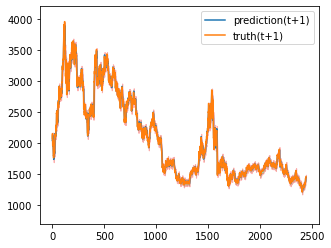

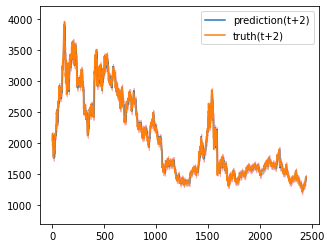

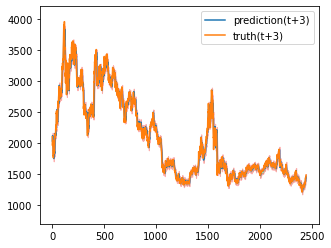

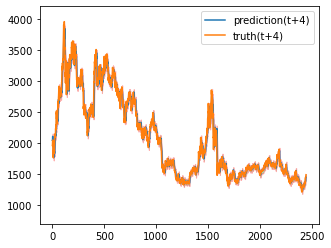

Train epoch:21 	Loss: -15.747101| Loss_in: 0.033415| Loss_out: 0.027926


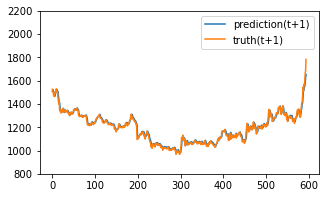

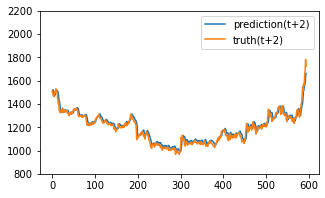

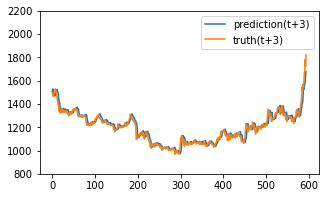

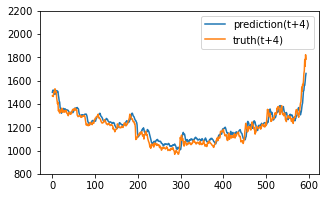

Test epoch:21 	Loss: 0.106302

Epoch: 22


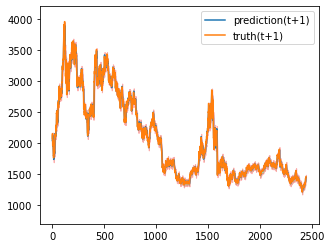

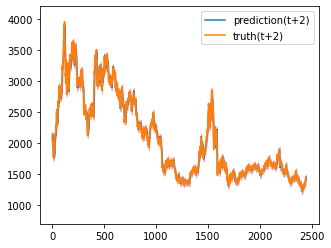

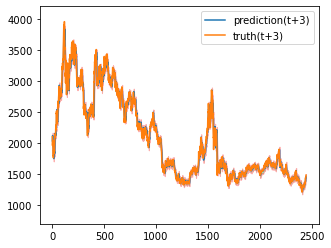

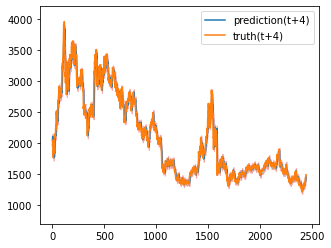

Train epoch:22 	Loss: -15.753525| Loss_in: 0.031837| Loss_out: 0.026831


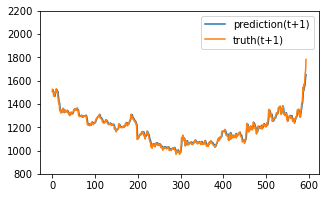

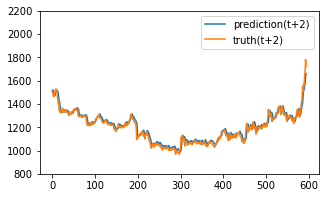

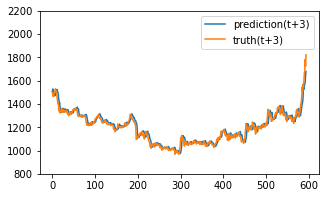

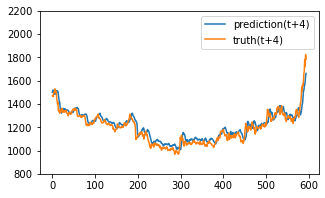

Test epoch:22 	Loss: 0.105903

Epoch: 23


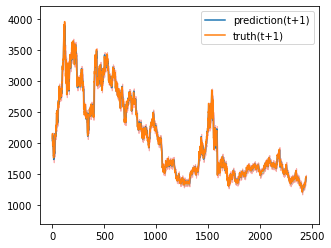

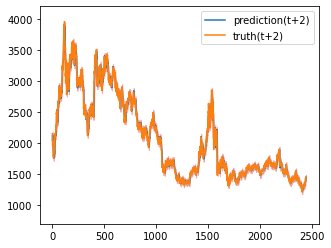

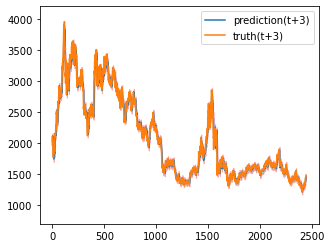

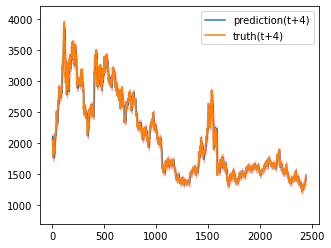

Train epoch:23 	Loss: -15.760002| Loss_in: 0.030467| Loss_out: 0.025318


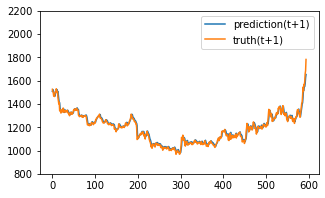

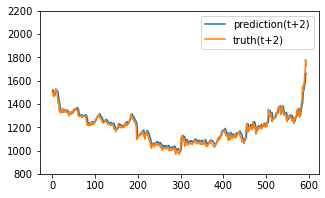

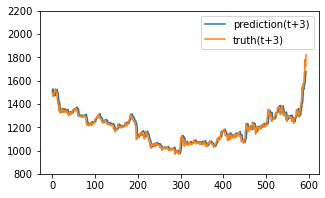

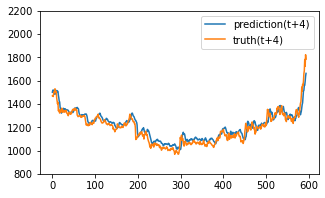

Test epoch:23 	Loss: 0.106943

Epoch: 24


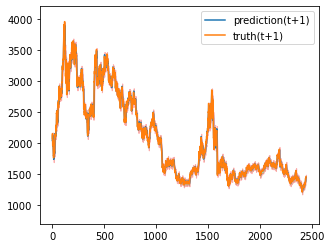

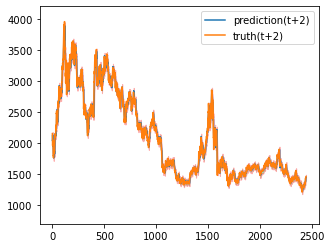

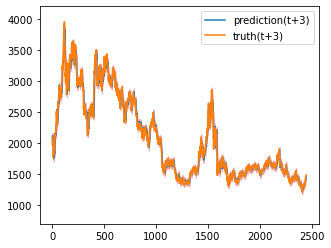

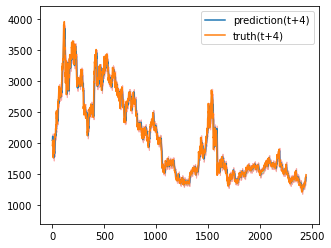

Train epoch:24 	Loss: -15.766414| Loss_in: 0.029156| Loss_out: 0.024792


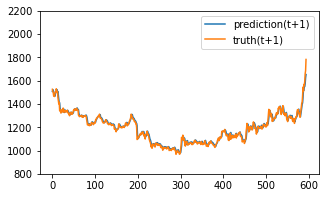

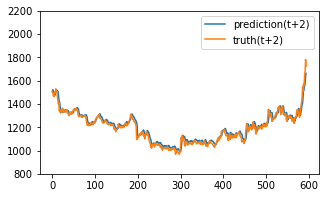

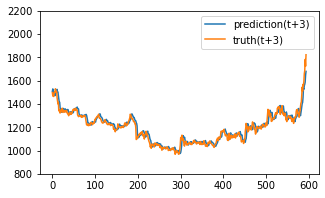

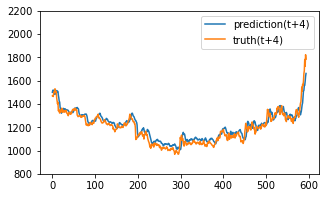

Test epoch:24 	Loss: 0.106466

Epoch: 25


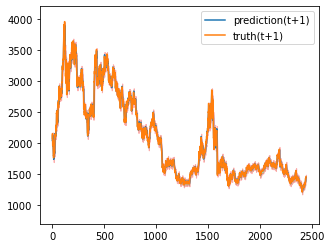

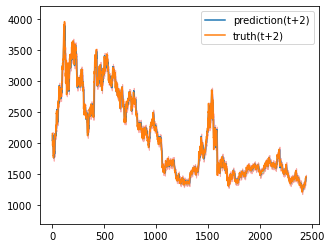

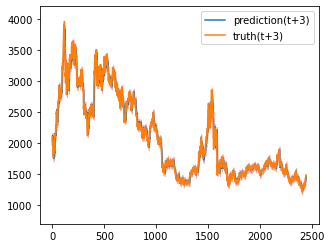

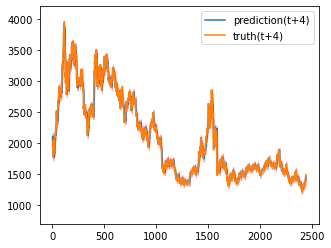

Train epoch:25 	Loss: -15.771858| Loss_in: 0.028036| Loss_out: 0.023769


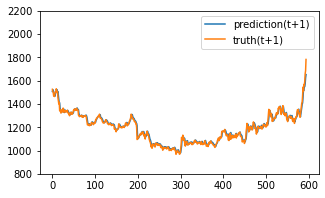

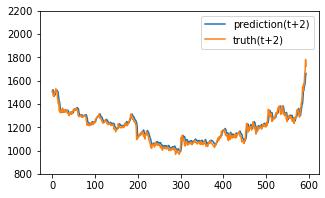

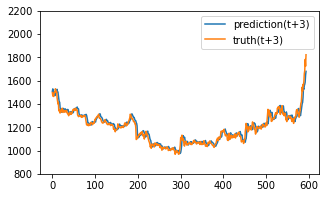

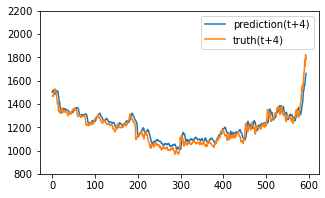

Test epoch:25 	Loss: 0.106465

Epoch: 26


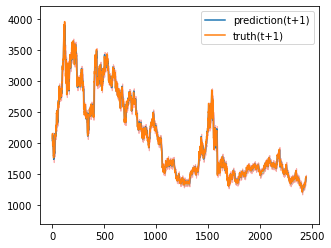

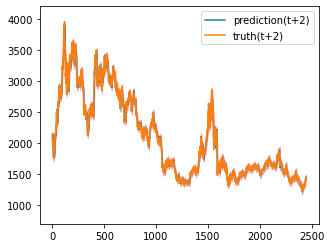

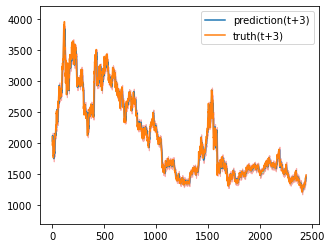

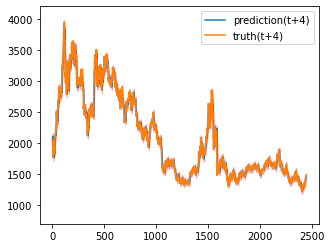

Train epoch:26 	Loss: -15.778402| Loss_in: 0.027141| Loss_out: 0.023476


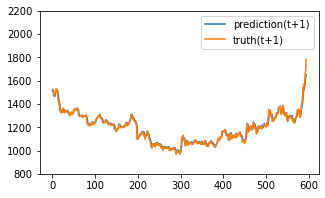

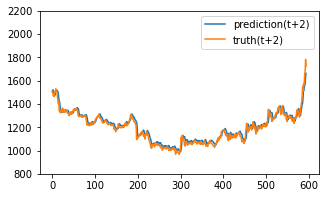

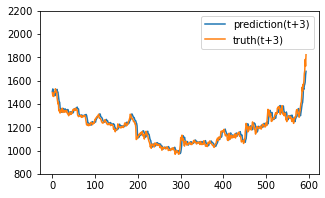

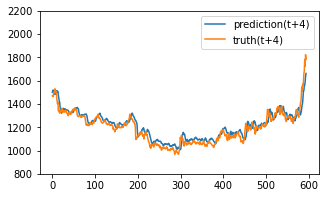

Test epoch:26 	Loss: 0.106104

Epoch: 27


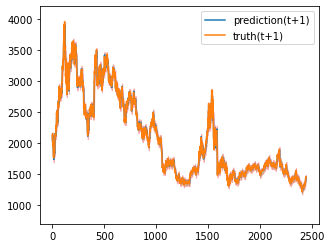

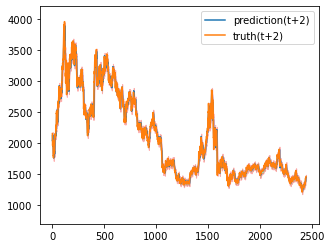

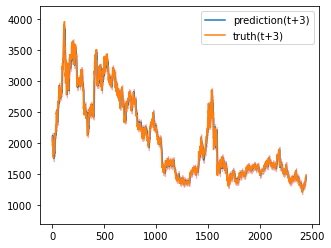

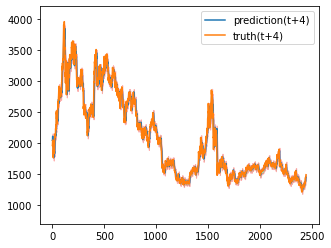

Train epoch:27 	Loss: -15.783622| Loss_in: 0.026303| Loss_out: 0.022529


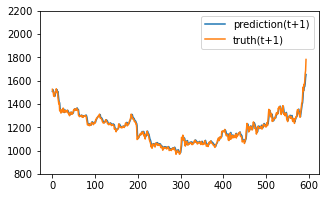

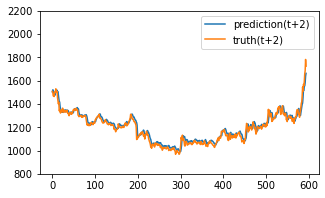

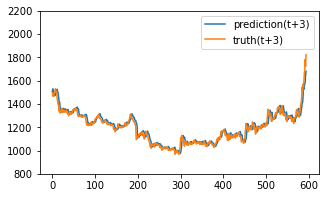

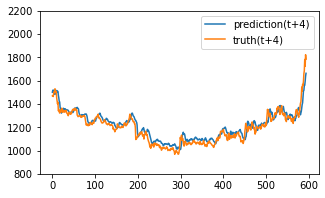

Test epoch:27 	Loss: 0.106630

Epoch: 28


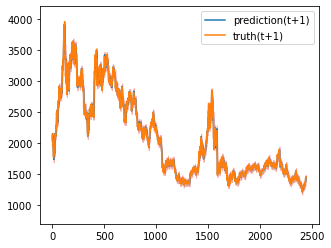

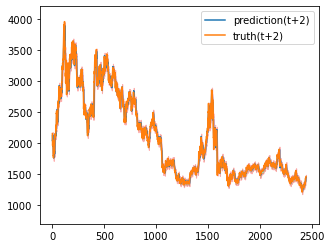

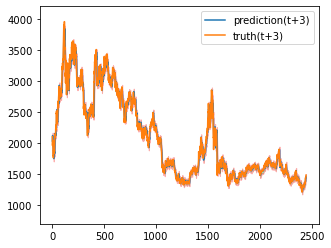

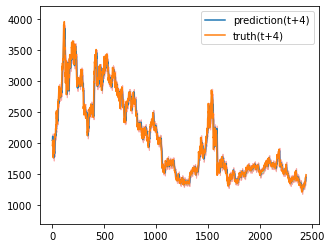

Train epoch:28 	Loss: -15.789261| Loss_in: 0.025422| Loss_out: 0.021934


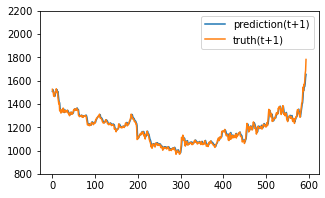

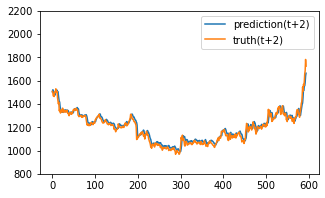

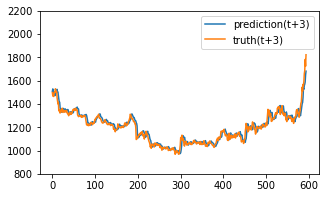

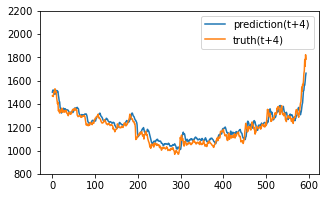

Test epoch:28 	Loss: 0.106581

Epoch: 29


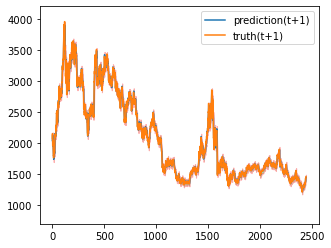

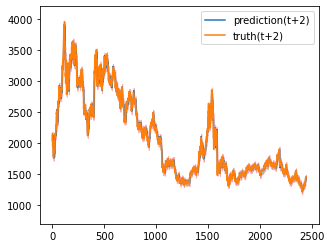

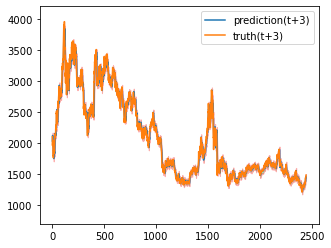

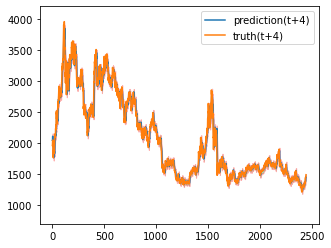

Train epoch:29 	Loss: -15.794867| Loss_in: 0.024659| Loss_out: 0.020966


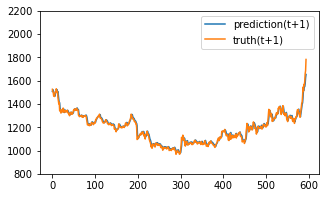

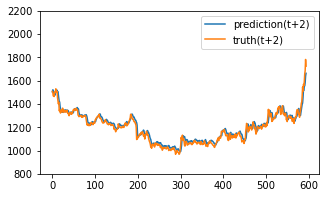

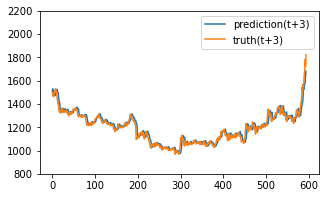

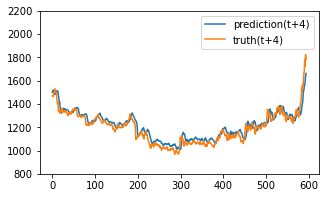

Test epoch:29 	Loss: 0.106515

Epoch: 30


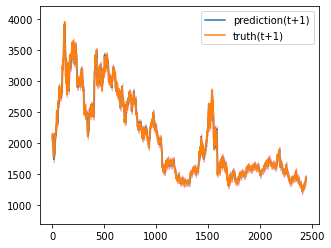

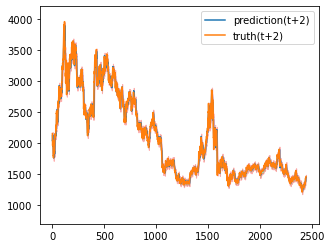

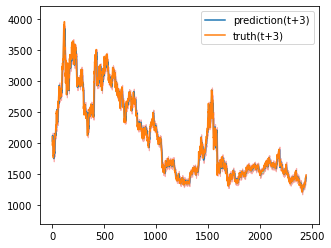

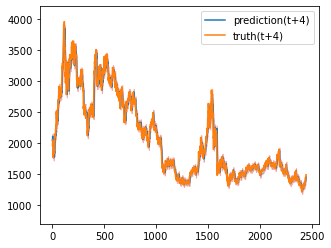

Train epoch:30 	Loss: -15.800710| Loss_in: 0.023998| Loss_out: 0.020900


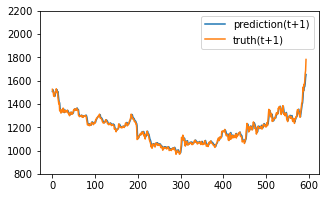

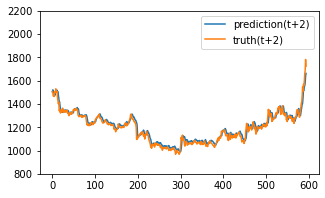

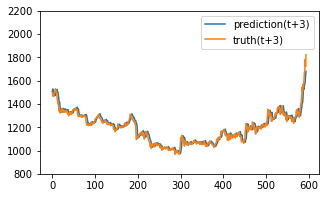

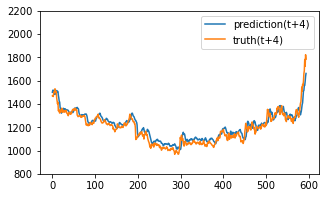

Test epoch:30 	Loss: 0.106251

Epoch: 31


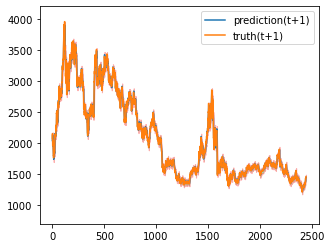

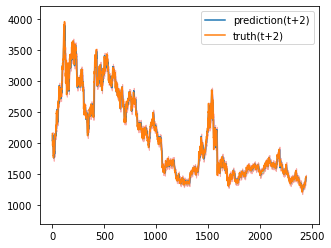

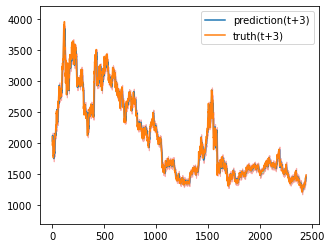

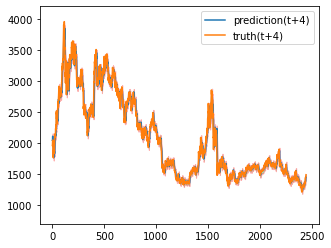

Train epoch:31 	Loss: -15.804965| Loss_in: 0.023353| Loss_out: 0.020370


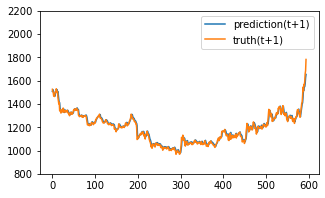

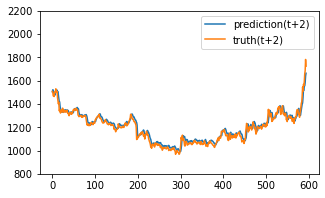

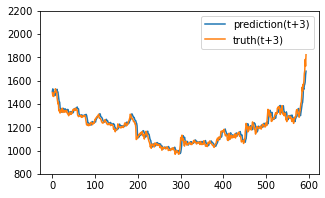

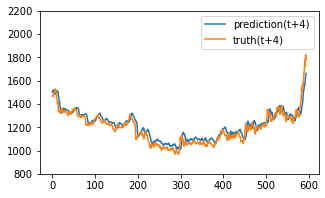

Test epoch:31 	Loss: 0.106908

Epoch: 32


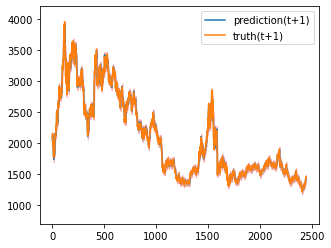

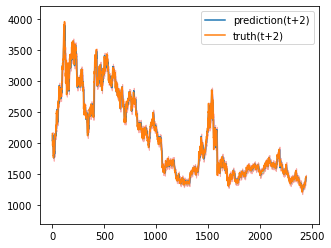

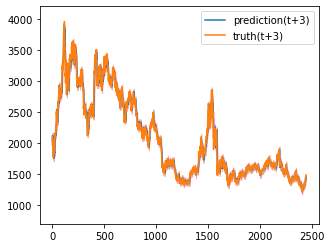

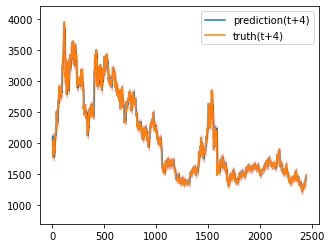

Train epoch:32 	Loss: -15.810140| Loss_in: 0.022783| Loss_out: 0.019864


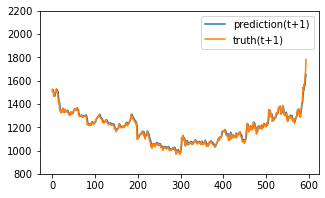

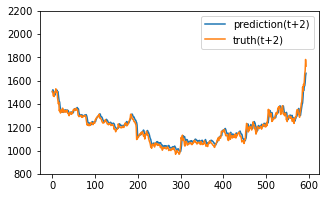

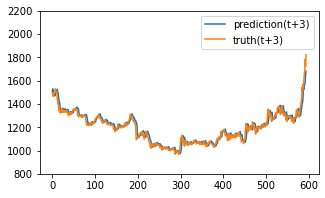

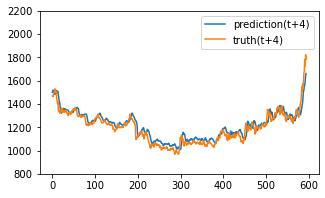

Test epoch:32 	Loss: 0.106738

Epoch: 33


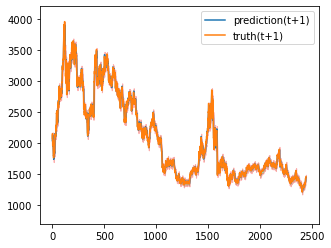

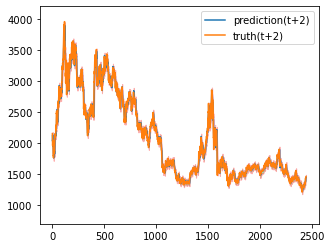

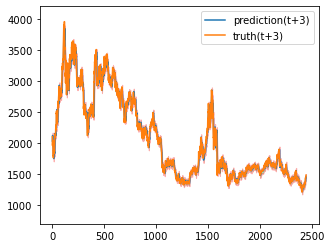

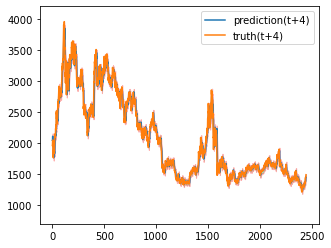

Train epoch:33 	Loss: -15.815400| Loss_in: 0.022201| Loss_out: 0.019282


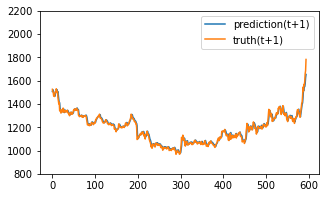

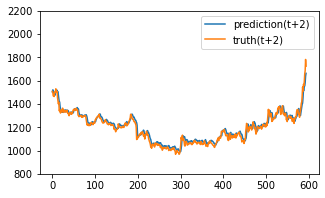

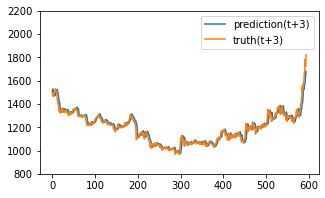

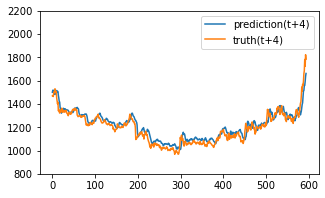

Test epoch:33 	Loss: 0.106229

Epoch: 34


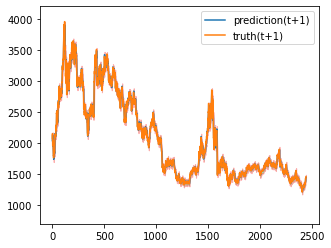

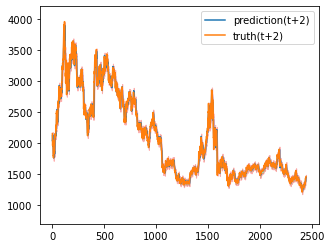

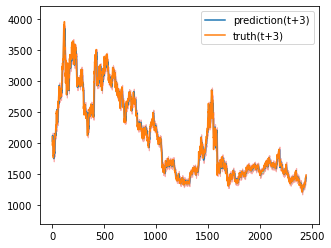

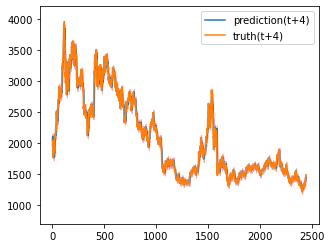

Train epoch:34 	Loss: -15.820276| Loss_in: 0.021597| Loss_out: 0.018745


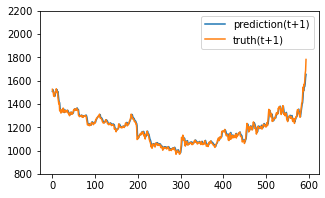

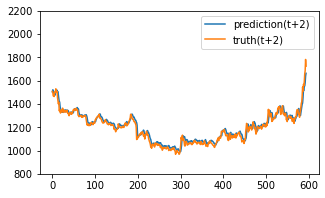

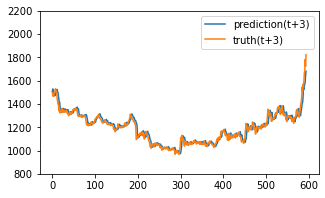

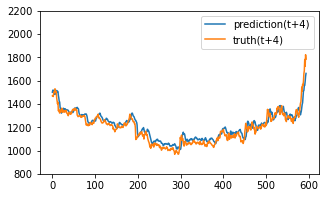

Test epoch:34 	Loss: 0.106455

Epoch: 35


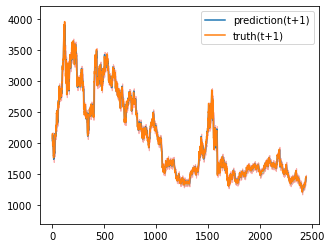

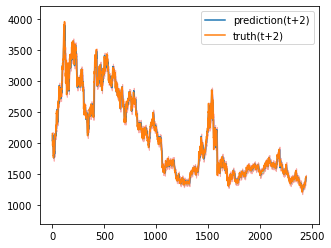

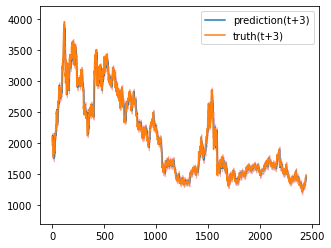

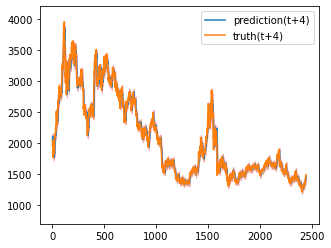

Train epoch:35 	Loss: -15.824816| Loss_in: 0.020979| Loss_out: 0.018443


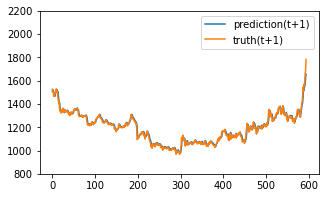

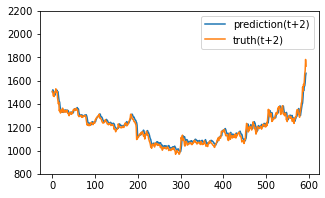

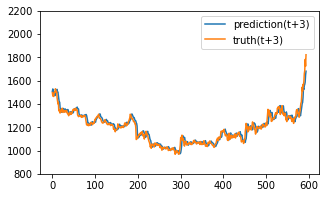

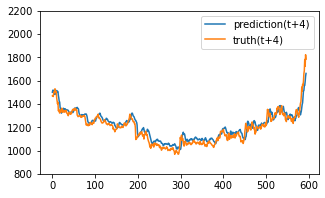

Test epoch:35 	Loss: 0.106236

Epoch: 36


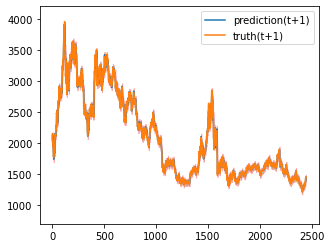

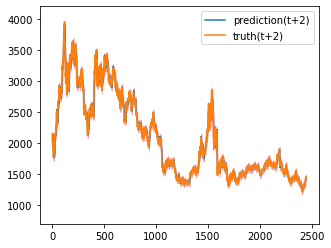

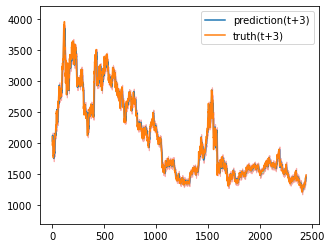

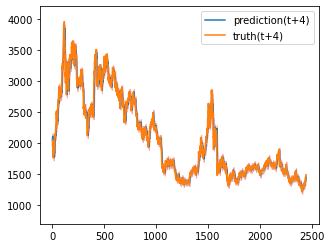

Train epoch:36 	Loss: -15.829739| Loss_in: 0.020608| Loss_out: 0.018367


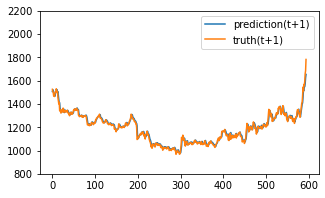

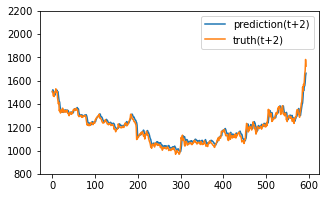

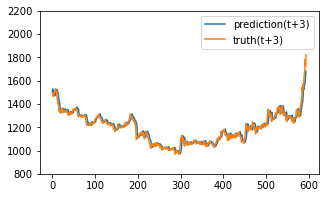

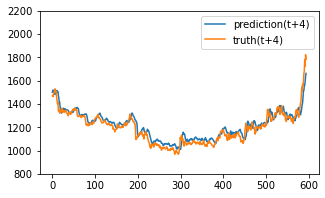

Test epoch:36 	Loss: 0.106405

Epoch: 37


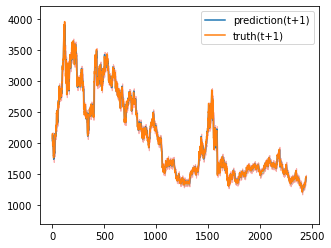

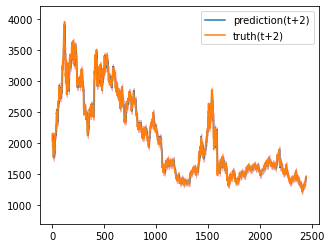

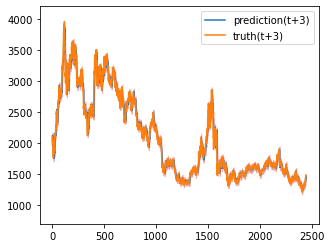

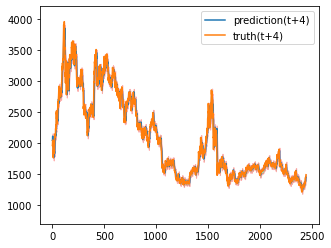

Train epoch:37 	Loss: -15.834384| Loss_in: 0.020156| Loss_out: 0.017567


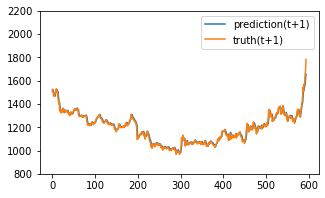

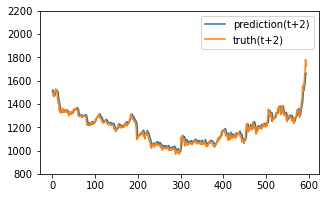

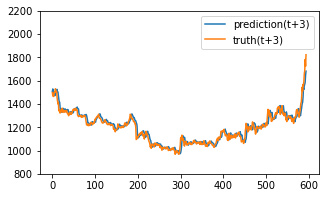

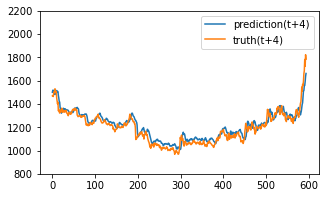

Test epoch:37 	Loss: 0.106279

Epoch: 38


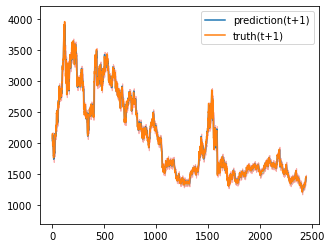

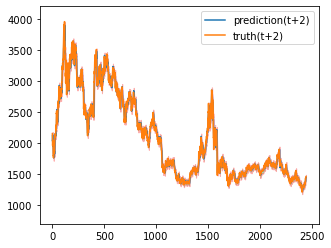

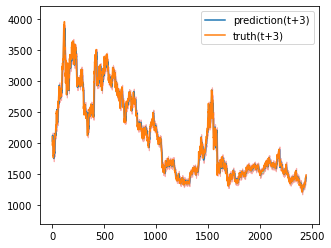

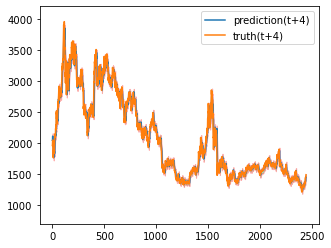

Train epoch:38 	Loss: -15.838642| Loss_in: 0.019819| Loss_out: 0.017906


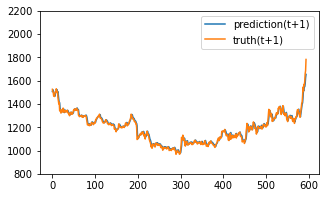

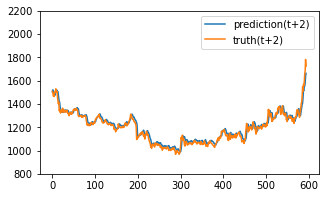

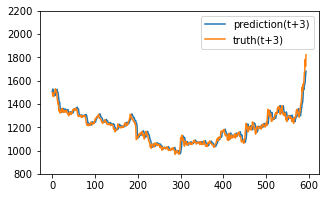

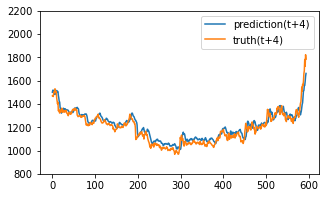

Test epoch:38 	Loss: 0.106279

Epoch: 39


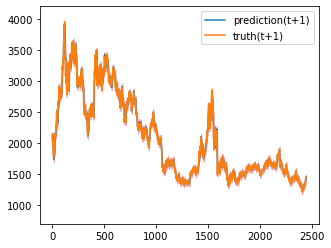

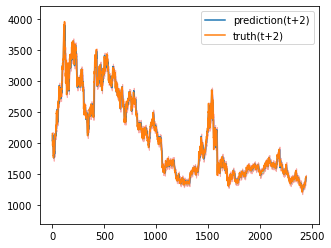

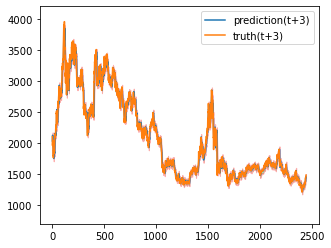

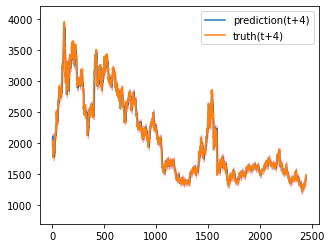

Train epoch:39 	Loss: -15.837784| Loss_in: 0.019444| Loss_out: 0.017156


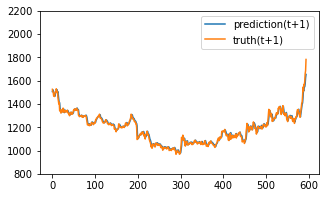

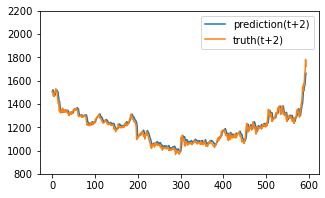

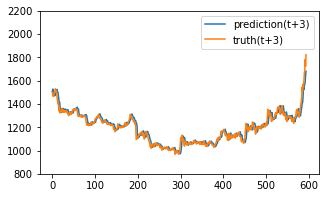

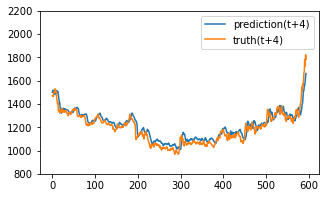

Test epoch:39 	Loss: 0.105977

Epoch: 40


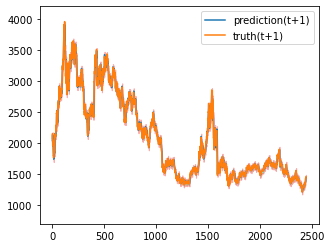

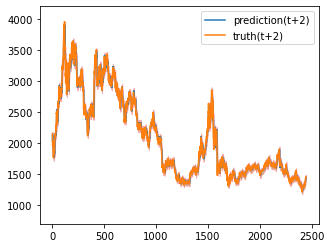

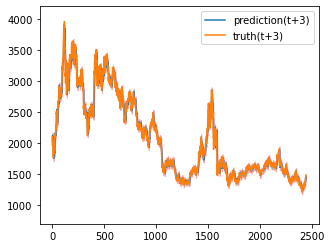

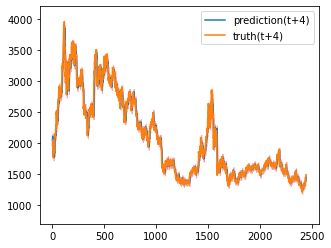

Train epoch:40 	Loss: -15.847129| Loss_in: 0.019088| Loss_out: 0.017201


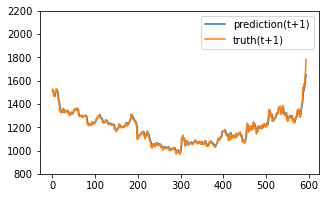

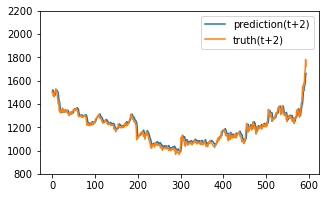

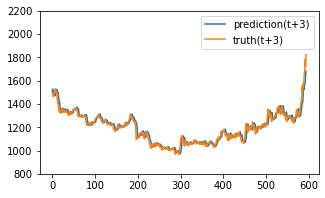

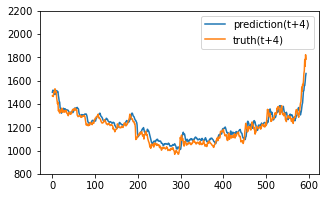

Test epoch:40 	Loss: 0.105926

Epoch: 41


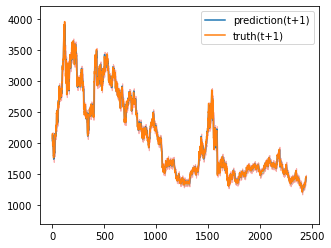

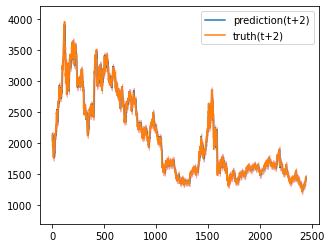

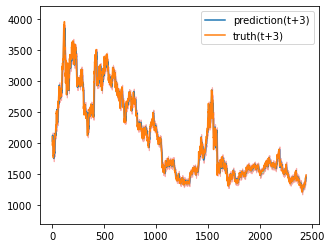

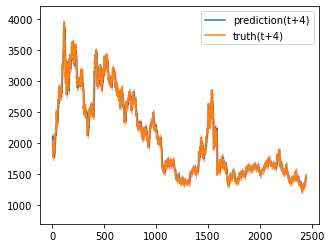

Train epoch:41 	Loss: -15.851635| Loss_in: 0.018762| Loss_out: 0.016728


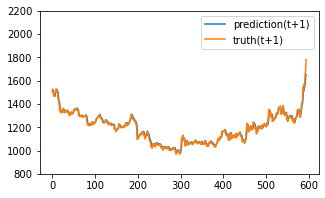

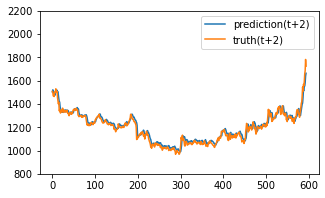

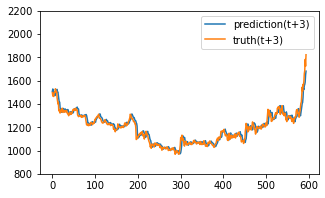

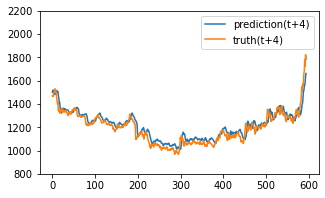

Test epoch:41 	Loss: 0.106188

Epoch: 42


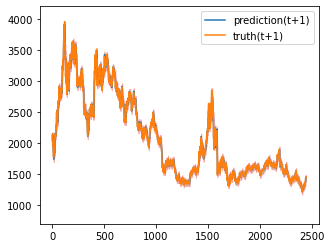

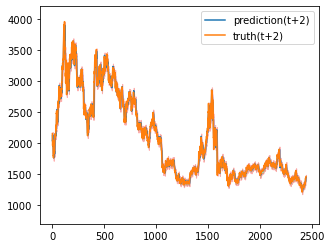

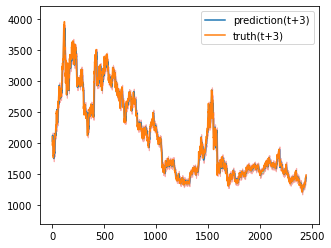

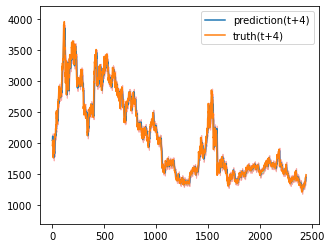

Train epoch:42 	Loss: -15.855560| Loss_in: 0.018376| Loss_out: 0.016362


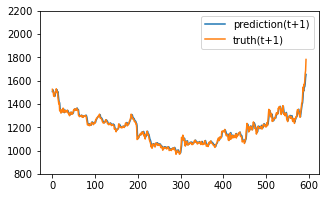

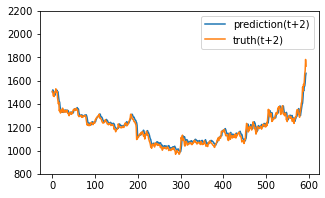

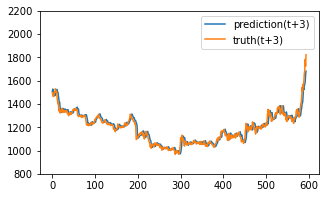

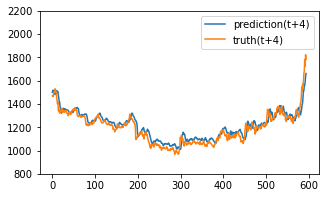

Test epoch:42 	Loss: 0.106028

Epoch: 43


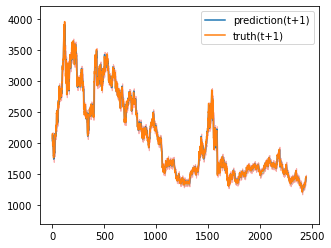

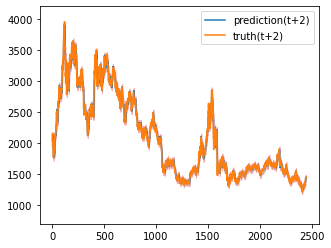

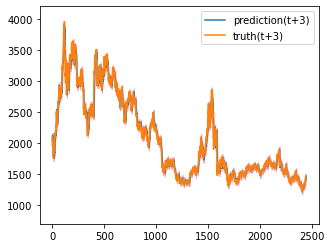

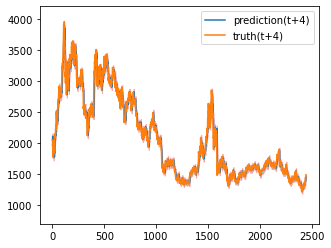

Train epoch:43 	Loss: -15.859545| Loss_in: 0.018047| Loss_out: 0.016158


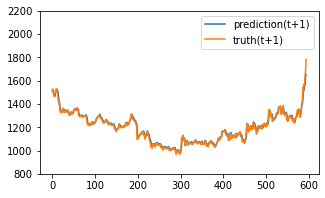

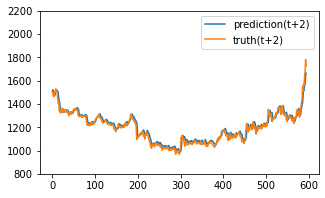

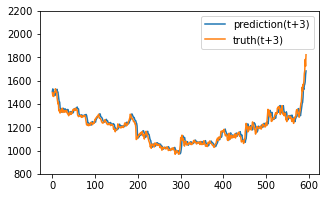

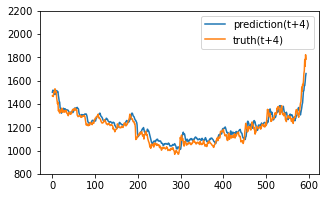

Test epoch:43 	Loss: 0.106496

Epoch: 44


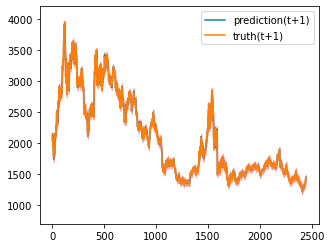

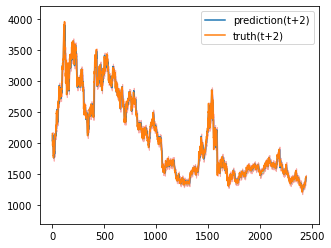

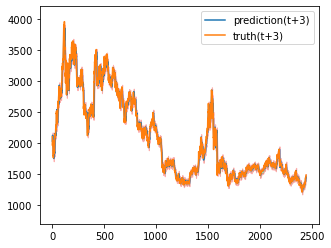

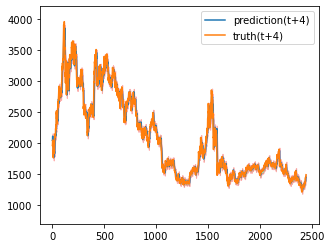

Train epoch:44 	Loss: -15.863133| Loss_in: 0.017700| Loss_out: 0.015646


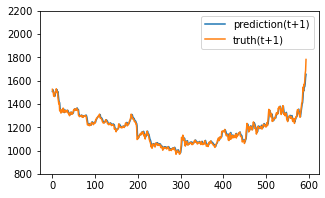

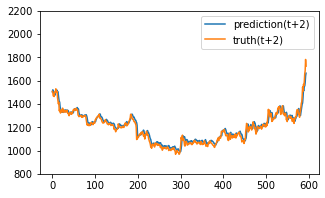

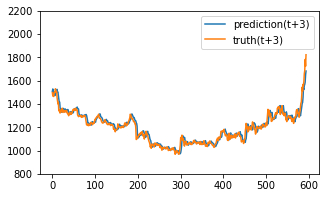

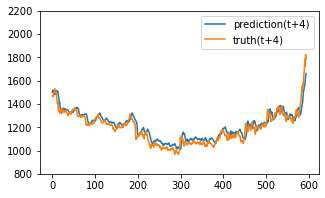

Test epoch:44 	Loss: 0.106478

Epoch: 45


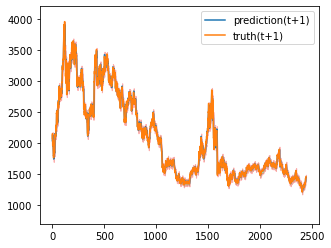

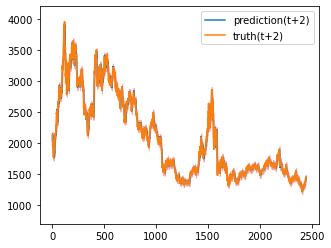

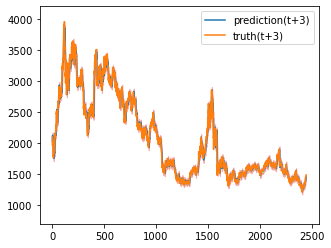

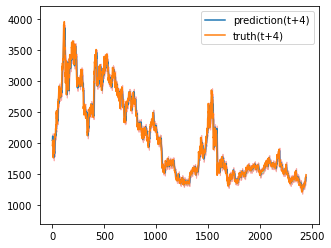

Train epoch:45 	Loss: -15.867473| Loss_in: 0.017451| Loss_out: 0.015869


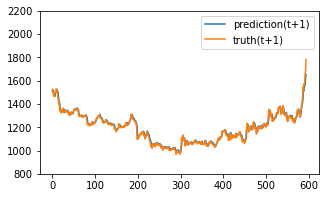

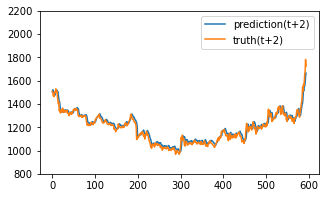

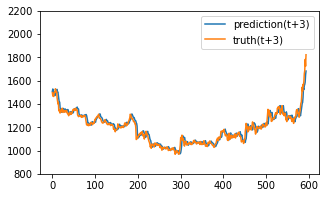

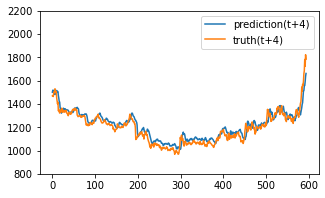

Test epoch:45 	Loss: 0.106404

Epoch: 46


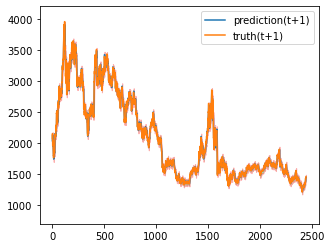

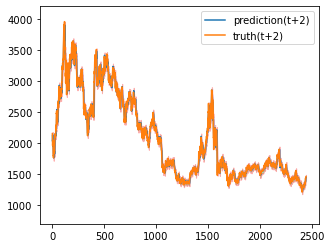

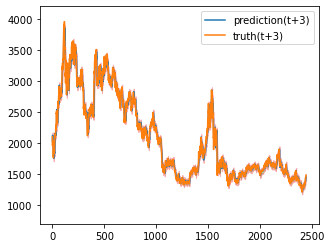

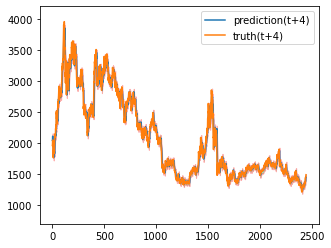

Train epoch:46 	Loss: -15.871306| Loss_in: 0.017243| Loss_out: 0.015610


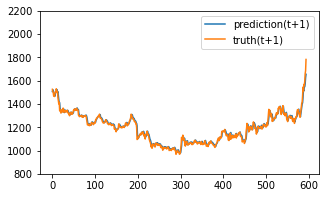

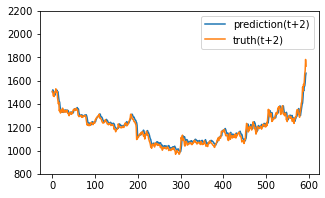

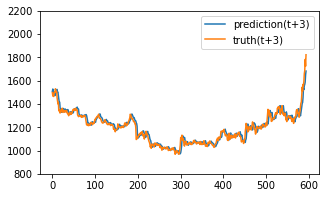

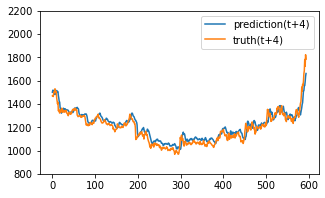

Test epoch:46 	Loss: 0.106203

Epoch: 47


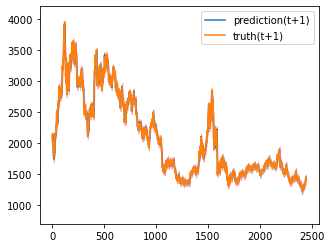

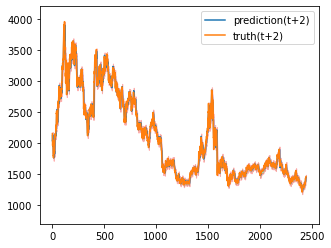

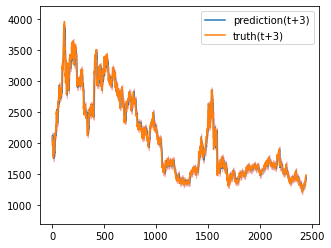

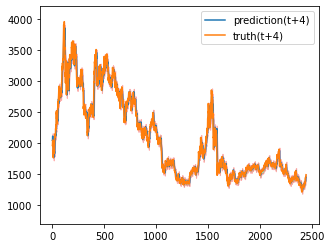

Train epoch:47 	Loss: -15.875274| Loss_in: 0.017051| Loss_out: 0.015851


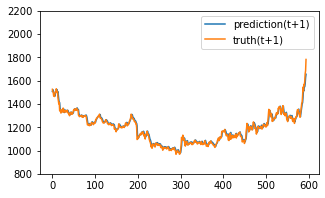

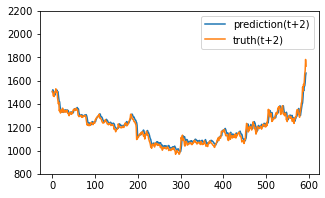

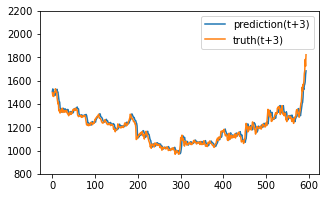

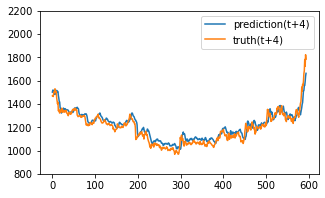

Test epoch:47 	Loss: 0.106878

Epoch: 48


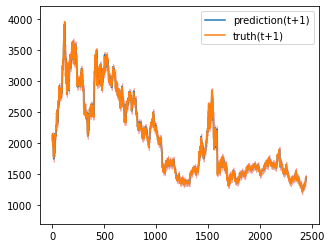

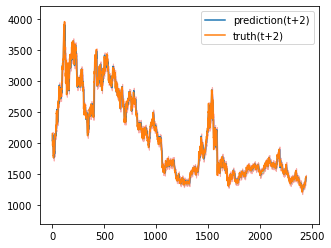

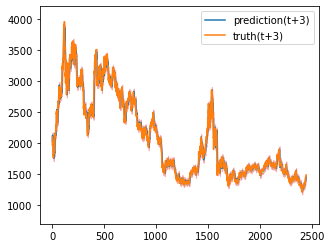

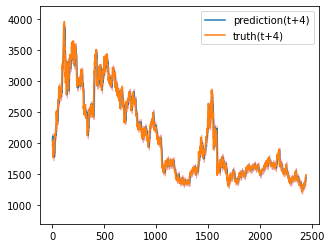

Train epoch:48 	Loss: -15.878664| Loss_in: 0.016859| Loss_out: 0.015128


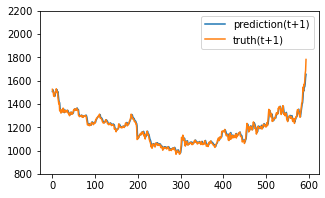

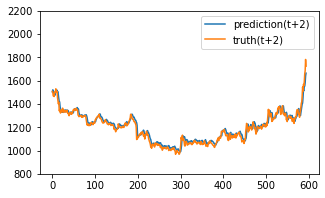

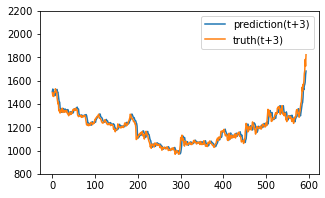

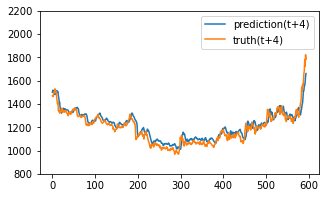

Test epoch:48 	Loss: 0.106171

Epoch: 49


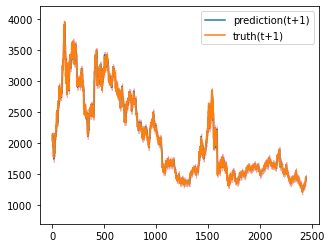

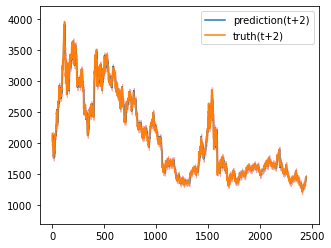

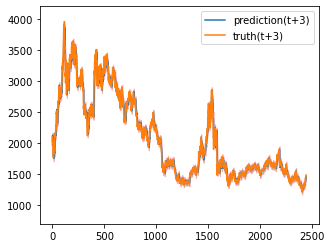

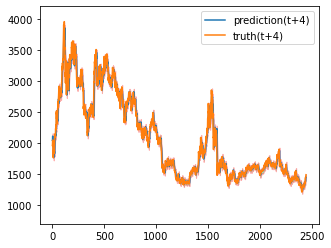

Train epoch:49 	Loss: -15.872114| Loss_in: 0.016677| Loss_out: 0.015344


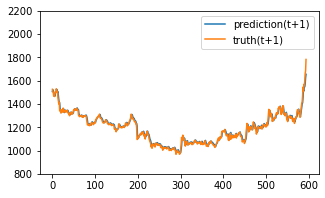

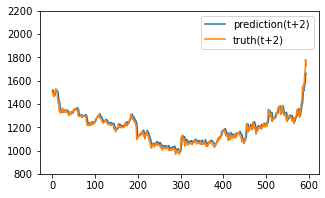

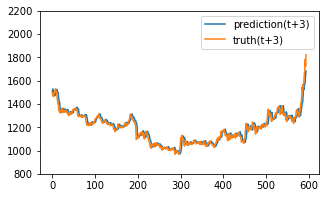

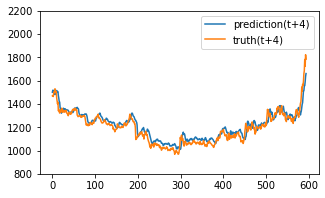

Test epoch:49 	Loss: 0.106281

Epoch: 50


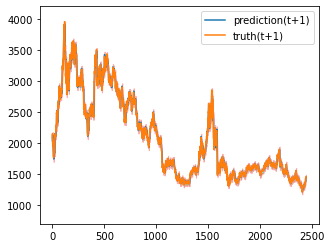

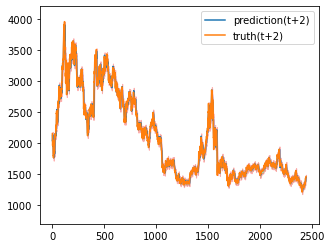

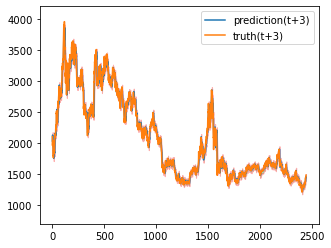

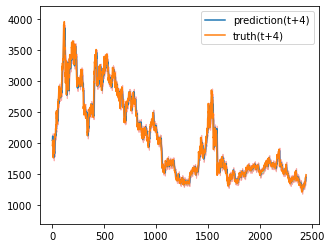

Train epoch:50 	Loss: -15.885766| Loss_in: 0.016466| Loss_out: 0.014930


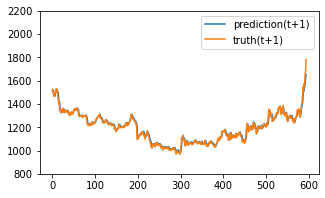

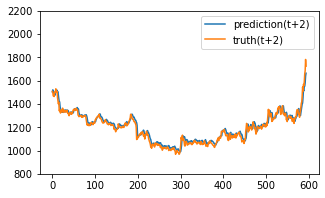

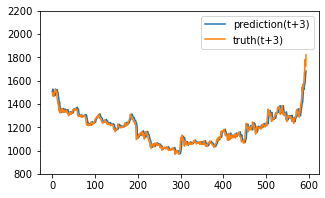

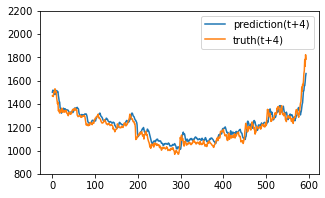

Test epoch:50 	Loss: 0.106258

Epoch: 51


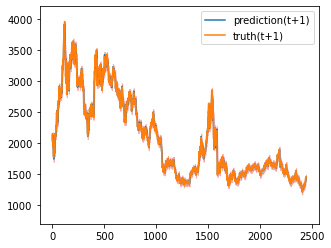

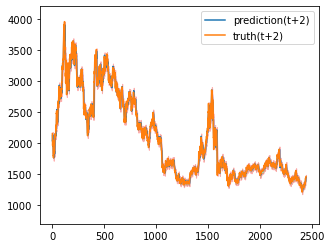

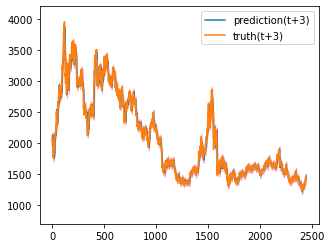

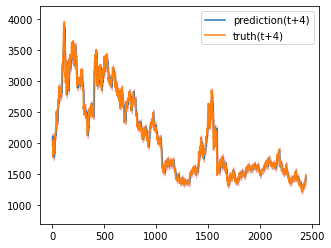

Train epoch:51 	Loss: -15.889642| Loss_in: 0.016223| Loss_out: 0.014567


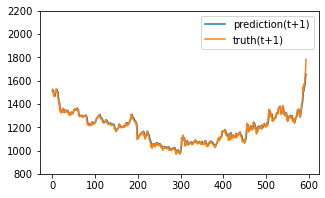

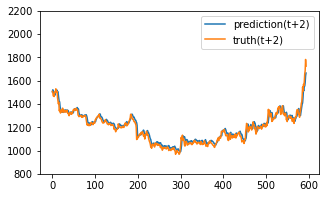

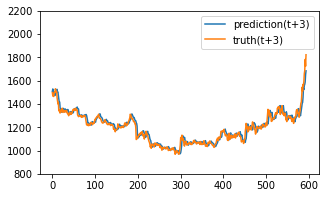

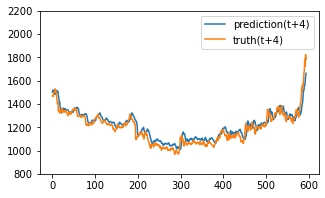

Test epoch:51 	Loss: 0.106738

Epoch: 52


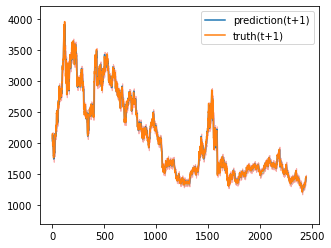

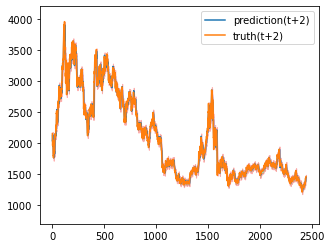

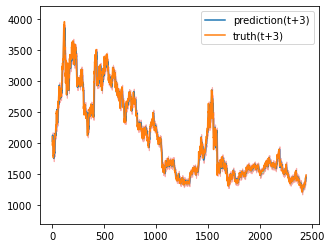

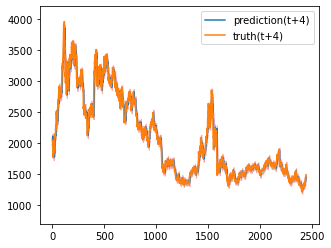

Train epoch:52 	Loss: -15.893102| Loss_in: 0.015987| Loss_out: 0.014403


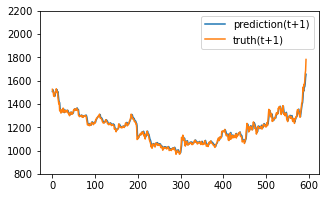

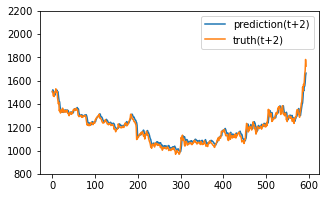

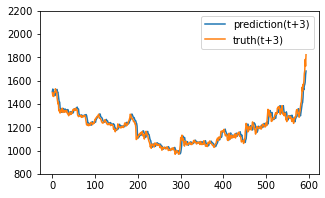

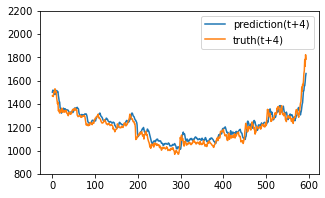

Test epoch:52 	Loss: 0.106431

Epoch: 53


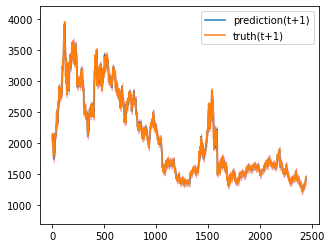

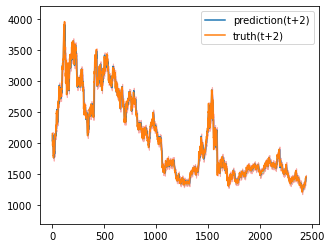

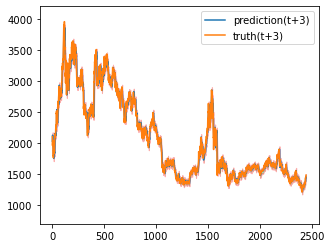

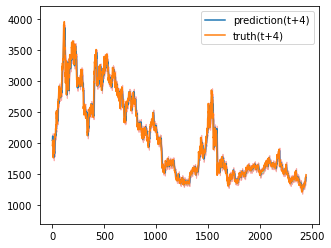

Train epoch:53 	Loss: -15.896141| Loss_in: 0.015779| Loss_out: 0.014541


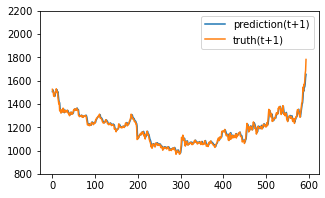

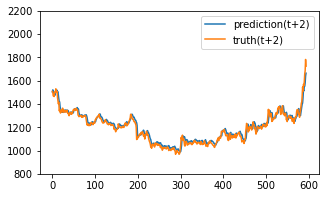

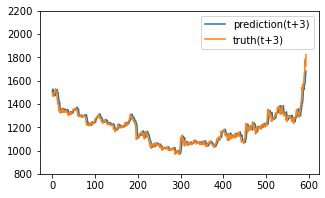

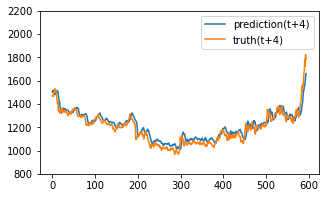

Test epoch:53 	Loss: 0.106003

Epoch: 54


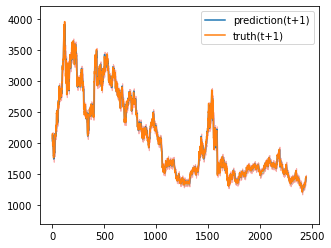

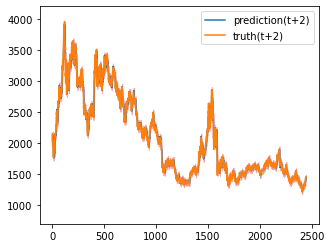

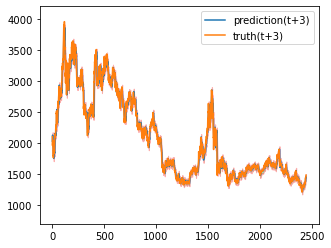

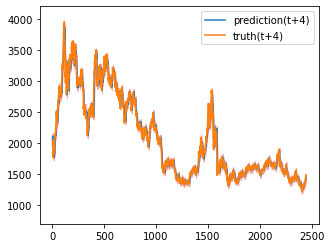

Train epoch:54 	Loss: -15.899900| Loss_in: 0.015649| Loss_out: 0.014183


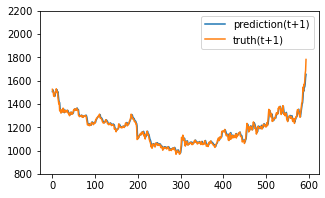

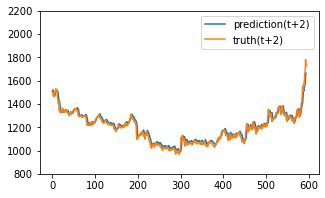

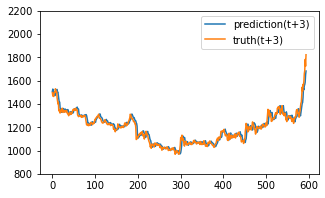

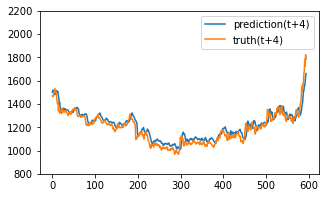

Test epoch:54 	Loss: 0.106159

Epoch: 55


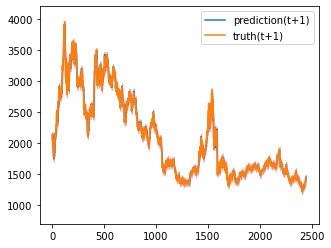

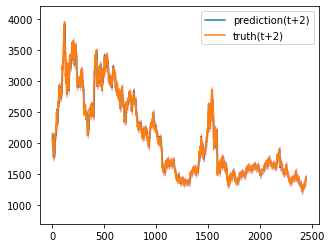

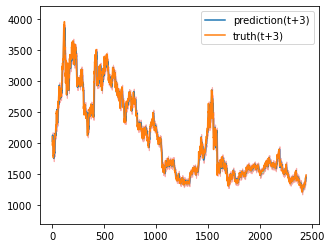

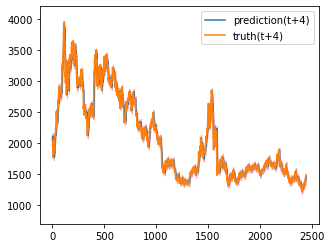

Train epoch:55 	Loss: -15.903470| Loss_in: 0.015474| Loss_out: 0.014244


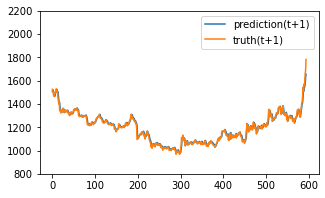

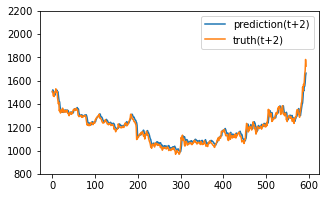

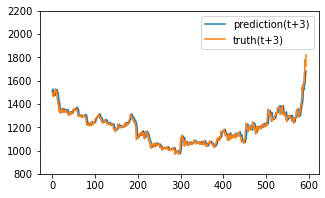

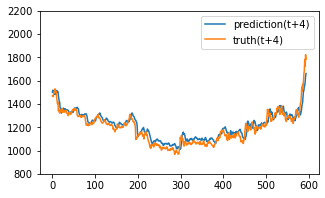

Test epoch:55 	Loss: 0.106358

Epoch: 56


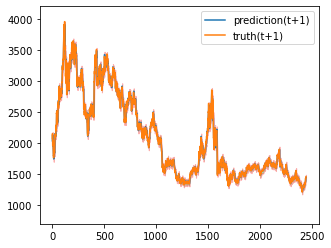

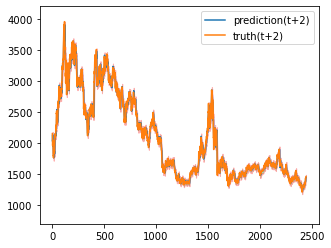

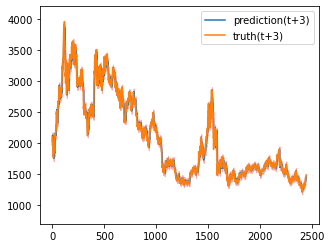

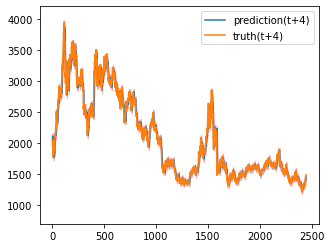

Train epoch:56 	Loss: -15.907215| Loss_in: 0.015362| Loss_out: 0.013817


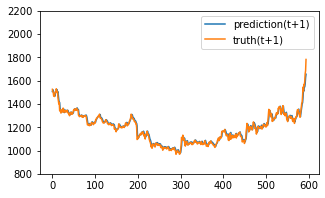

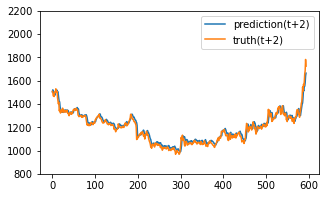

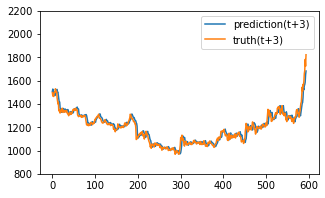

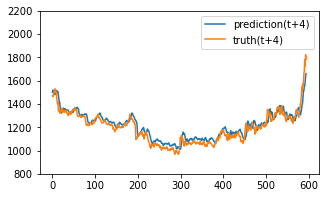

Test epoch:56 	Loss: 0.106506

Epoch: 57


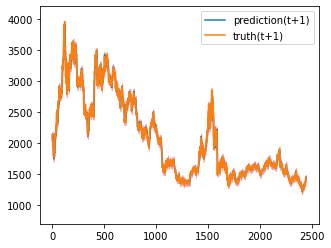

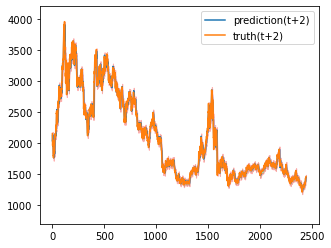

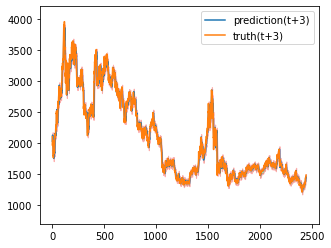

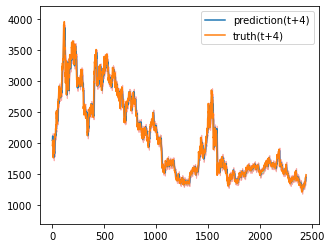

Train epoch:57 	Loss: -15.910366| Loss_in: 0.015140| Loss_out: 0.013611


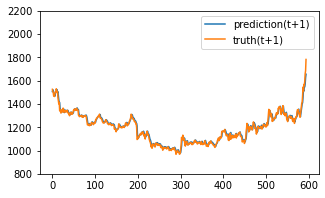

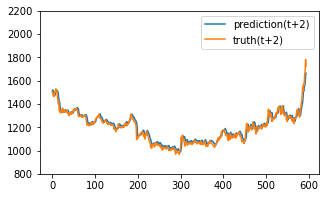

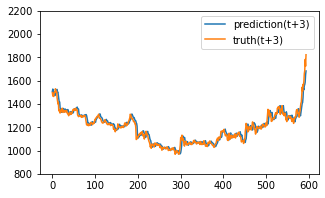

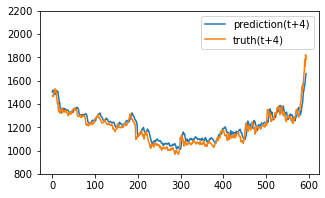

Test epoch:57 	Loss: 0.106420

Epoch: 58


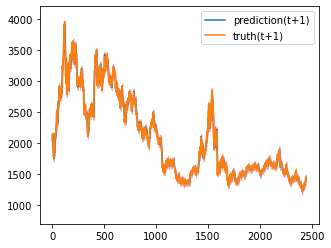

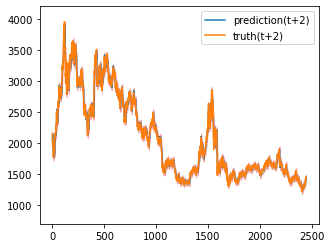

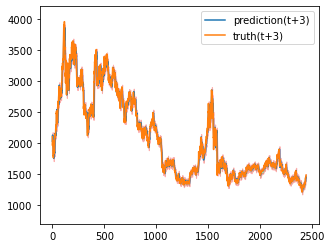

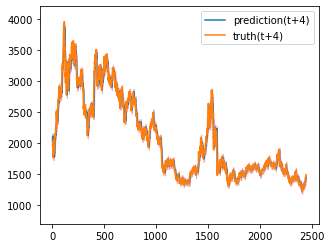

Train epoch:58 	Loss: -15.913640| Loss_in: 0.014920| Loss_out: 0.013532


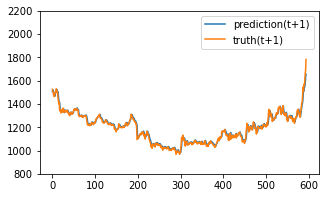

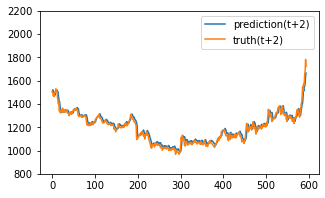

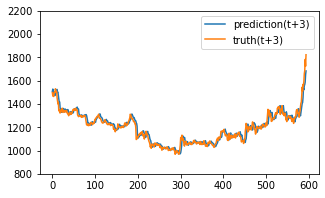

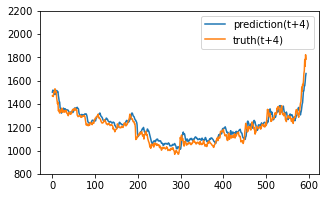

Test epoch:58 	Loss: 0.106453

Epoch: 59


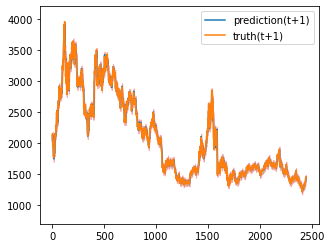

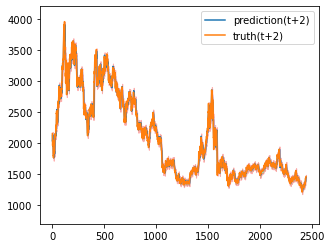

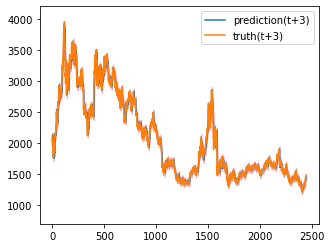

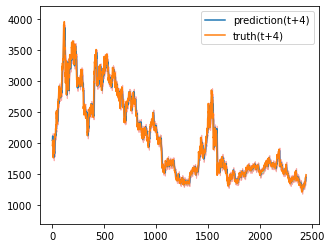

Train epoch:59 	Loss: -15.916494| Loss_in: 0.014813| Loss_out: 0.013955


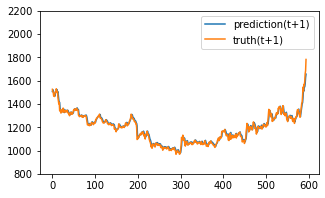

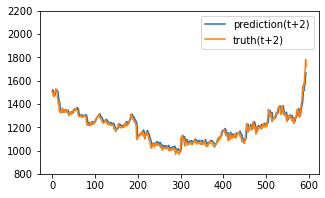

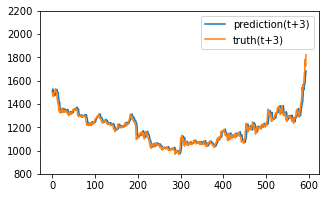

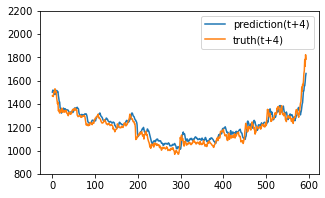

Test epoch:59 	Loss: 0.106695

Epoch: 60


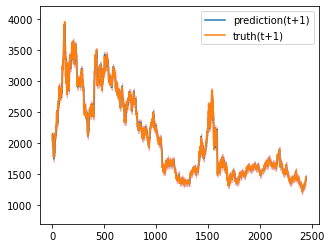

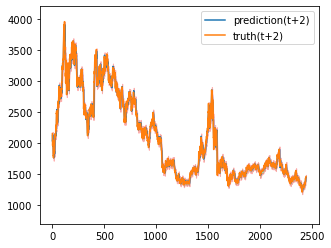

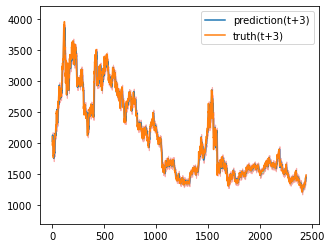

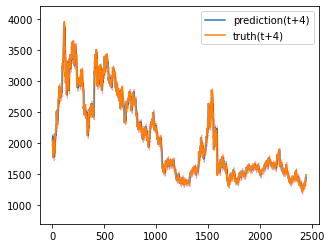

Train epoch:60 	Loss: -15.919651| Loss_in: 0.014805| Loss_out: 0.013464


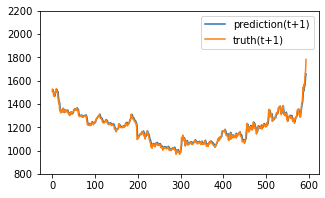

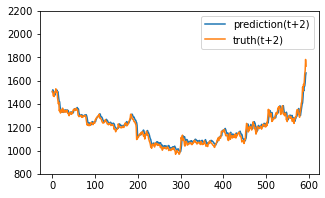

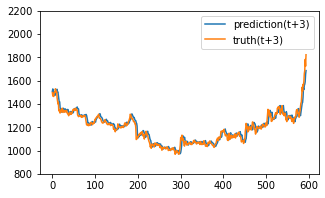

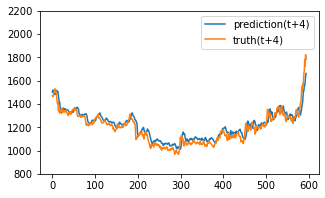

Test epoch:60 	Loss: 0.106795

Epoch: 61


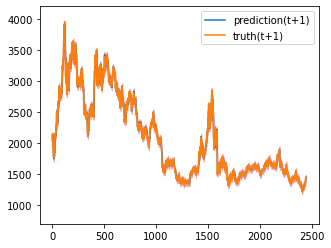

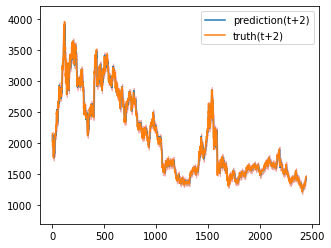

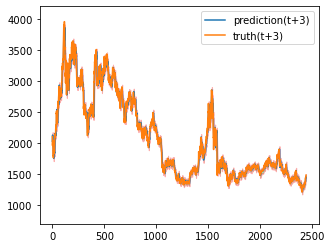

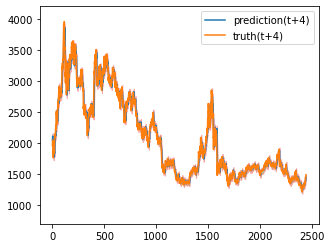

Train epoch:61 	Loss: -15.923167| Loss_in: 0.014633| Loss_out: 0.013464


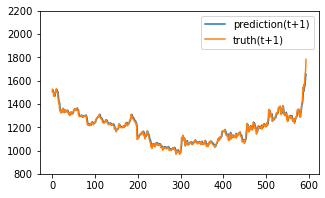

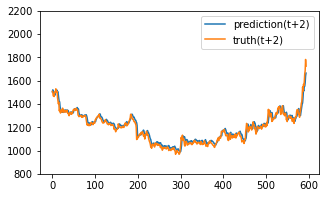

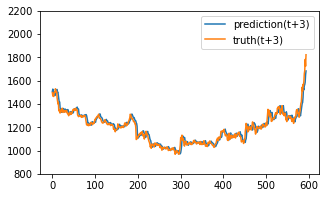

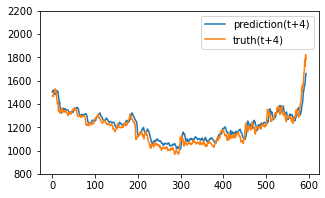

Test epoch:61 	Loss: 0.106478

Epoch: 62


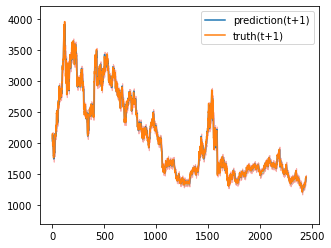

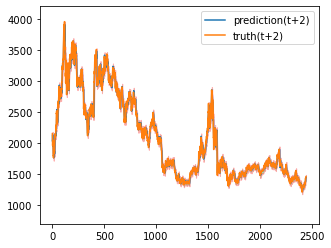

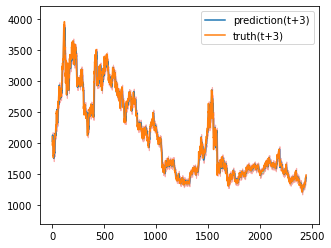

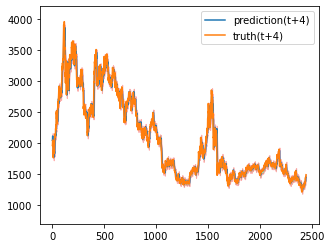

Train epoch:62 	Loss: -15.926314| Loss_in: 0.014470| Loss_out: 0.013503


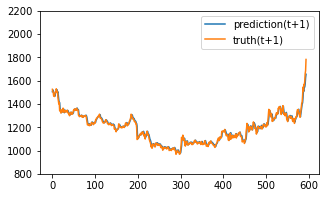

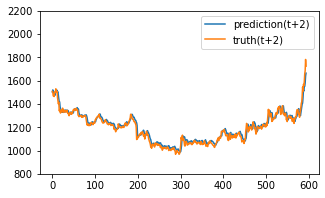

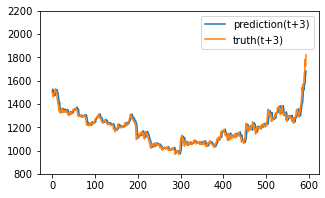

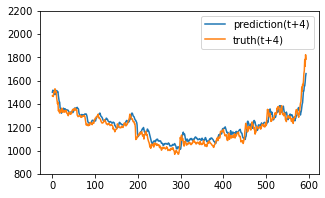

Test epoch:62 	Loss: 0.105713

Epoch: 63


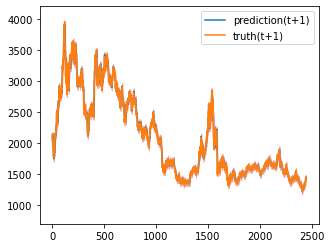

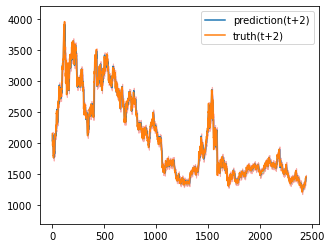

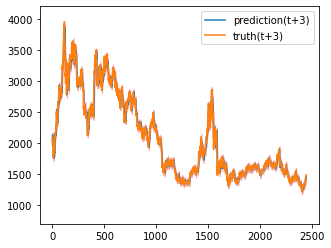

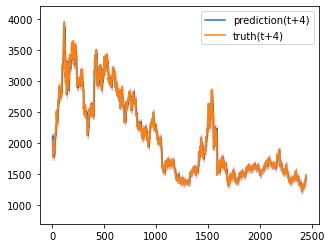

Train epoch:63 	Loss: -15.929037| Loss_in: 0.014370| Loss_out: 0.012870


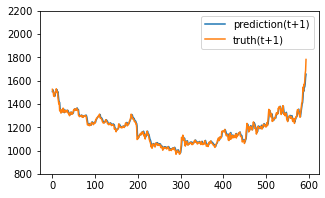

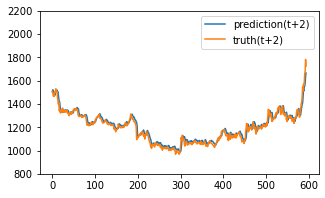

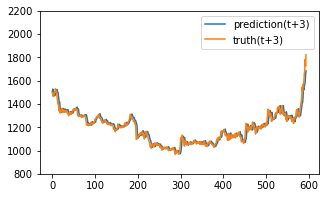

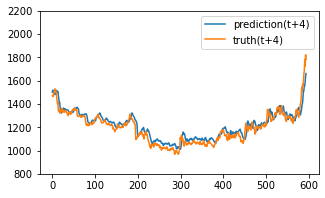

Test epoch:63 	Loss: 0.106460

Epoch: 64


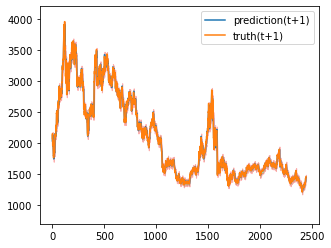

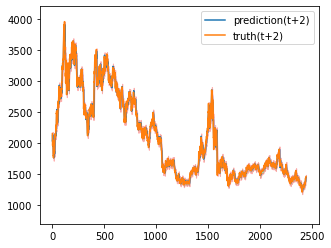

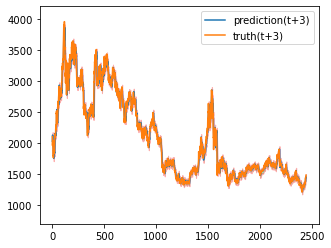

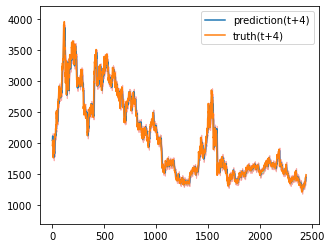

Train epoch:64 	Loss: -15.932236| Loss_in: 0.014215| Loss_out: 0.013225


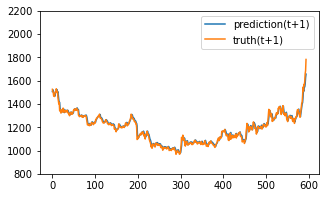

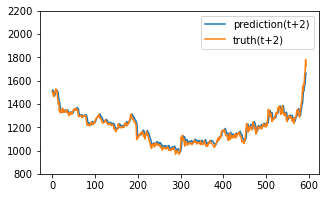

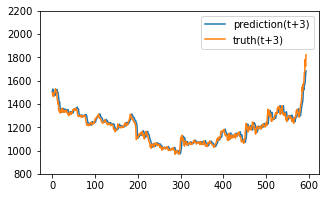

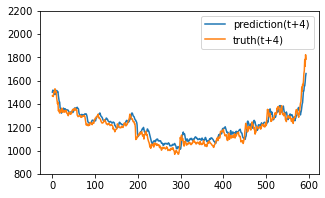

Test epoch:64 	Loss: 0.106512

Epoch: 65


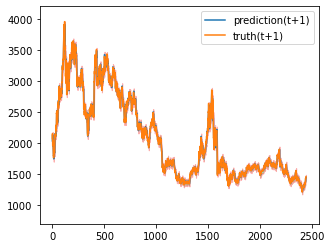

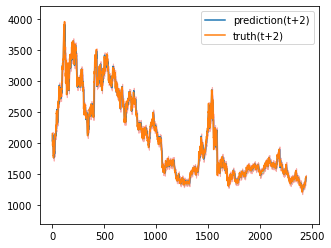

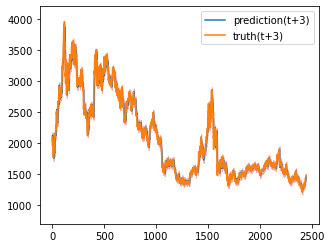

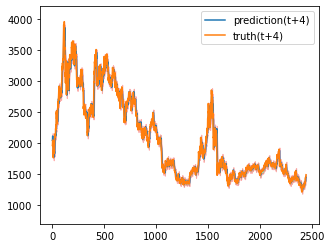

Train epoch:65 	Loss: -15.935280| Loss_in: 0.014133| Loss_out: 0.012957


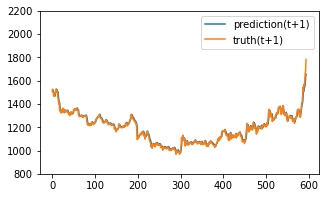

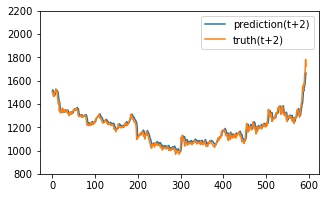

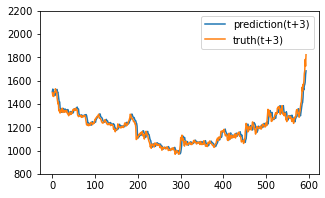

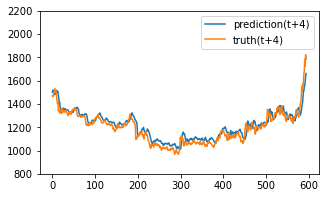

Test epoch:65 	Loss: 0.106455

Epoch: 66


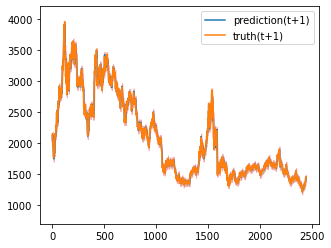

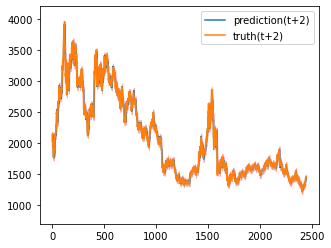

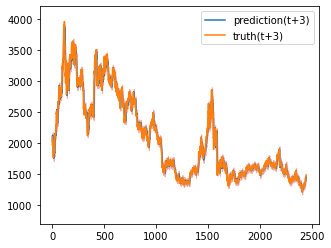

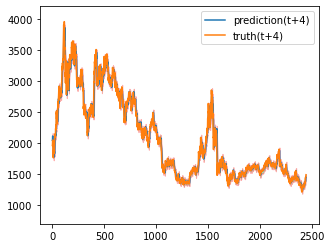

Train epoch:66 	Loss: -15.938291| Loss_in: 0.014044| Loss_out: 0.013106


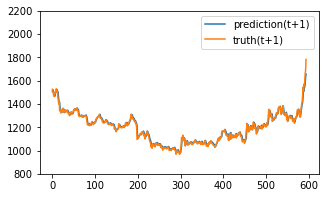

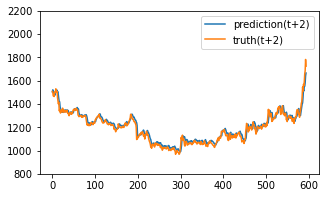

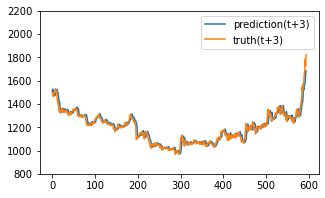

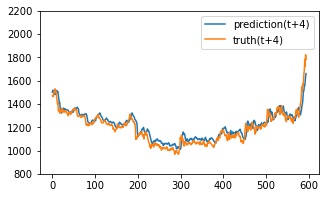

Test epoch:66 	Loss: 0.106517

Epoch: 67


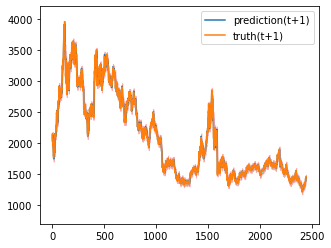

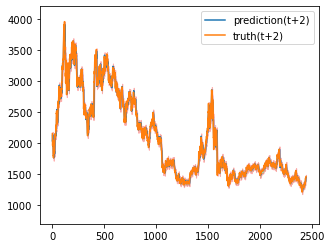

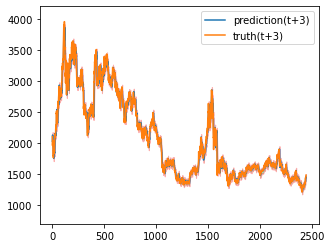

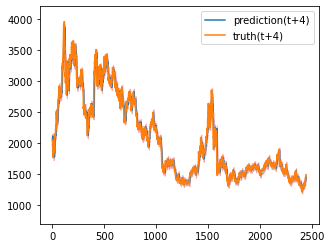

Train epoch:67 	Loss: -15.927005| Loss_in: 0.013991| Loss_out: 0.012722


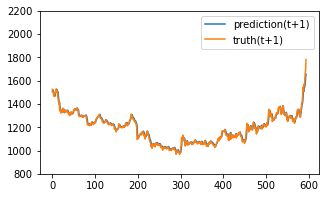

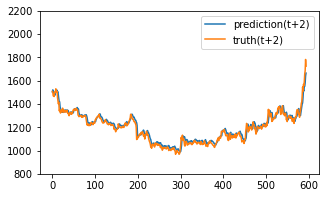

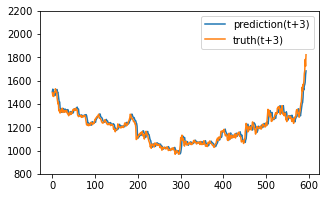

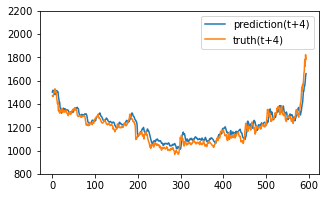

Test epoch:67 	Loss: 0.106362

Epoch: 68


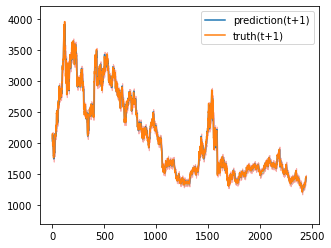

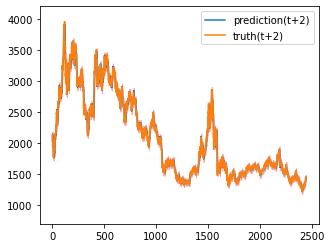

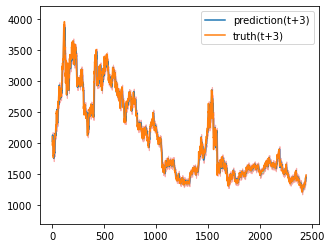

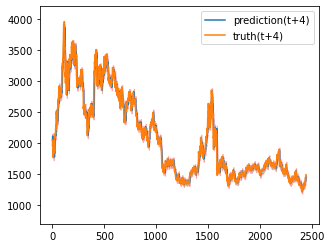

Train epoch:68 	Loss: -15.939519| Loss_in: 0.013837| Loss_out: 0.012592


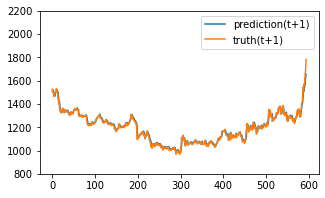

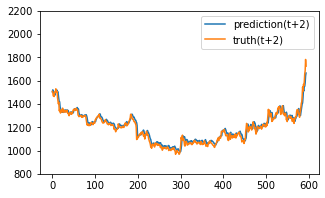

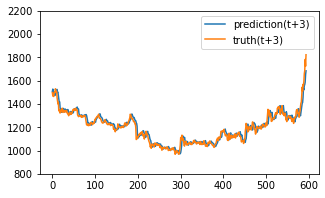

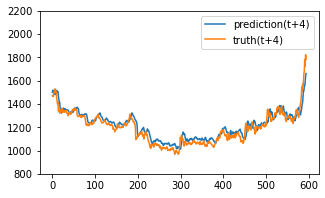

Test epoch:68 	Loss: 0.106542

Epoch: 69


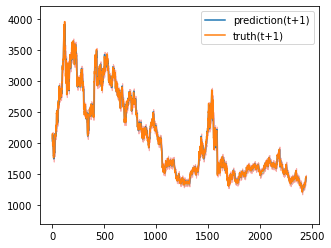

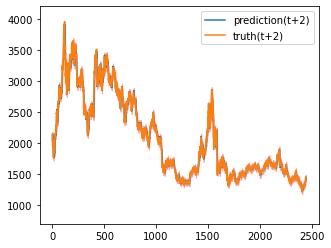

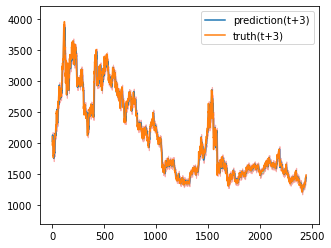

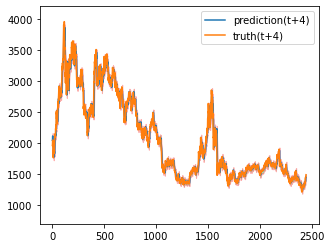

Train epoch:69 	Loss: -15.946995| Loss_in: 0.013727| Loss_out: 0.012873


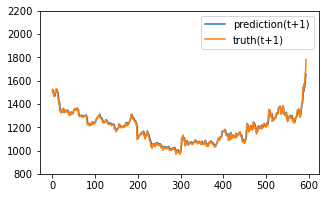

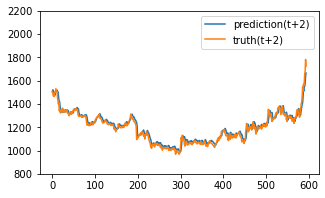

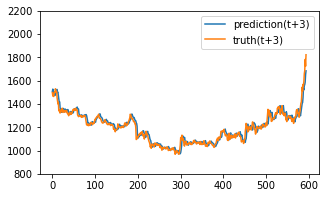

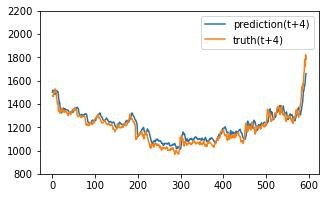

Test epoch:69 	Loss: 0.106603

Epoch: 70


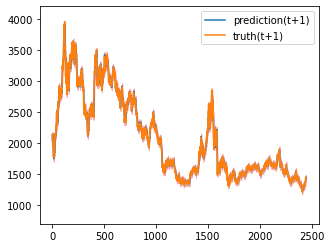

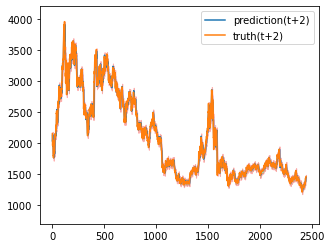

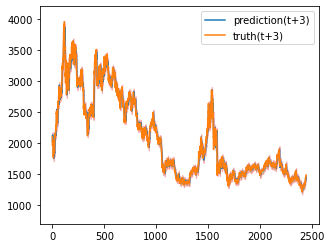

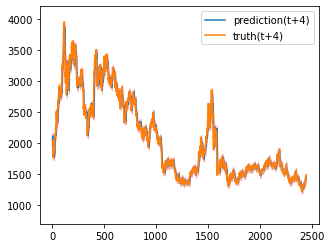

Train epoch:70 	Loss: -15.949826| Loss_in: 0.013636| Loss_out: 0.012420


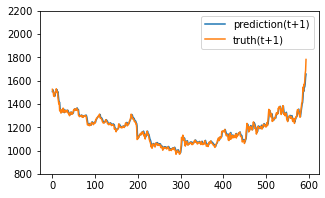

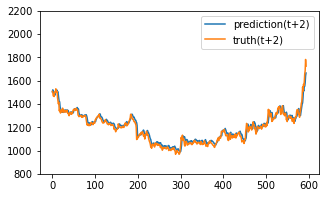

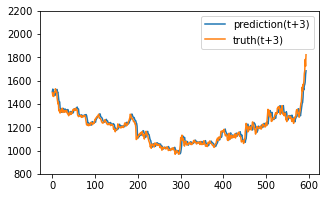

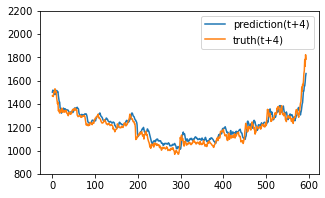

Test epoch:70 	Loss: 0.106464

Epoch: 71


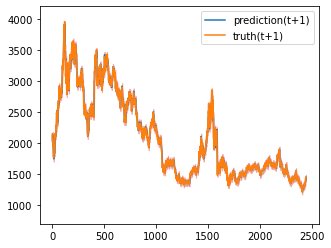

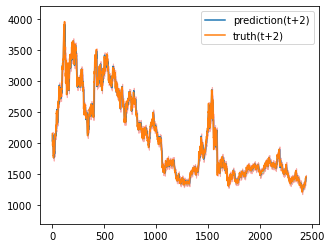

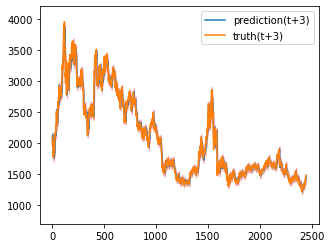

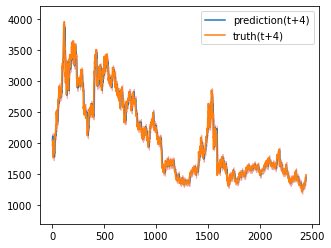

Train epoch:71 	Loss: -15.952462| Loss_in: 0.013556| Loss_out: 0.012592


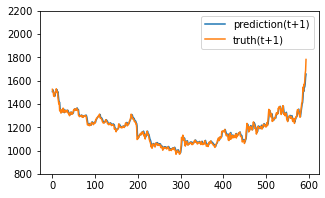

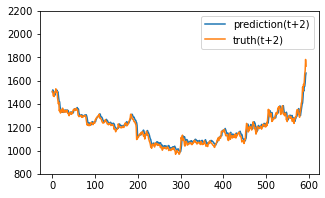

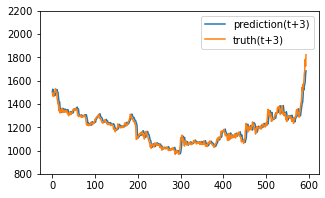

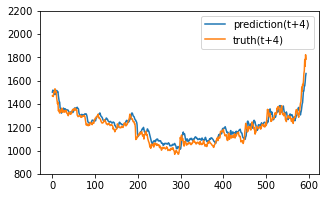

Test epoch:71 	Loss: 0.106394

Epoch: 72


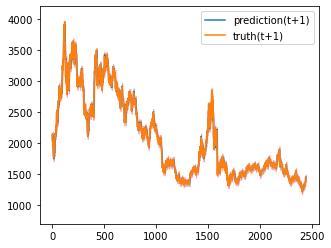

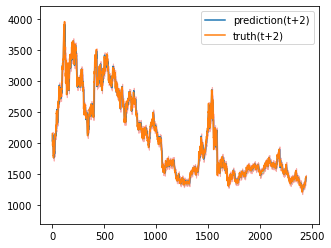

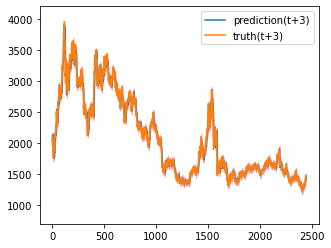

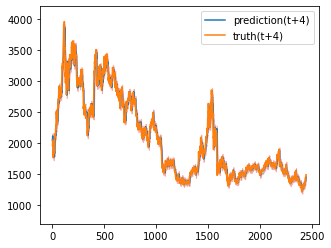

Train epoch:72 	Loss: -15.954298| Loss_in: 0.013458| Loss_out: 0.012668


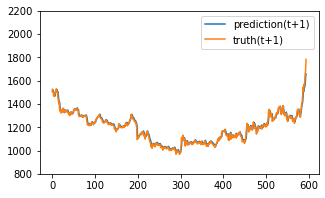

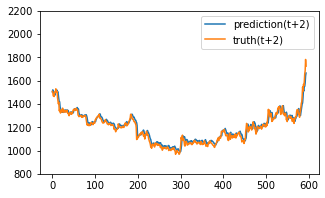

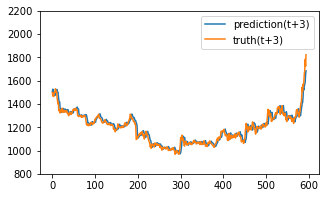

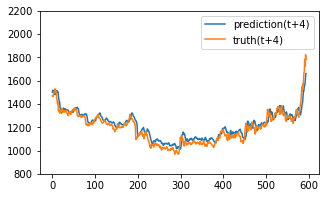

Test epoch:72 	Loss: 0.106599

Epoch: 73


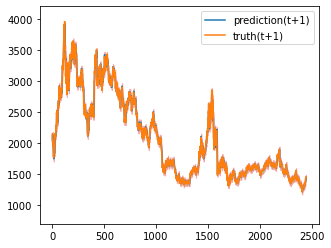

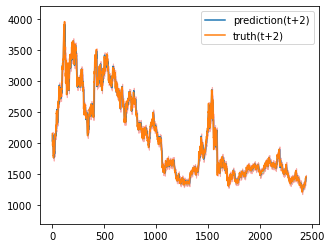

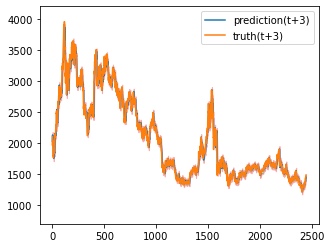

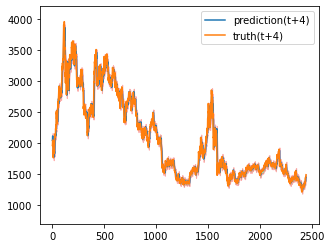

Train epoch:73 	Loss: -15.957973| Loss_in: 0.013422| Loss_out: 0.012292


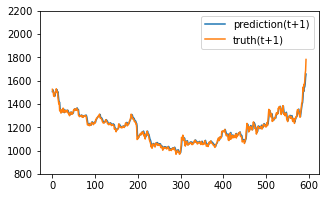

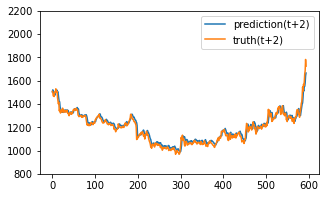

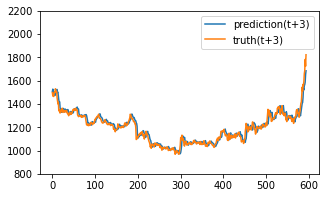

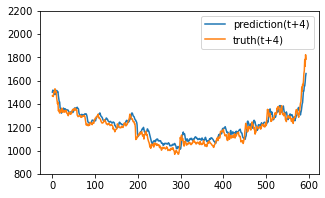

Test epoch:73 	Loss: 0.106556

Epoch: 74


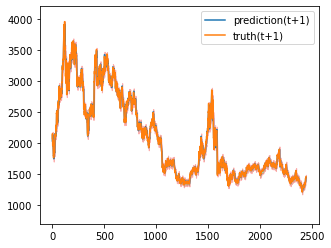

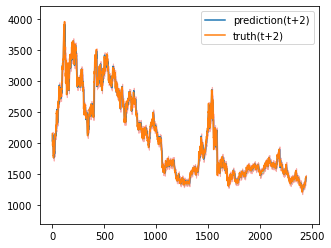

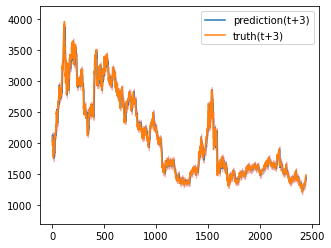

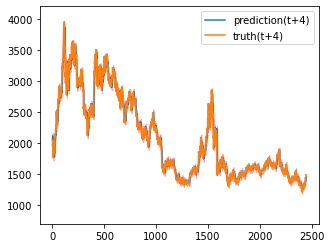

Train epoch:74 	Loss: -15.959985| Loss_in: 0.013268| Loss_out: 0.012267


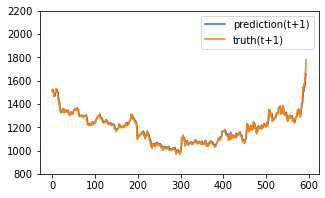

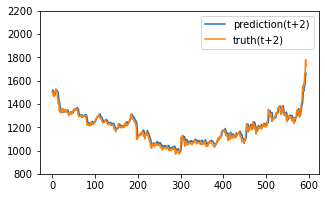

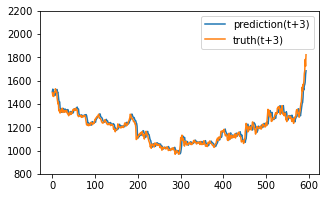

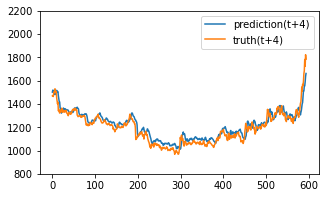

Test epoch:74 	Loss: 0.106603

Epoch: 75


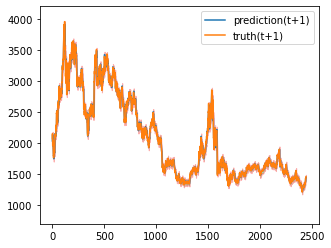

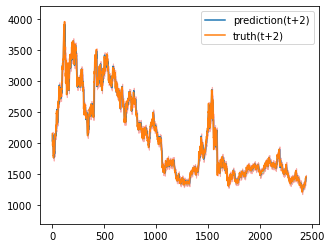

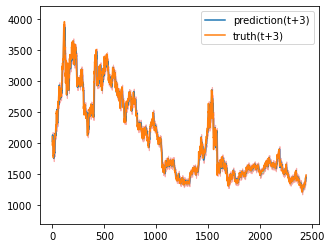

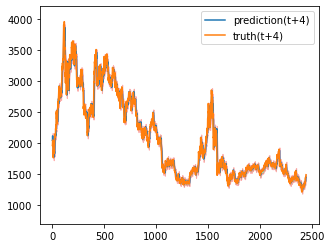

Train epoch:75 	Loss: -15.963566| Loss_in: 0.013217| Loss_out: 0.012216


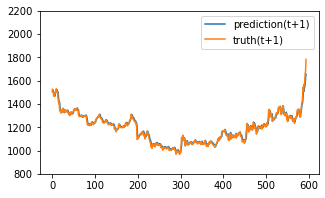

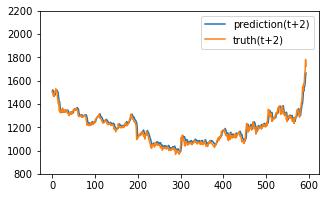

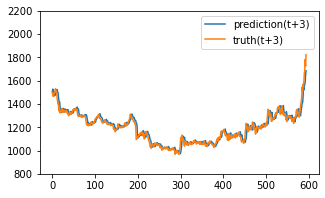

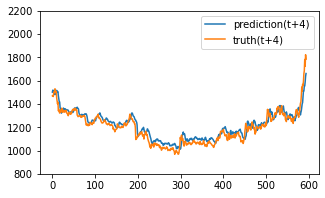

Test epoch:75 	Loss: 0.106499

Epoch: 76


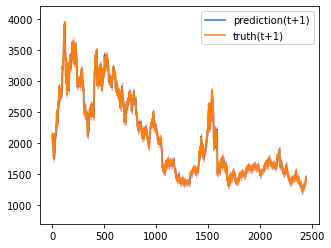

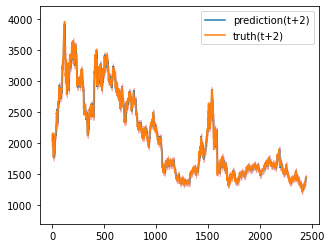

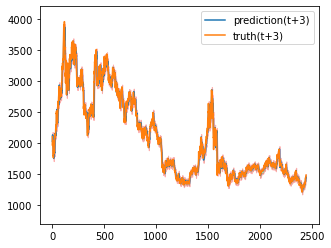

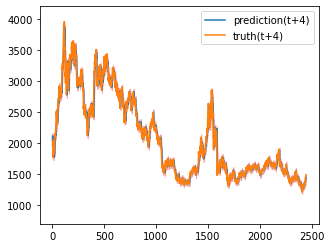

Train epoch:76 	Loss: -15.961507| Loss_in: 0.013147| Loss_out: 0.012166


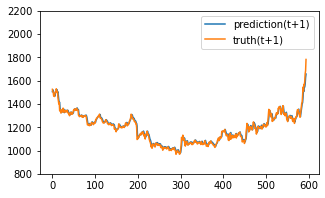

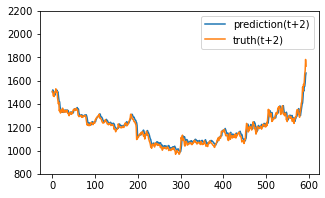

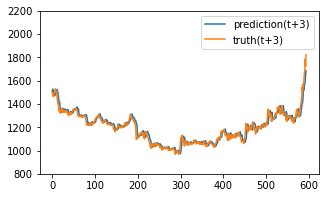

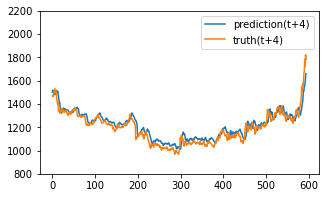

Test epoch:76 	Loss: 0.106156

Epoch: 77


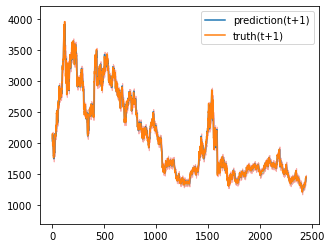

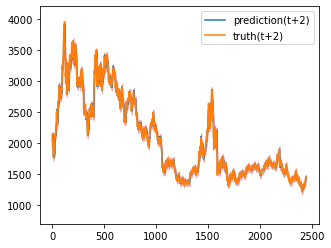

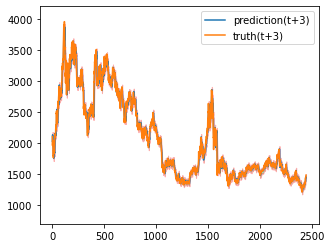

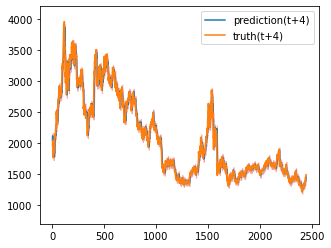

Train epoch:77 	Loss: -15.968459| Loss_in: 0.013131| Loss_out: 0.012460


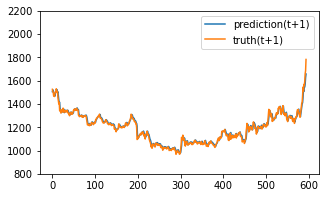

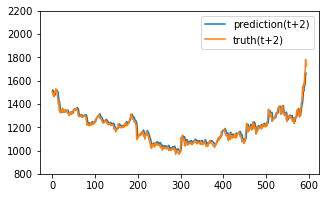

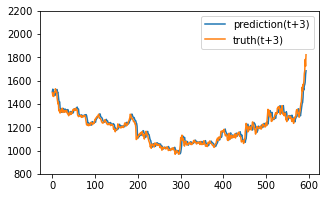

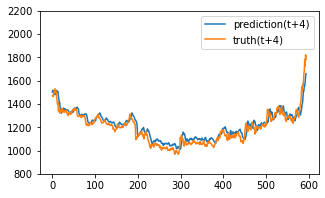

Test epoch:77 	Loss: 0.106300

Epoch: 78


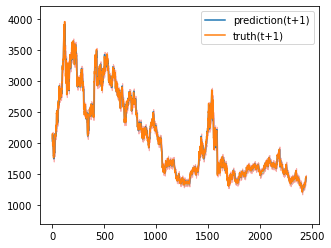

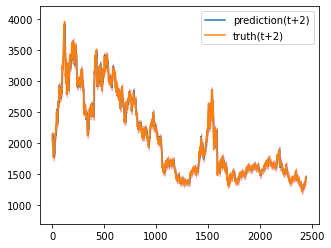

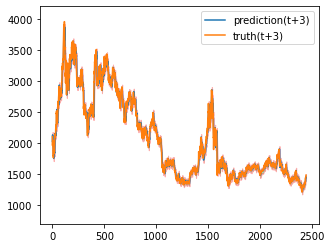

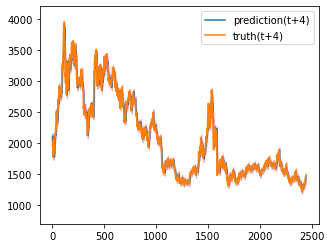

Train epoch:78 	Loss: -15.971049| Loss_in: 0.013051| Loss_out: 0.011805


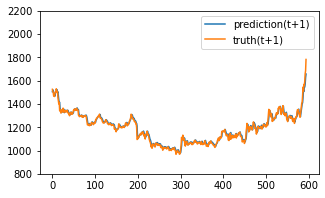

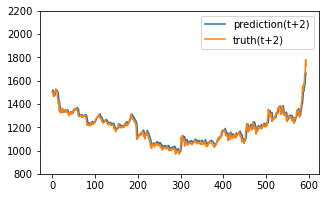

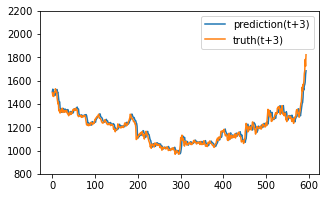

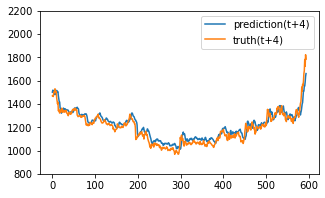

Test epoch:78 	Loss: 0.106397

Epoch: 79


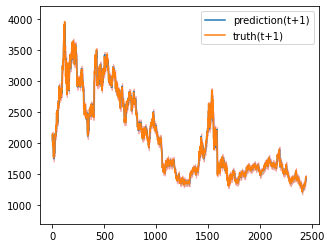

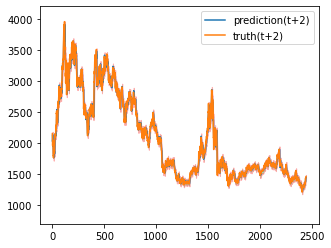

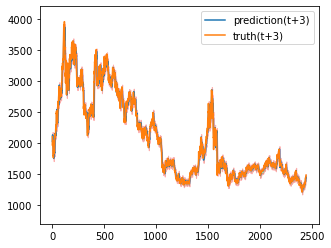

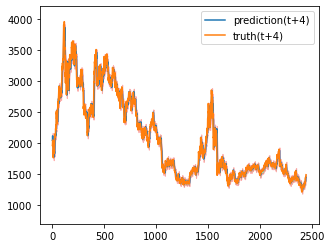

Train epoch:79 	Loss: -15.973053| Loss_in: 0.012893| Loss_out: 0.011863


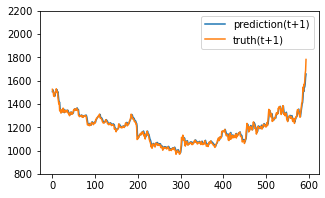

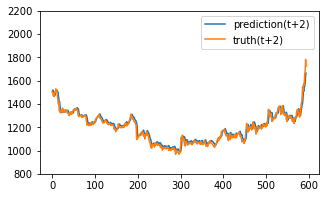

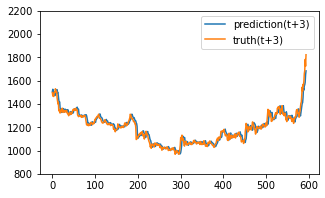

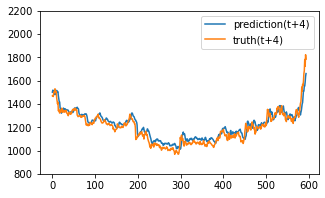

Test epoch:79 	Loss: 0.106135

Epoch: 80


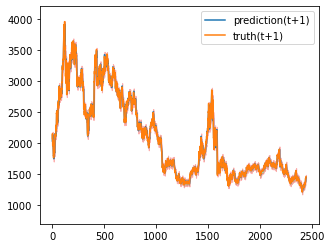

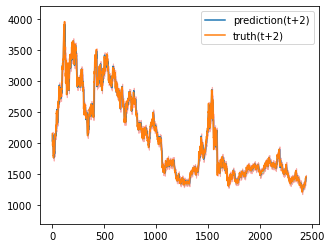

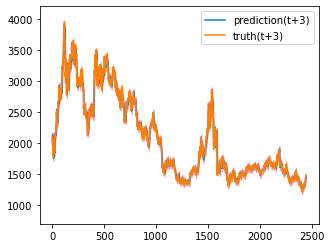

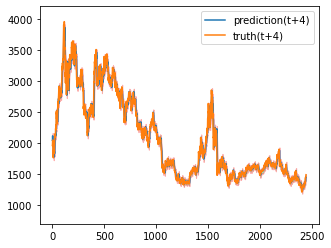

Train epoch:80 	Loss: -15.975766| Loss_in: 0.012834| Loss_out: 0.011968


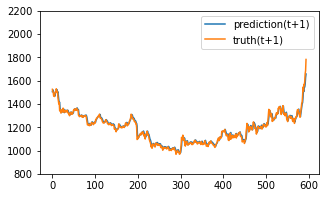

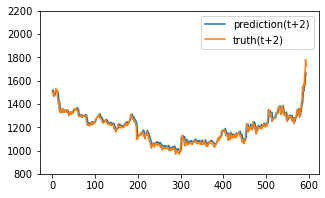

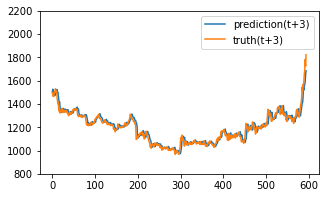

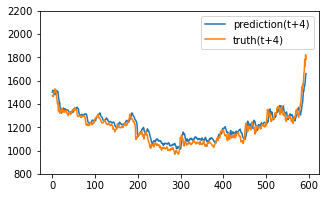

Test epoch:80 	Loss: 0.106445

Epoch: 81


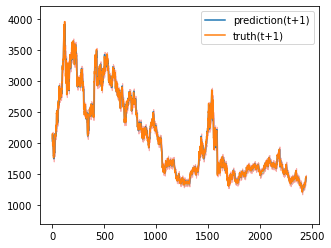

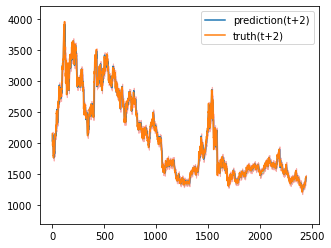

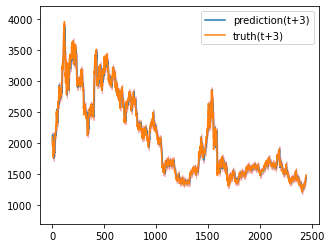

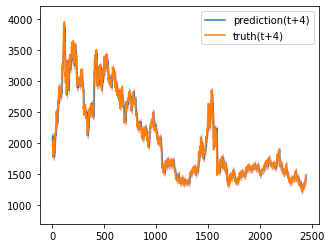

Train epoch:81 	Loss: -15.978827| Loss_in: 0.012756| Loss_out: 0.011950


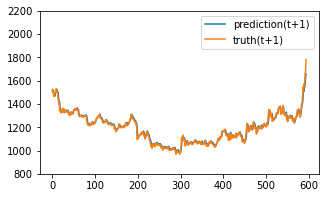

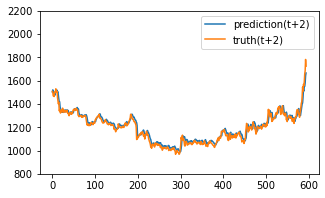

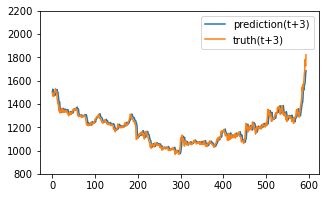

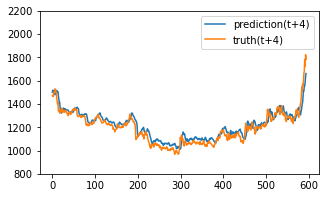

Test epoch:81 	Loss: 0.106653

Epoch: 82


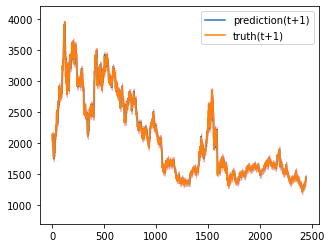

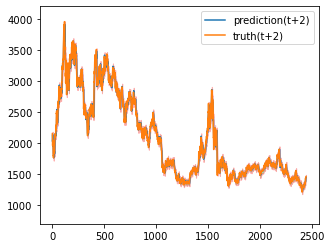

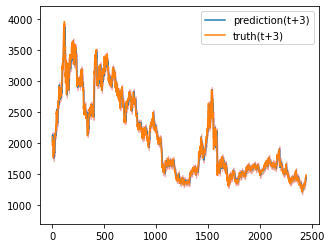

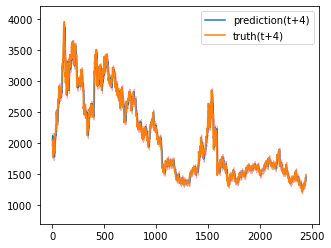

Train epoch:82 	Loss: -15.980886| Loss_in: 0.012747| Loss_out: 0.012028


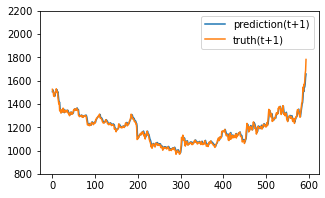

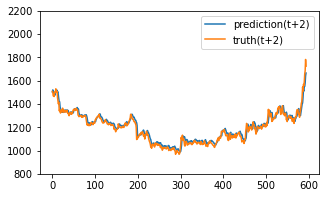

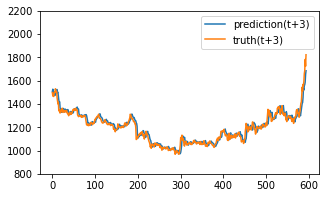

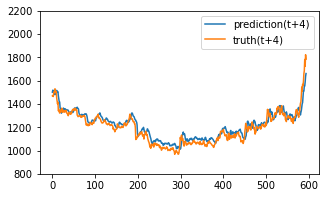

Test epoch:82 	Loss: 0.106435

Epoch: 83


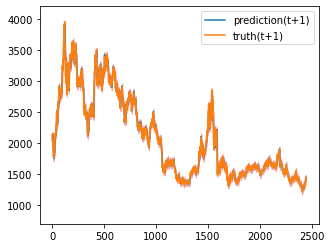

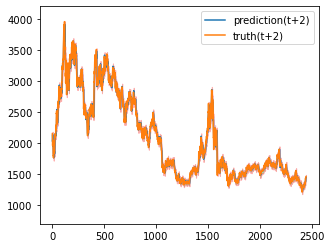

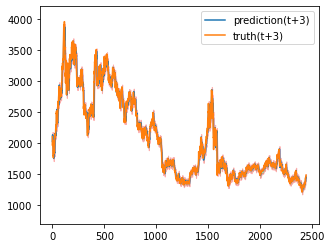

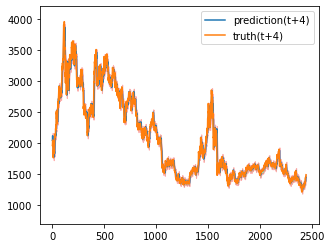

Train epoch:83 	Loss: -15.982995| Loss_in: 0.012717| Loss_out: 0.011705


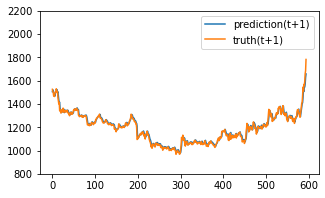

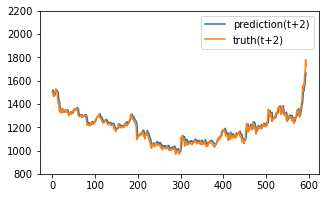

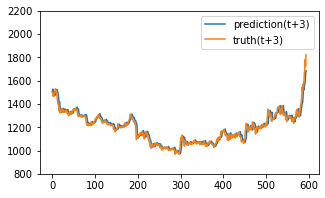

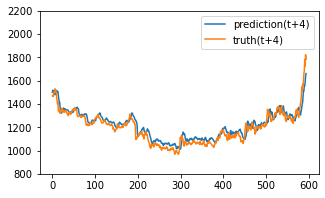

Test epoch:83 	Loss: 0.106457

Epoch: 84


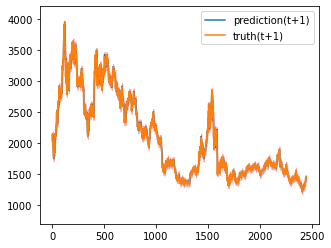

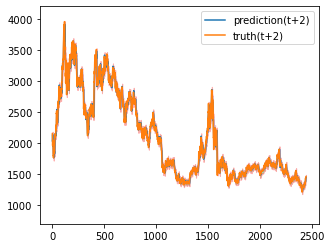

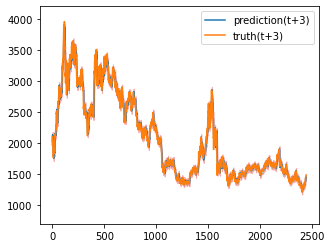

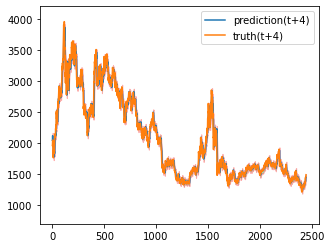

Train epoch:84 	Loss: -15.985935| Loss_in: 0.012649| Loss_out: 0.011746


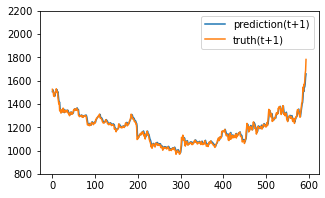

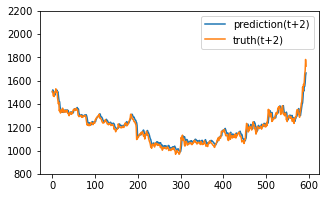

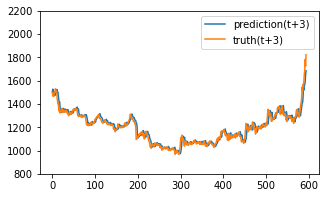

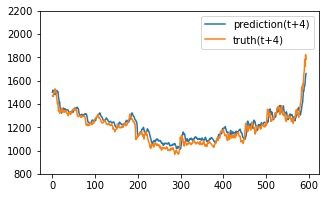

Test epoch:84 	Loss: 0.106624

Epoch: 85


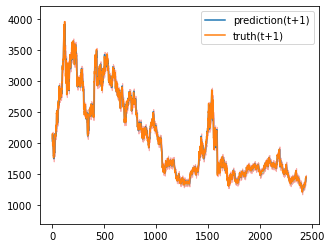

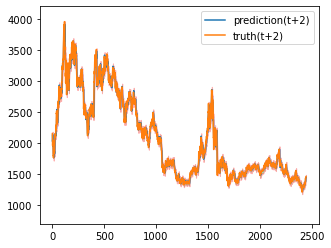

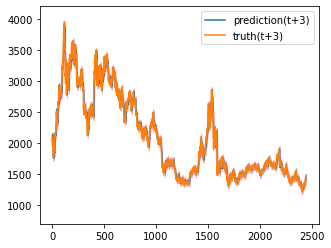

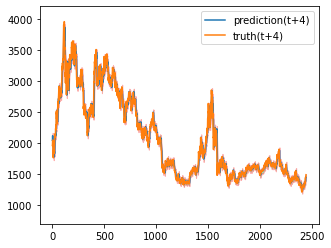

Train epoch:85 	Loss: -15.988276| Loss_in: 0.012562| Loss_out: 0.011650


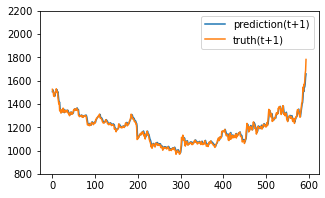

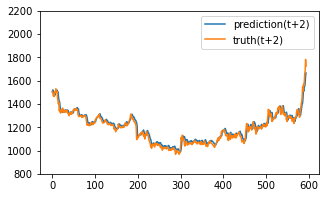

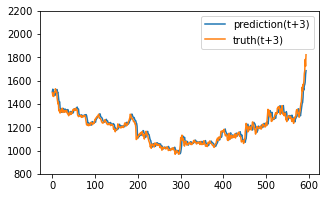

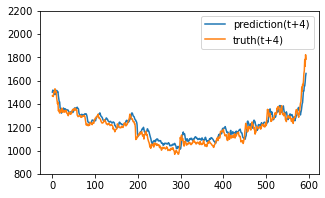

Test epoch:85 	Loss: 0.106500

Epoch: 86


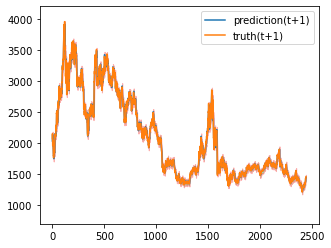

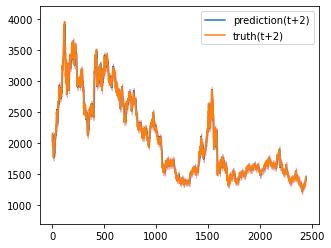

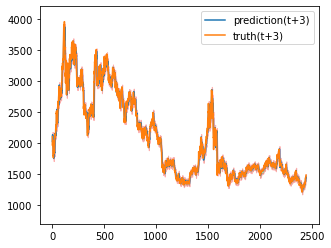

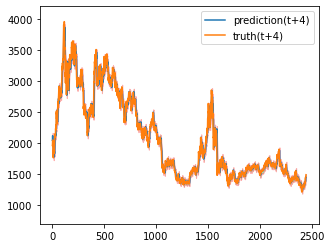

Train epoch:86 	Loss: -15.990635| Loss_in: 0.012533| Loss_out: 0.011743


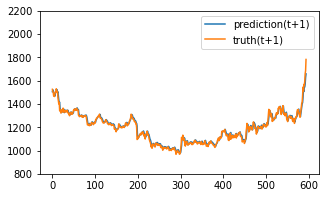

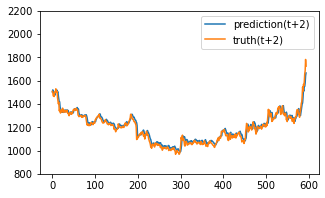

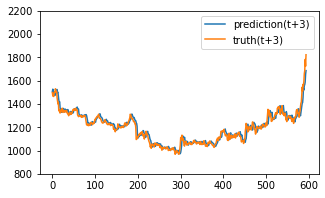

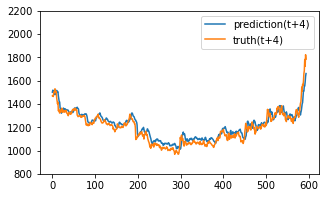

Test epoch:86 	Loss: 0.106342

Epoch: 87


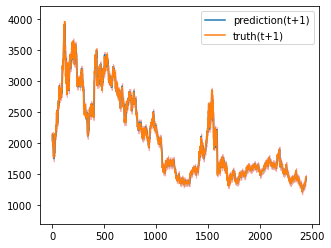

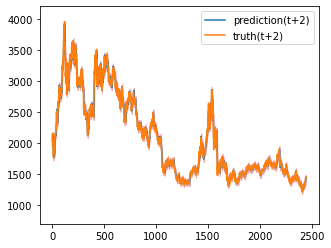

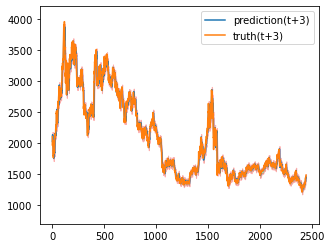

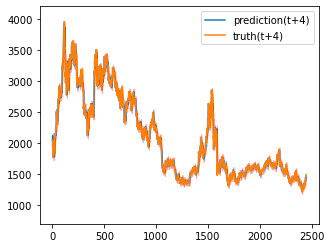

Train epoch:87 	Loss: -15.992740| Loss_in: 0.012508| Loss_out: 0.011683


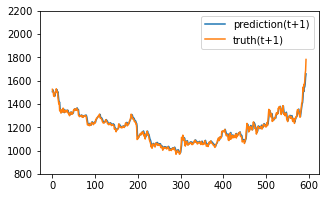

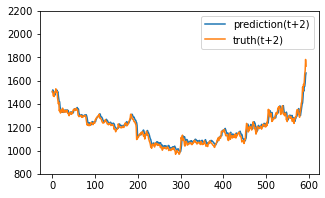

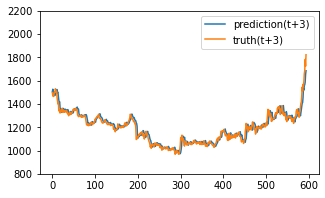

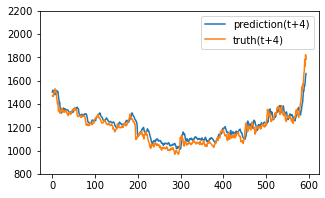

Test epoch:87 	Loss: 0.106565

Epoch: 88


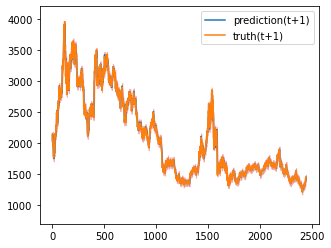

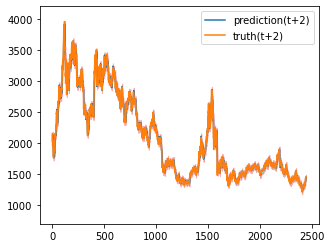

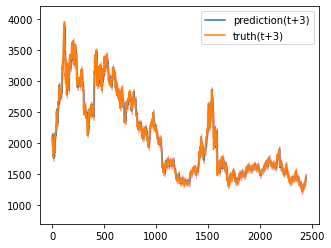

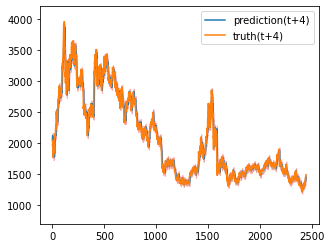

Train epoch:88 	Loss: -15.995165| Loss_in: 0.012461| Loss_out: 0.011361


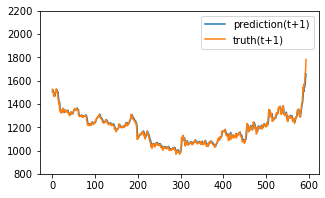

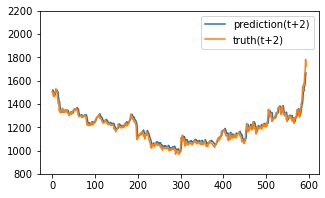

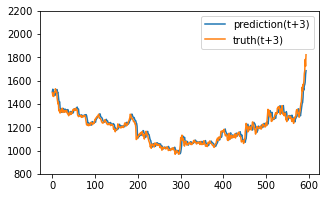

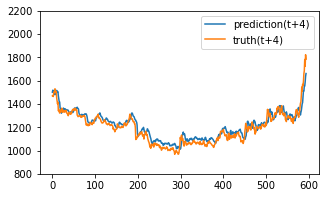

Test epoch:88 	Loss: 0.106259

Epoch: 89


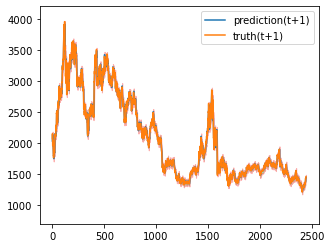

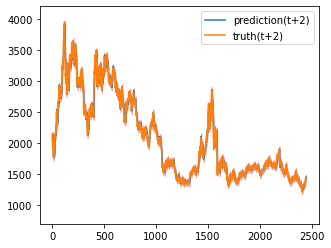

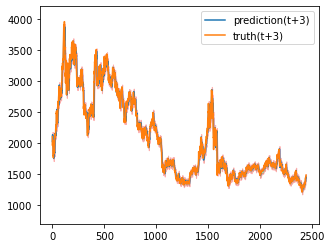

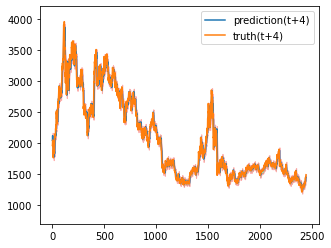

Train epoch:89 	Loss: -15.997330| Loss_in: 0.012394| Loss_out: 0.011633


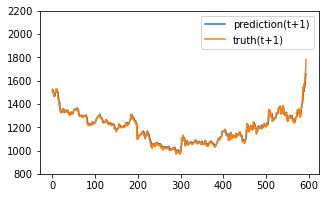

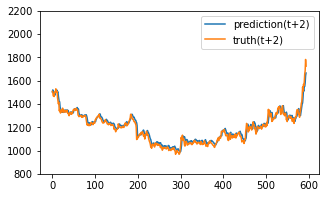

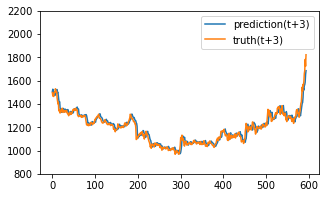

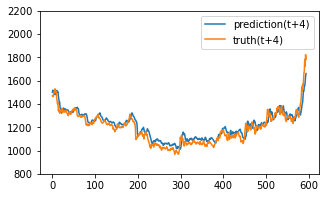

Test epoch:89 	Loss: 0.106431

Epoch: 90


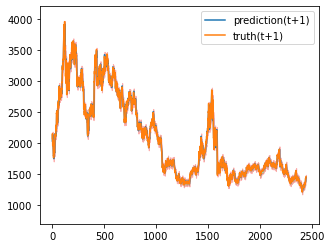

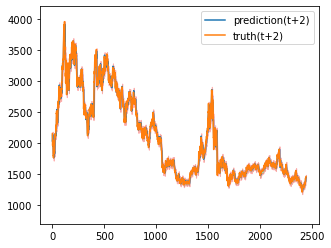

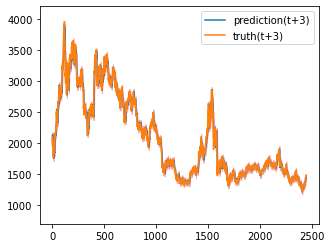

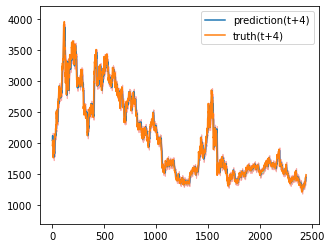

Train epoch:90 	Loss: -15.999014| Loss_in: 0.012327| Loss_out: 0.011543


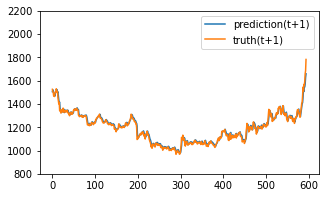

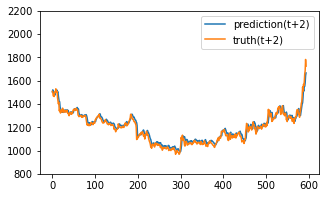

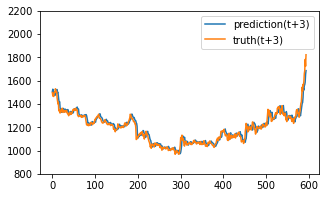

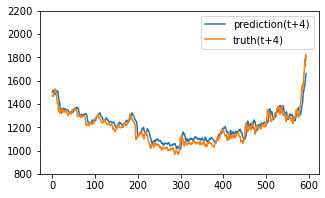

Test epoch:90 	Loss: 0.106756

Epoch: 91


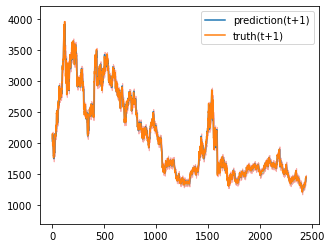

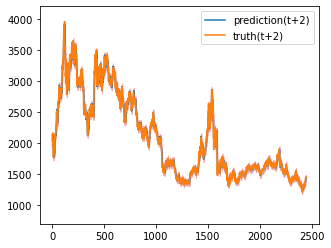

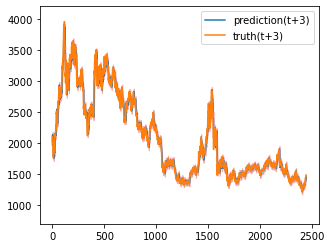

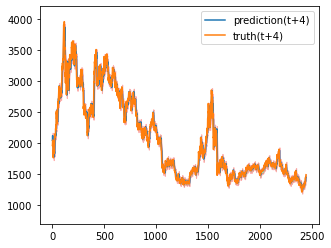

Train epoch:91 	Loss: -16.001778| Loss_in: 0.012261| Loss_out: 0.011503


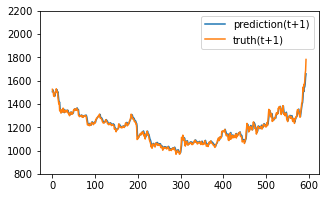

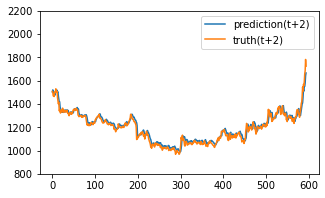

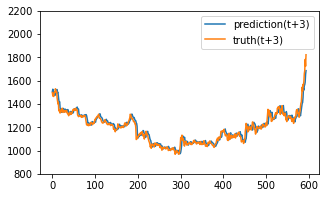

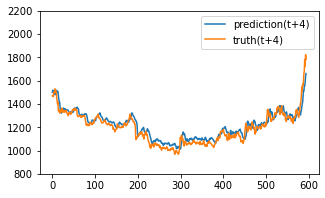

Test epoch:91 	Loss: 0.106499

Epoch: 92


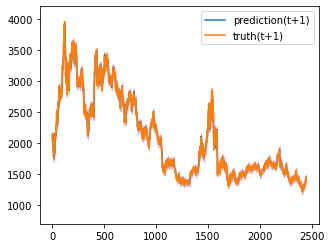

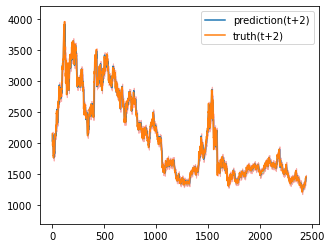

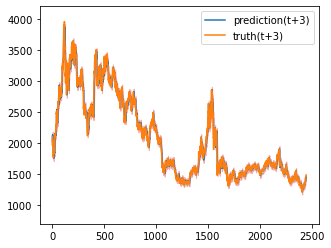

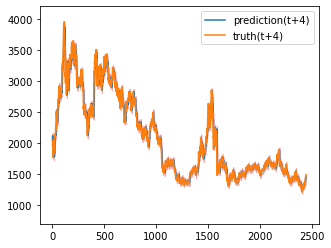

Train epoch:92 	Loss: -16.003986| Loss_in: 0.012254| Loss_out: 0.011280


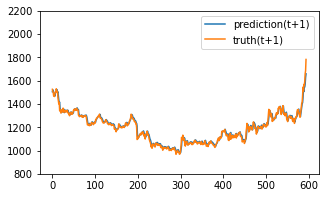

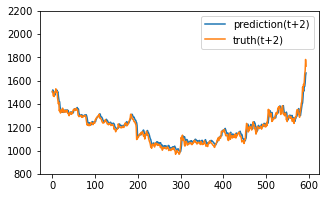

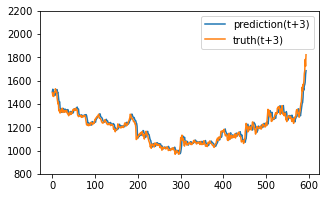

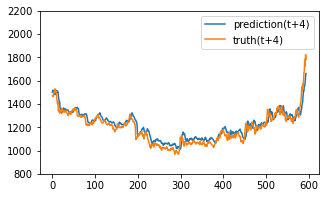

Test epoch:92 	Loss: 0.106597

Epoch: 93


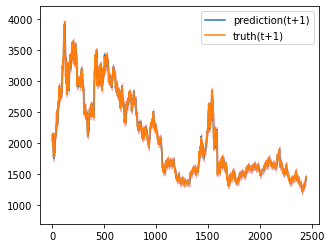

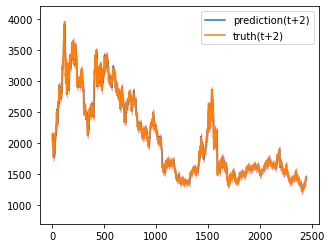

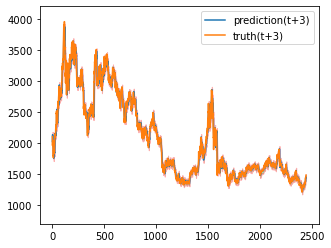

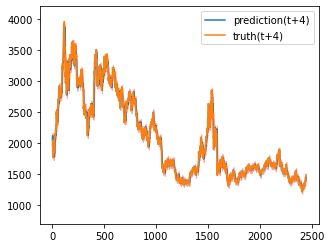

Train epoch:93 	Loss: -16.005536| Loss_in: 0.012147| Loss_out: 0.011205


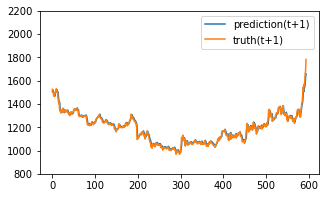

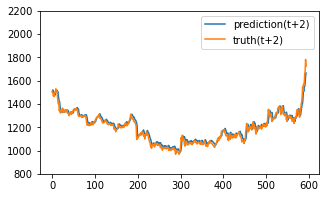

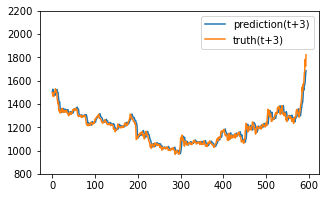

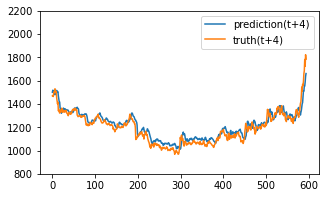

Test epoch:93 	Loss: 0.106183

Epoch: 94


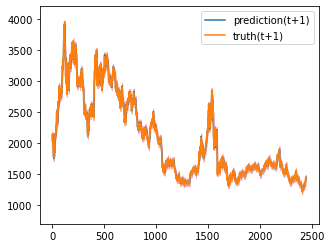

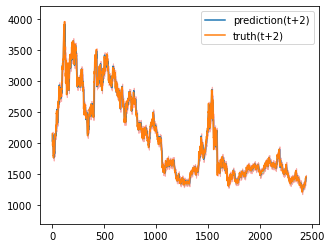

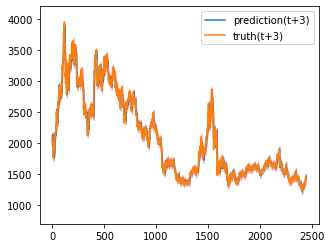

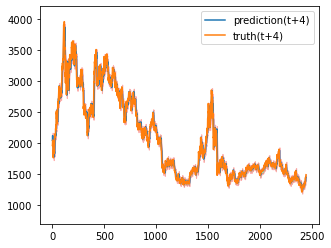

Train epoch:94 	Loss: -16.008004| Loss_in: 0.012113| Loss_out: 0.011327


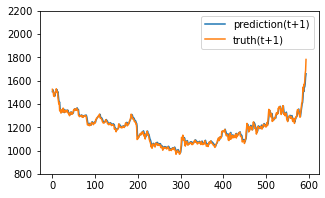

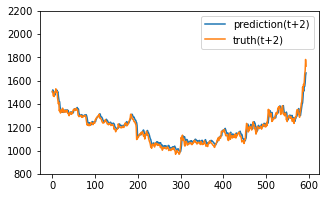

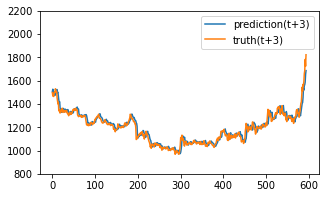

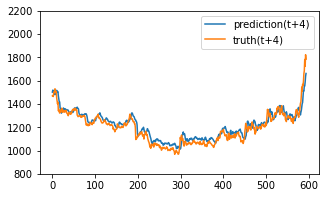

Test epoch:94 	Loss: 0.106796

Epoch: 95


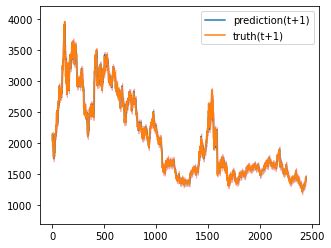

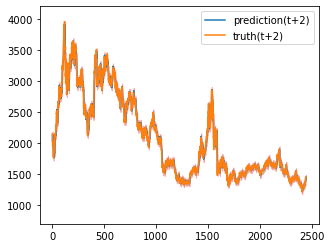

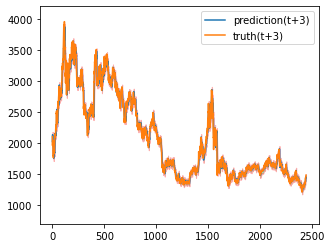

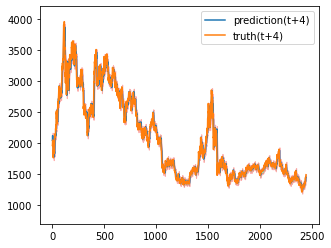

Train epoch:95 	Loss: -16.010412| Loss_in: 0.012089| Loss_out: 0.011230


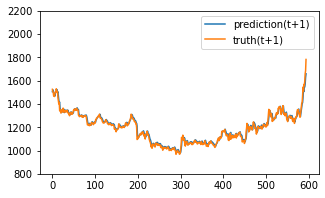

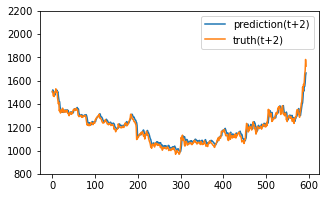

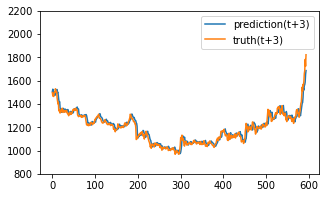

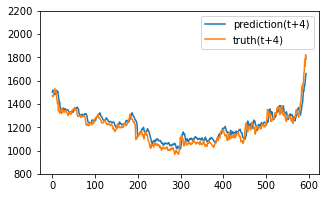

Test epoch:95 	Loss: 0.106894

Epoch: 96


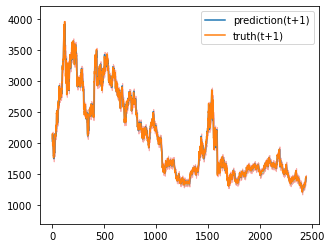

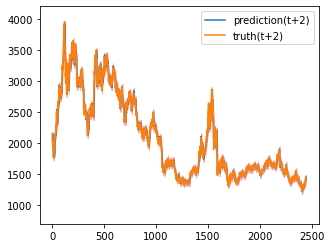

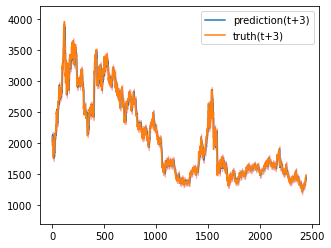

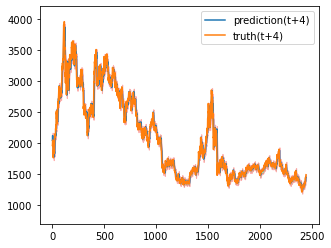

Train epoch:96 	Loss: -16.006610| Loss_in: 0.012070| Loss_out: 0.011148


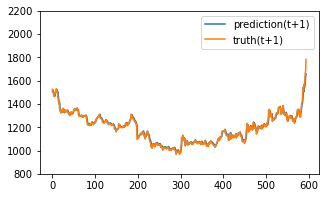

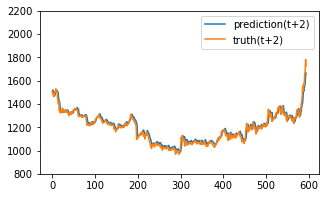

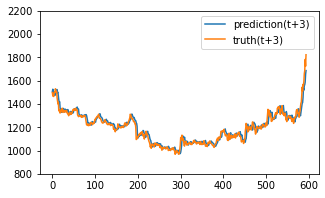

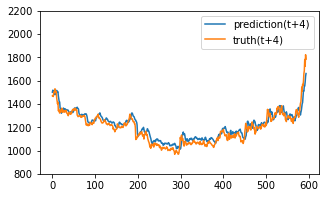

Test epoch:96 	Loss: 0.106302

Epoch: 97


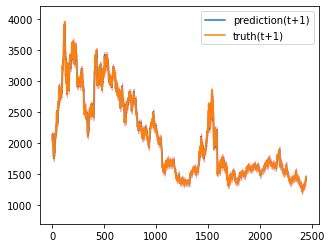

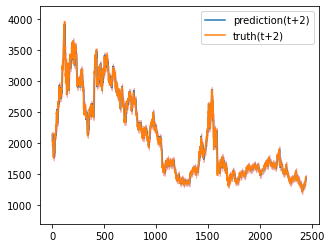

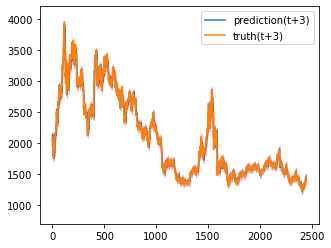

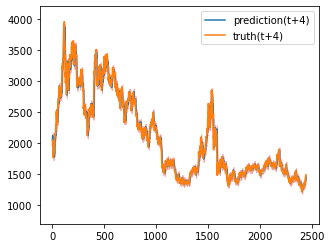

Train epoch:97 	Loss: -16.014577| Loss_in: 0.011995| Loss_out: 0.010795


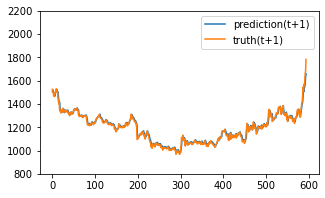

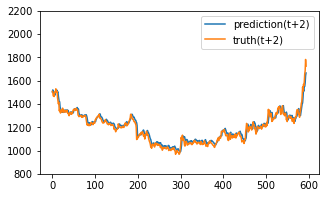

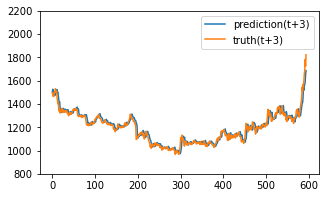

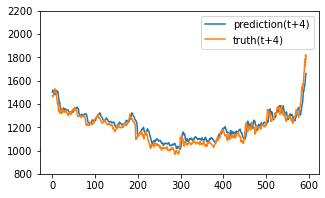

Test epoch:97 	Loss: 0.106553

Epoch: 98


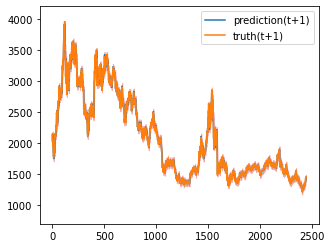

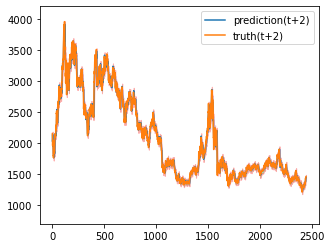

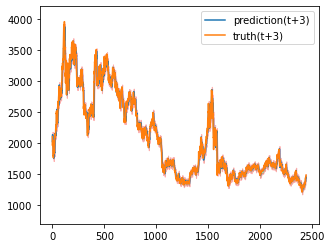

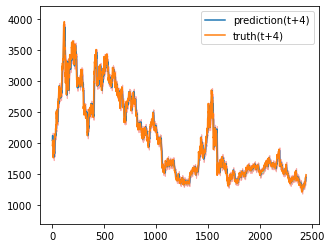

Train epoch:98 	Loss: -16.016918| Loss_in: 0.011900| Loss_out: 0.011339


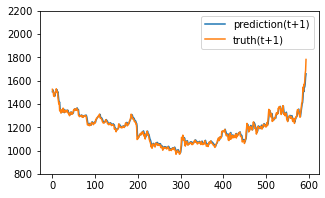

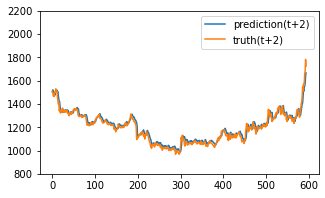

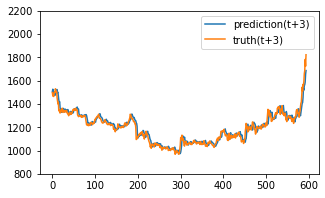

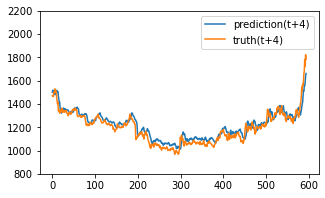

Test epoch:98 	Loss: 0.106770

Epoch: 99


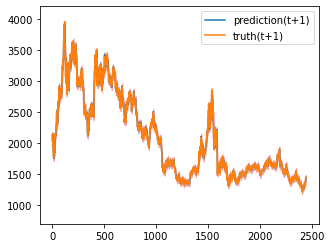

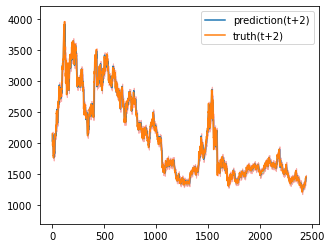

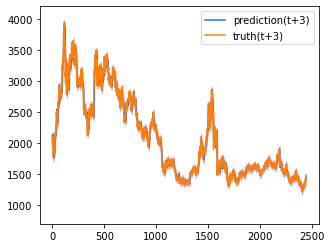

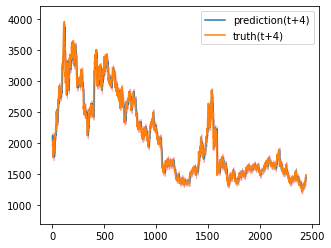

Train epoch:99 	Loss: -16.018852| Loss_in: 0.011894| Loss_out: 0.010993


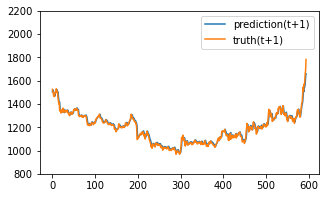

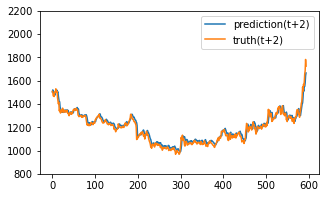

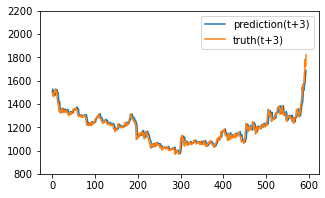

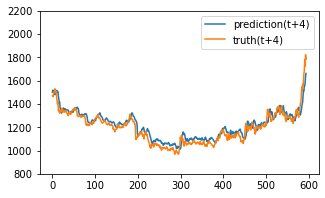

Test epoch:99 	Loss: 0.106740

Epoch: 100


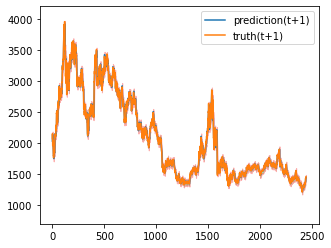

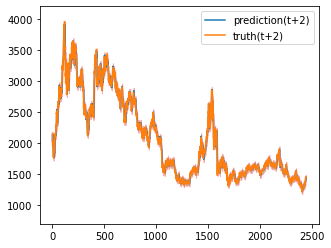

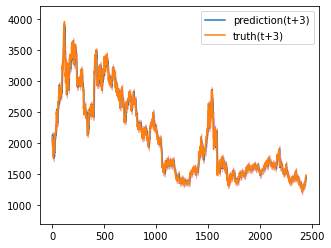

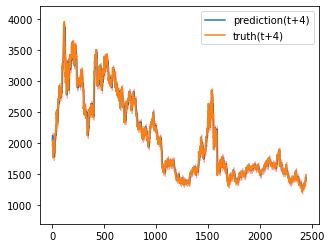

Train epoch:100 	Loss: -15.988383| Loss_in: 0.011894| Loss_out: 0.011140


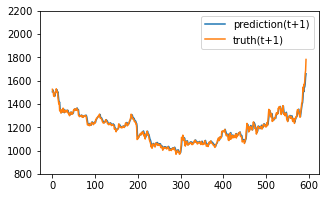

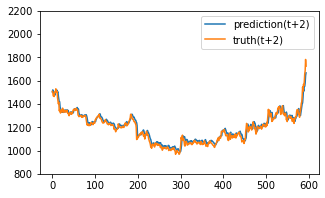

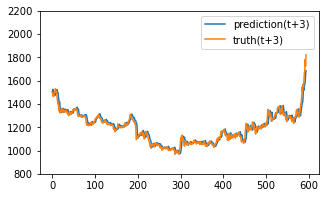

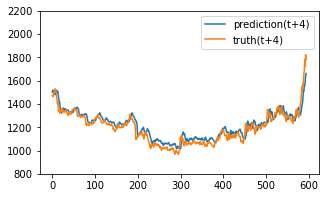

Test epoch:100 	Loss: 0.106472


In [51]:
path = os.path.join('/content/', 'output')
os.makedirs(path, exist_ok=True)
train_losses = []
test_losses = []
for epoch in range(1, args.epochs + 1):
    train_losses.append(train(epoch))
    test_losses.append(test(epoch))
    if epoch in args.decreasing_lr:
        for param_group in optimizer_F.param_groups:
            param_group['lr'] *= args.droprate

    if epoch in args.decreasing_lr2:
        for param_group in optimizer_G.param_groups:
            param_group['lr'] *= args.droprate

In [52]:
train_losses

[(0.26366553, 0.2441309, 0.21738492, 0.06401017),
 (0.062452015, 0.056771122, 0.044490494, 0.059319198),
 (0.053815853, 0.045838557, 0.037264377, 0.050177842),
 (0.041088015, 0.03476047, 0.03189921, 0.0410217),
 (0.029698689, 0.024733054, 0.025794672, 0.034575965),
 (0.021000385, 0.01921333, 0.022080176, 0.030034497),
 (0.015556985, 0.016606381, 0.020310083, 0.02727219),
 (0.012243263, 0.015165036, 0.019120872, 0.025614392),
 (0.010301717, 0.014247829, 0.01818496, 0.024565572),
 (0.0093407305, 0.013322195, 0.01751225, 0.023805426),
 (0.0082057165, 0.012568453, 0.016896654, 0.02313221),
 (0.0074278964, 0.011981964, 0.016448125, 0.02257433),
 (0.0070085954, 0.01162738, 0.016184011, 0.022159146),
 (0.0073243934, 0.011798447, 0.016337356, 0.021939518),
 (0.0063488632, 0.011267296, 0.0158808, 0.021677328),
 (0.006013689, 0.010829338, 0.015599254, 0.021271368),
 (0.0057798927, 0.0106013715, 0.015420332, 0.020975653),
 (0.005610776, 0.010438276, 0.01529482, 0.020691326),
 (0.005482572, 0.0103

In [53]:
test_losses

[(0.36296868, 0.5933934, 0.76249874, 0.008650813),
 (0.0062492155, 0.03247514, 0.007212077, 0.008618475),
 (0.0067784134, 0.011171829, 0.0062107127, 0.008056161),
 (0.0057032546, 0.0071465336, 0.005630526, 0.006978055),
 (0.0043868916, 0.0049134544, 0.004528942, 0.006526325),
 (0.00243819, 0.0034013465, 0.0042811926, 0.0065882755),
 (0.0028568974, 0.0030522184, 0.004346946, 0.006011853),
 (0.0021974402, 0.0033840446, 0.0044602, 0.005756679),
 (0.0014145874, 0.0025589226, 0.003789722, 0.005654982),
 (0.0014622671, 0.0024120642, 0.003473987, 0.0054830494),
 (0.001289112, 0.0025291166, 0.0035838343, 0.0050301985),
 (0.0011923164, 0.002470914, 0.0037055153, 0.0049660904),
 (0.0014102913, 0.0021370111, 0.003265553, 0.0047253696),
 (0.0014660992, 0.0032620584, 0.0033423114, 0.004751109),
 (0.001474286, 0.0022402038, 0.003259813, 0.0046344358),
 (0.0010634328, 0.0020974835, 0.0030591872, 0.00465137),
 (0.0011569527, 0.0022478504, 0.0031106337, 0.0048470004),
 (0.0010230712, 0.0020930888, 0.00

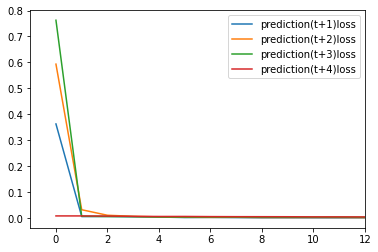

In [54]:
plt.plot(test_losses)
plt.xlim(-1,12)
plt.legend(('prediction(t+1)loss','prediction(t+2)loss','prediction(t+3)loss','prediction(t+4)loss'))
plt.show()

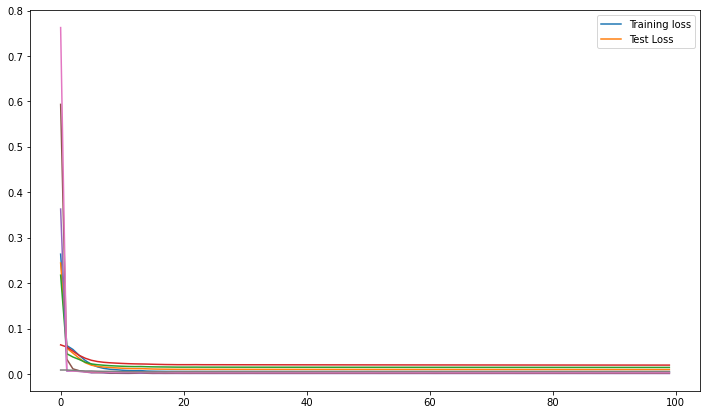

(0.0009455128, 0.0021150932, 0.0028728142, 0.0054027694)


In [55]:
plt.figure(figsize=(12,7))
plt.plot(train_losses)
plt.plot(test_losses)
plt.legend(('Training loss','Test Loss'))
plt.savefig(os.path.join('/content/output/','Loss'), dpi=300)
plt.show()
print(test_losses[-1])